# Preprocess Raw Data and Build Dataset

In [6]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import matplotlib.dates as mdates

import statsmodels.tsa.seasonal as sts

plt.rcParams.update({"font.size": 14})

# Load Data

In [7]:
data_folder = os.path.join("..", "..", "data", "tarragona")

raw_data_folder = os.path.join(data_folder, "raw_data")
intermediate_data_folder = os.path.join(
    data_folder, "intermediate_data"
)
clean_data_folder = os.path.join(data_folder, "clean_data")

deliverable_folder = os.path.join("..", "deliverable")

In [8]:
datasets_dict = {}

datasets_dict["TORTOSA"] = {}
datasets_dict["GUIAMETS"] = {}
datasets_dict["MEQUINENZA"] = {}
datasets_dict["XERTA"] = {}

In [9]:
for file in os.listdir(raw_data_folder):
    location = file.split("_")[0]
    feature_name = "_".join(file.split("_")[1:-2])
    if file.endswith(".csv"):
        datasets_dict[location][feature_name] = pd.read_csv(
            filepath_or_buffer=os.path.join(raw_data_folder, file),
            sep=";",
            decimal=",",
            header=0,
            encoding="utf-8",
        )
    elif file.endswith(".xlsx") and file != "raw_full_dataset.xlsx" and file != "raw_full_dataset_summary.xlsx":
        datasets_dict[location][feature_name] = pd.read_excel(
            os.path.join(raw_data_folder, file),
            header=0,
        )

In [10]:
tortosa_dfs = datasets_dict["TORTOSA"]
guiamets_dfs = datasets_dict["GUIAMETS"]
mequinenza_dfs = datasets_dict["MEQUINENZA"]
xerta_dfs = datasets_dict["XERTA"]

# Tortosa Preprocessing

In [11]:
tortosa_dfs.keys()

dict_keys(['turbidity', 'cumulated_rainfall_24h', 'flowriver', 'water_temperature', 'conductivity', 'watertemperature'])

In [12]:
# The water temperature has two datasets, but the excel one has no missing values
tortosa_dfs["watertemperature"].isna().sum() / tortosa_dfs[
    "watertemperature"
].shape[0]

Fecha       0.0
Promedio    0.0
Mínimo      0.0
Máximo      0.0
Nºdat       0.0
NºOK        0.0
dtype: float64

In [13]:
tortosa_dfs["water_temperature"].isna().sum() / tortosa_dfs[
    "water_temperature"
].shape[0]

M�ximo          0.014815
M�nimo          0.014815
Media           0.014815
Fecha m�ximo    0.014815
Fecha m�nimo    0.014815
fecha           0.000000
dtype: float64

In [14]:
tortosa_dfs.pop("water_temperature")

,M�ximo,M�nimo,Media,Fecha m�ximo,Fecha m�nimo,fecha
0,28.0,26.9,27.8,2012-08-29 16:15:00,2012-08-29 12:45:00,2012-08-29 00:00:00
1,27.6,26.2,26.7,2012-08-30 00:00:00,2012-08-30 23:45:00,2012-08-30 00:00:00
2,26.1,24.7,25.3,2012-08-31 00:00:00,2012-08-31 09:45:00,2012-08-31 00:00:00
3,24.8,23.5,23.9,2012-09-01 00:00:00,2012-09-01 11:45:00,2012-09-01 00:00:00
4,24.2,22.6,23.3,2012-09-02 18:00:00,2012-09-02 12:00:00,2012-09-02 00:00:00
...,...,...,...,...,...,...
4045,26.3,24.9,25.5,2023-09-26 17:30:00,2023-09-26 07:15:00,2023-09-26 00:00:00
4046,26.9,25.5,26.1,2023-09-27 18:30:00,2023-09-27 07:30:00,2023-09-27 00:00:00
4047,27.2,25.7,26.3,2023-09-28 18:30:00,2023-09-28 09:00:00,2023-09-28 00:00:00
4048,27.4,25.9,26.5,2023-09-29 18:15:00,2023-09-29 09:00:00,2023-09-29 00:00:00


In [15]:
# Check cumulated rainfall data since it is the only csv file
tortosa_dfs["cumulated_rainfall_24h"]

,Acumulado,Fecha acumulado,M�ximo,Fecha m�ximo,fecha
0,0.0,2004-07-04 00:00:00,NaN,NaN,2004-07-04 00:00:00
1,0.8,2004-07-05 00:00:00,NaN,NaN,2004-07-05 00:00:00
2,2.4,2004-07-06 00:00:00,NaN,NaN,2004-07-06 00:00:00
3,0.8,2004-07-07 00:00:00,NaN,NaN,2004-07-07 00:00:00
4,0.0,2004-07-08 00:00:00,NaN,NaN,2004-07-08 00:00:00
...,...,...,...,...,...
7023,0.0,2023-09-26 00:00:00,NaN,NaN,2023-09-26 00:00:00
7024,0.0,2023-09-27 00:00:00,NaN,NaN,2023-09-27 00:00:00
7025,0.0,2023-09-28 00:00:00,NaN,NaN,2023-09-28 00:00:00
7026,0.0,2023-09-29 00:00:00,NaN,NaN,2023-09-29 00:00:00


In [16]:
# fecha column is the one to take into account since
# it is equal to the Fecha acumulado column in the same dataframe
# but it has no missing values
mask = (
    tortosa_dfs["cumulated_rainfall_24h"]["Fecha acumulado"]
    == tortosa_dfs["cumulated_rainfall_24h"]["fecha"]
)
tortosa_dfs["cumulated_rainfall_24h"][mask == False]

,Acumulado,Fecha acumulado,M�ximo,Fecha m�ximo,fecha
69,NaN,NaN,NaN,NaN,2004-09-11 00:00:00
70,NaN,NaN,NaN,NaN,2004-09-12 00:00:00
71,NaN,NaN,NaN,NaN,2004-09-13 00:00:00
72,NaN,NaN,NaN,NaN,2004-09-14 00:00:00
73,NaN,NaN,NaN,NaN,2004-09-15 00:00:00
74,NaN,NaN,NaN,NaN,2004-09-16 00:00:00
75,NaN,NaN,NaN,NaN,2004-09-17 00:00:00
76,NaN,NaN,NaN,NaN,2004-09-18 00:00:00
77,NaN,NaN,NaN,NaN,2004-09-19 00:00:00
78,NaN,NaN,NaN,NaN,2004-09-20 00:00:00


In [17]:
tortosa_dfs["cumulated_rainfall_24h"].isna().sum() / tortosa_dfs[
    "cumulated_rainfall_24h"
].shape[0]

Acumulado          0.004269
Fecha acumulado    0.004269
M�ximo             1.000000
Fecha m�ximo       1.000000
fecha              0.000000
dtype: float64

In [18]:
tortosa_dfs["cumulated_rainfall_24h"] = tortosa_dfs[
    "cumulated_rainfall_24h"
][["fecha", "Acumulado"]].rename(
    columns={"fecha": "DateTime", "Acumulado": "Average"}
)

In [19]:
tortosa_dfs["conductivity"].isna().sum() / tortosa_dfs[
    "conductivity"
].shape[0]

Fecha       0.0
Promedio    0.0
Mínimo      0.0
Máximo      0.0
Nºdat       0.0
NºOK        0.0
dtype: float64

In [20]:
tortosa_dfs["flowriver"].isna().sum() / tortosa_dfs["flowriver"].shape[
    0
]

Fecha       0.0
Promedio    0.0
Mínimo      0.0
Máximo      0.0
Nºdat       0.0
NºOK        0.0
dtype: float64

In [21]:
tortosa_dfs["turbidity"].isna().sum() / tortosa_dfs["turbidity"].shape[
    0
]

Fecha       0.0
Promedio    0.0
Mínimo      0.0
Máximo      0.0
Nºdat       0.0
NºOK        0.0
dtype: float64

In [22]:
for feature, df in tortosa_dfs.items():
    if feature != "cumulated_rainfall_24h":
        df.rename(
            columns={
                "Fecha": "DateTime",
                "Promedio": "Average",
                "Máximo": "Maximum",
                "Mínimo": "Minimum",
            },
            inplace=True,
        )

In [23]:
for df in tortosa_dfs.values():
    df["DateTime"] = pd.to_datetime(df["DateTime"])
    df[df.columns.difference(["DateTime"])] = df[
        df.columns.difference(["DateTime"])
    ].apply(pd.to_numeric, errors="coerce")

In [24]:
# Check for missing values in the datasets
for feature, df in tortosa_dfs.items():
    print(f"{feature}: {df.isna().sum().sum()}")

turbidity: 5508
cumulated_rainfall_24h: 30
flowriver: 138
conductivity: 906
watertemperature: 324


In [25]:
# For the moment, drop the missing values
for feature, df in tortosa_dfs.items():
    tortosa_dfs[feature] = df.dropna()

## Outliers Detection and Missing Values

0.7890825950271506
6998


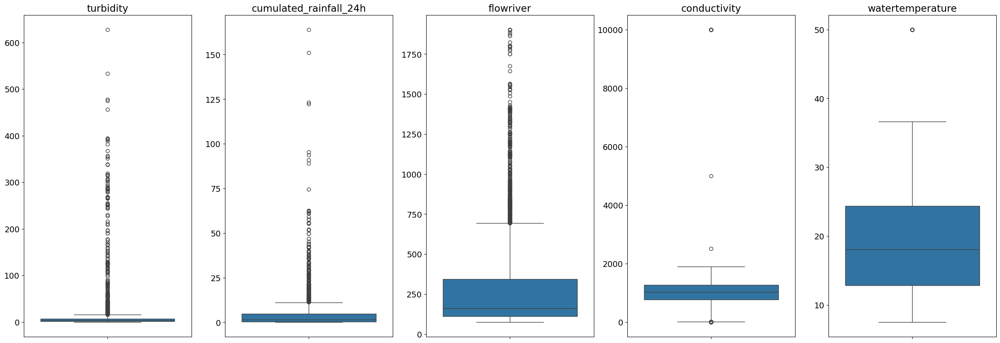

In [26]:
fig, axs = plt.subplots(1, len(tortosa_dfs.keys()), figsize=(30, 10))

for i, (feature, df) in enumerate(tortosa_dfs.items()):
    if feature == "cumulated_rainfall_24h":
        gtz_df = df[df["Average"] > 0]
        sns.boxplot(data=gtz_df, y="Average", ax=axs[i])
        # number of values = 0
        print(df[df["Average"] == 0].shape[0] / df.shape[0])
        print(df.shape[0])
    else:
        sns.boxplot(data=df, y="Average", ax=axs[i])

    # remove y-axis label
    axs[i].set_ylabel("")
    axs[i].set_title(feature)

### Inspect Data

#### Histograms

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


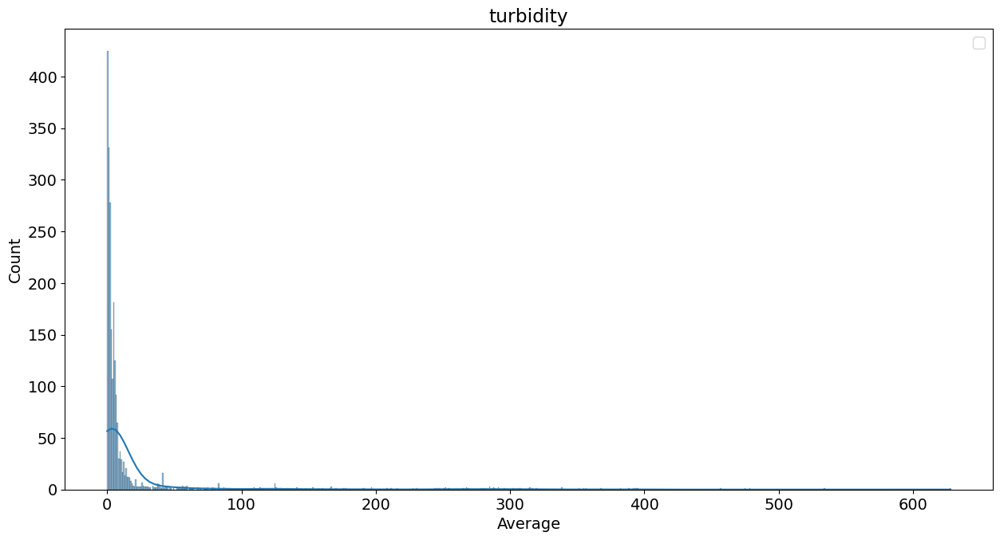

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


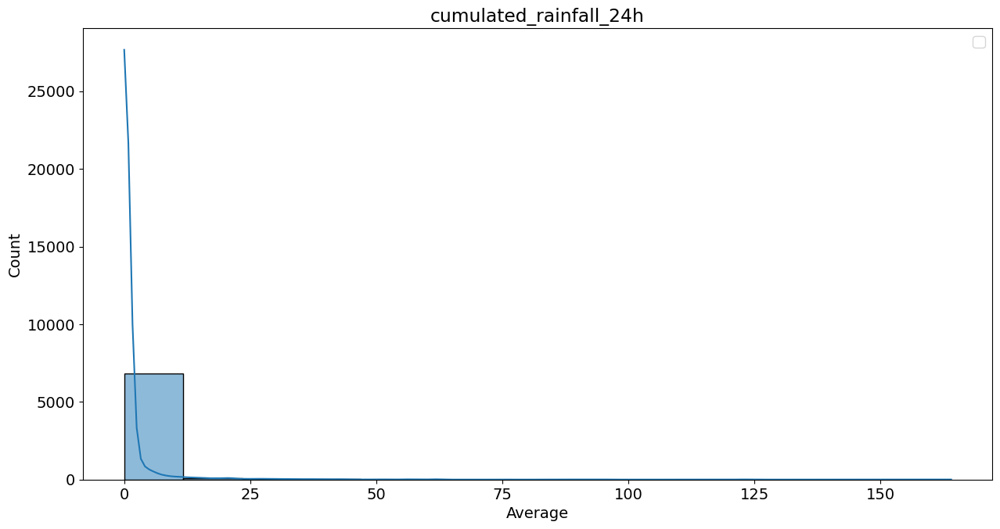

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


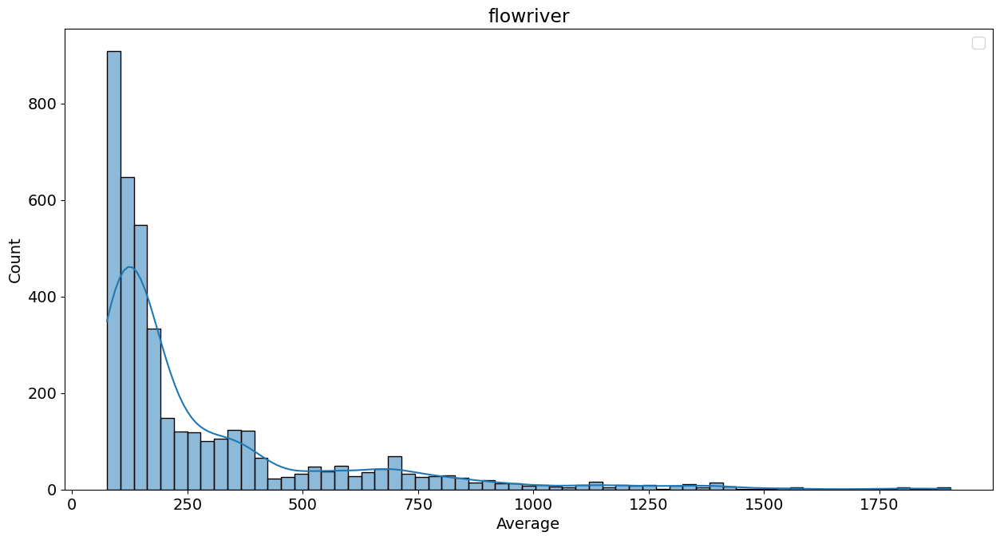

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


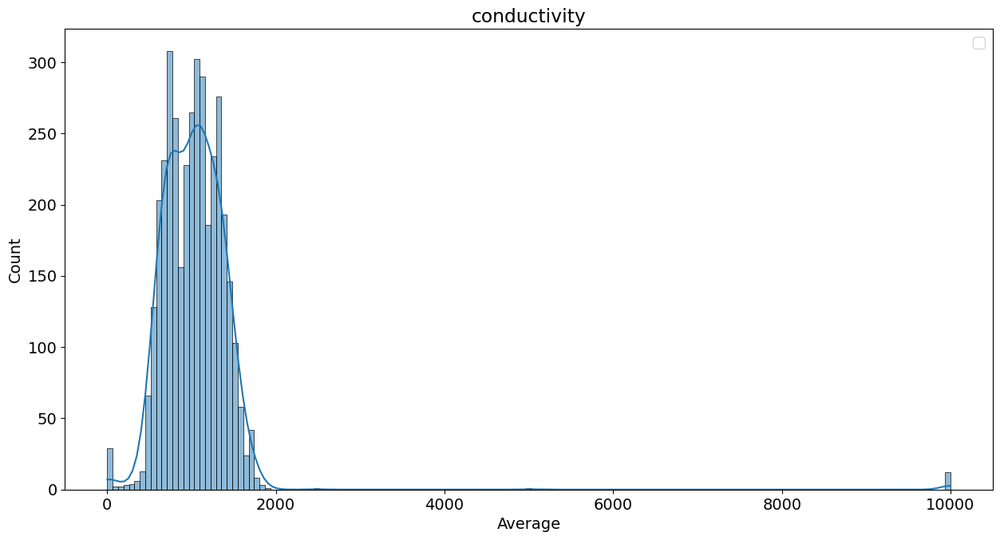

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


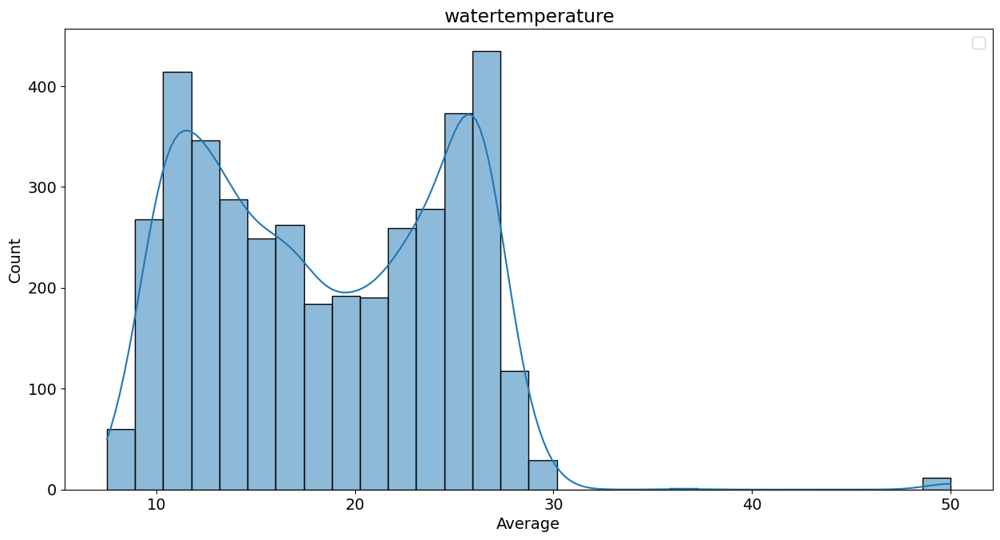

In [27]:
for feature, df in tortosa_dfs.items():
    plt.figure(figsize=(15, 7.5))
    sns.histplot(data=df["Average"], kde=True)
    # if 'Maximum' in df.columns:
    #     sns.lineplot(data=df, x='DateTime', y='Maximum', label='Maximum')
    # if 'Minimum' in df.columns:
    #     sns.lineplot(data=df, x='DateTime', y='Minimum', label='Minimum')
    plt.title(feature)
    plt.legend()
    plt.show()

#### Boxplots

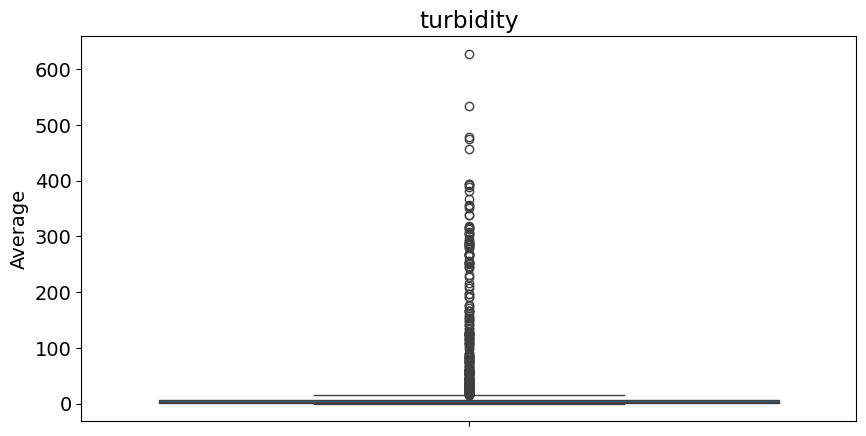

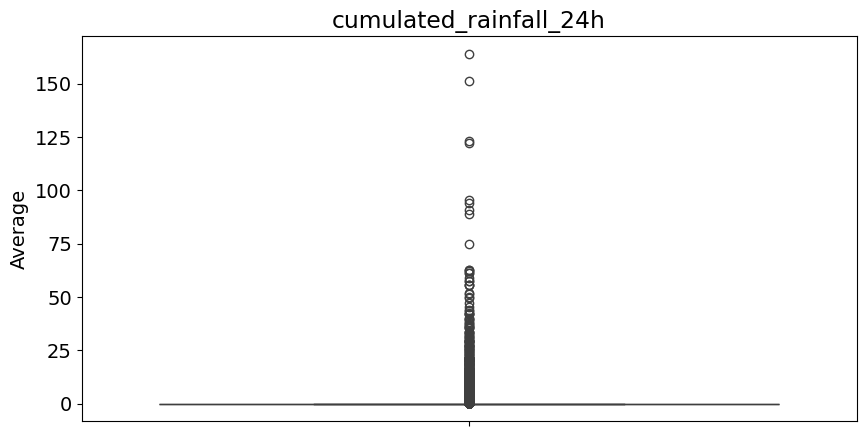

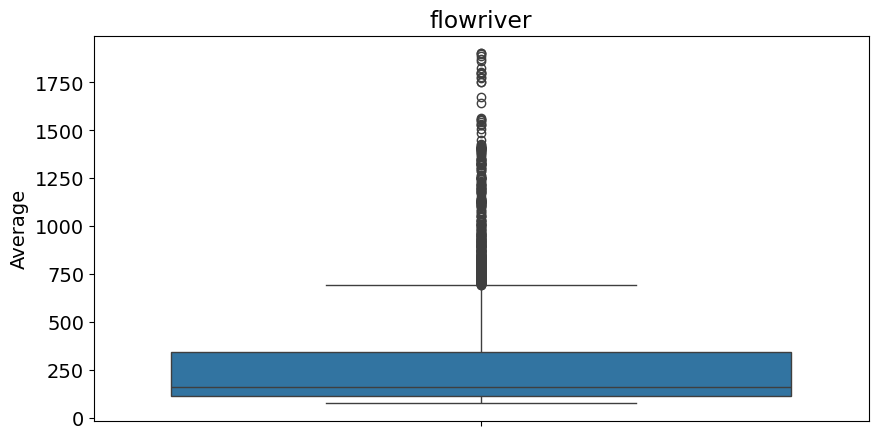

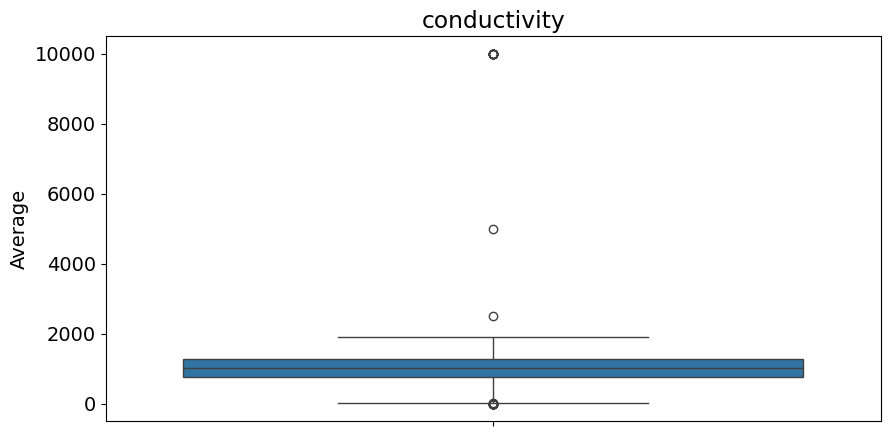

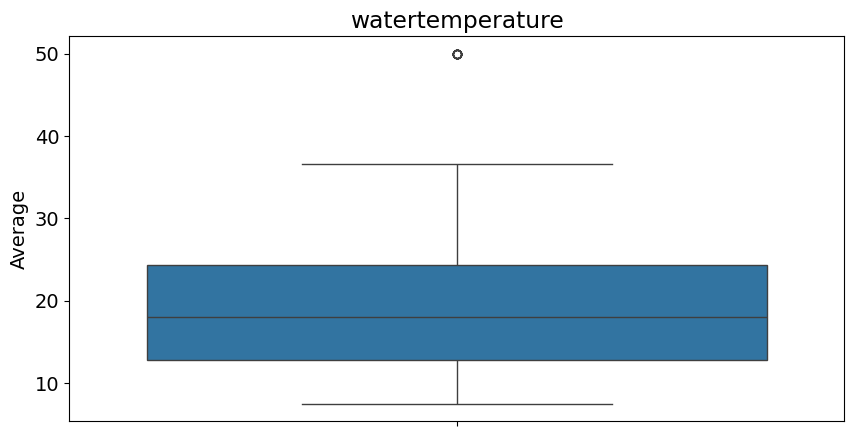

In [28]:
for feature, df in tortosa_dfs.items():
    plt.figure(figsize=(10, 5))
    sns.boxplot(data=df, y="Average")
    plt.title(feature)
    plt.show()

#### Timeseries

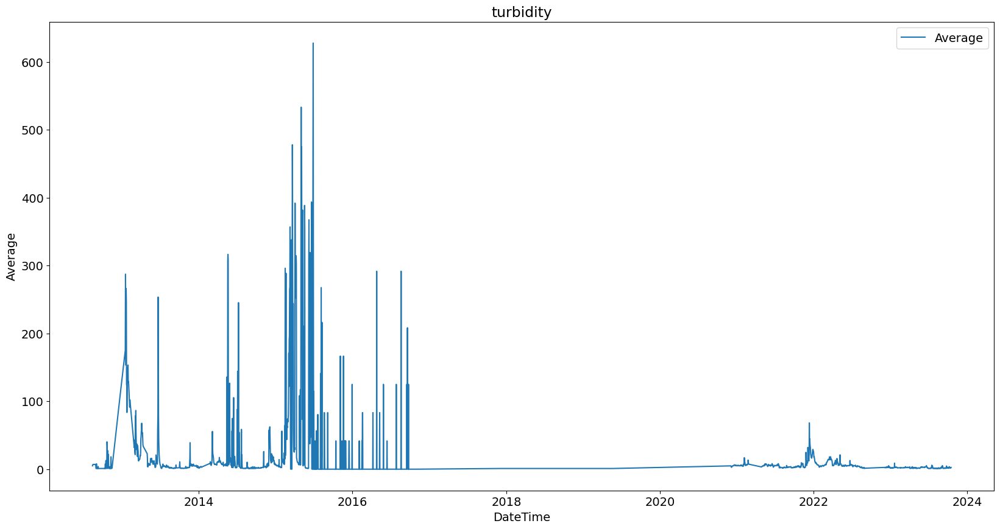

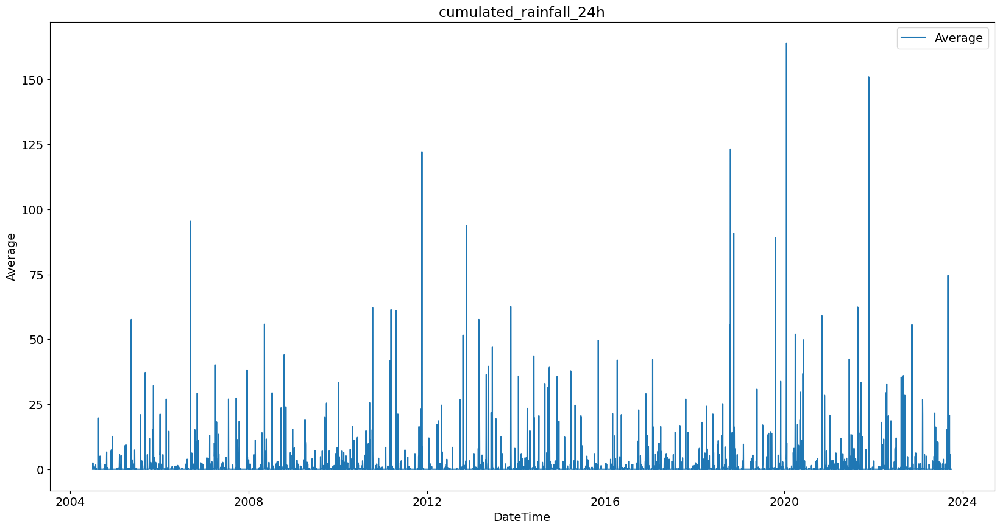

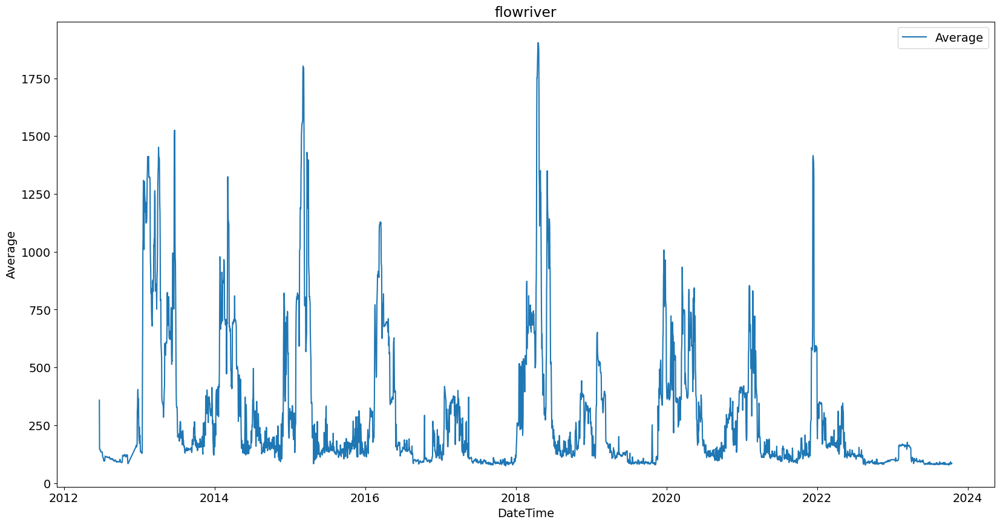

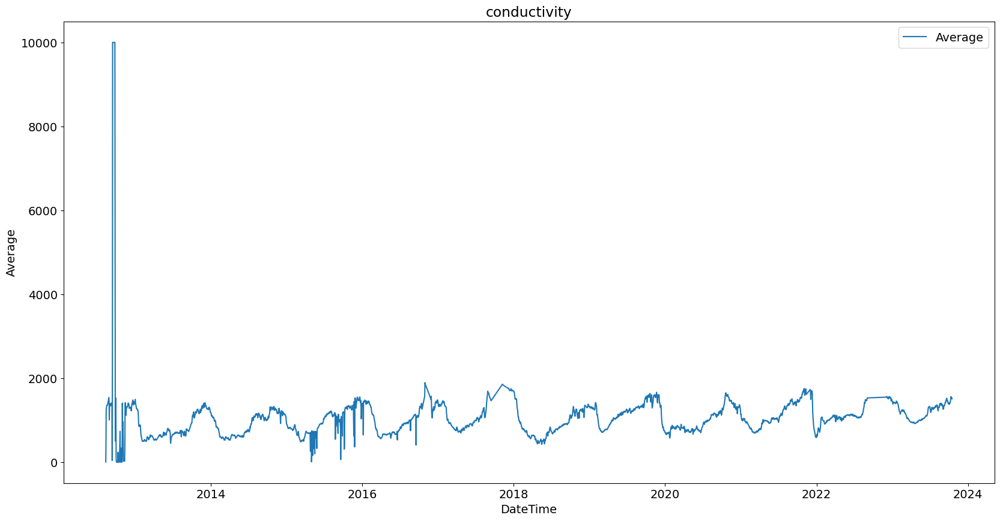

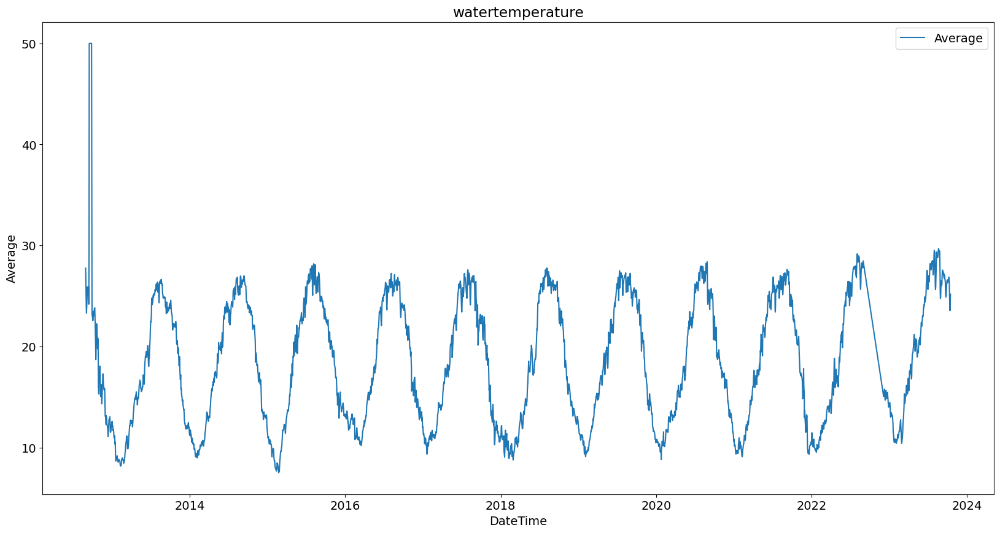

In [29]:
for feature, df in tortosa_dfs.items():
    plt.figure(figsize=(20, 10))
    sns.lineplot(data=df, x="DateTime", y="Average", label="Average")
    # if 'Maximum' in df.columns:
    #     sns.lineplot(data=df, x='DateTime', y='Maximum', label='Maximum')
    # if 'Minimum' in df.columns:
    #     sns.lineplot(data=df, x='DateTime', y='Minimum', label='Minimum')
    plt.title(feature)
    plt.legend()
    plt.show()

### Clean Data - Feature-wise

How I determined acceptable ranges of values for each feature

* Turbidity: [DataStream](https://datastream.org/en-ca/guidebook/turbidity#:~:text=Turbidity%20values%20less%20than%2010,be%20more%20than%20100%20NTU.) says that high levels of turbidity are > 100 NTU. [In-Situ](https://in-situ.com/us/faq/water-quality-information/what-are-typical-turbidity-values-in-natural-environments#:~:text=Turbidity%20values%20in%20natural%20environments%20can%20range%20from%20as%20low,a%20major%20storm%20runoff%20event.) says that levels of turbidity > 100 NTU are unsafe for most aquatic life. [Wikipedia](https://in-situ.com/us/faq/water-quality-information/what-are-typical-turbidity-values-in-natural-environments#:~:text=Turbidity%20values%20in%20natural%20environments%20can%20range%20from%20as%20low,a%20major%20storm%20runoff%20event.) says that the Ebro river has a wide ecosystem. Given these considerations, **I decided to consider valid the range of values between 0 and 150 NTU**.

* Daily Cumulated Rainfall: This [link](https://weather-and-climate.com/average-monthly-precipitation-Rainfall,tarragona-catalonia-es,Spain) says that the average monthly amount of precipitation ranges from 20 mm to 80 mm. On worst case scenario (80 mm in a month, which is october), considering that [here](https://weatherspark.com/y/45958/Average-Weather-in-Tarragona-Spain-Year-Round) it says that on average on october it rains ~ 6 days, we can assume that in a day it can rain up to ~ **13 mm. I decided to take this value as a threshold.**

* Flow River: [Wikipedia](https://en.wikipedia.org/wiki/Ebro#Flow_and_floods) confirms the domain of the plot, so no cleaning is required.

* Water Temperature: from the plot it is clear that at the beginning of the time series there is an unusual spike. Therefore, **only the values of that spike are removed.**

* Conductivity: same as water temperature.

#### Turbidity

In [30]:
turb_df = tortosa_dfs["turbidity"].copy()

In [31]:
threshold = 150

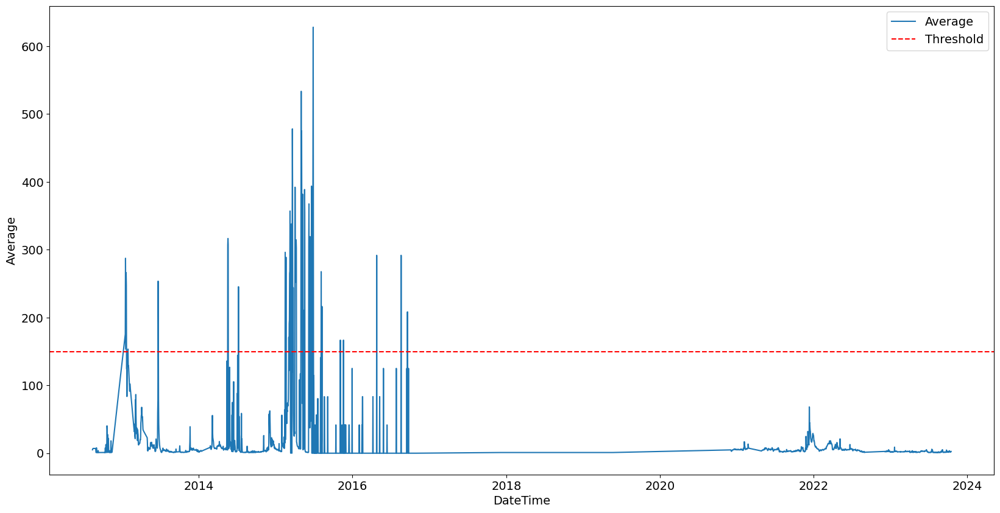

In [32]:
plt.figure(figsize=(20, 10))

sns.lineplot(data=turb_df, x="DateTime", y="Average", label="Average")
plt.axhline(y=threshold, color="r", linestyle="--", label="Threshold")
plt.legend()
plt.show()

In [33]:
turb_df = turb_df[turb_df["Average"] < threshold]

<Axes: xlabel='DateTime', ylabel='Average'>

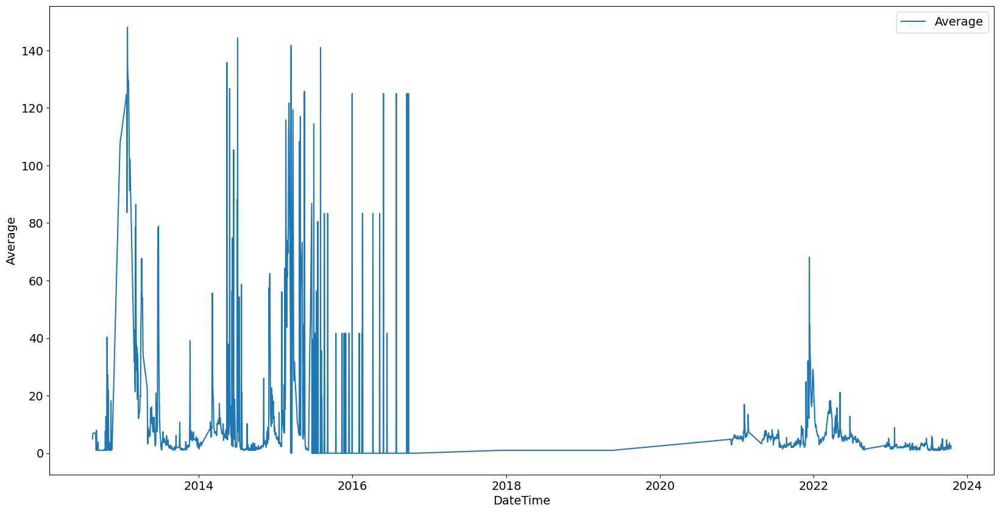

In [34]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=turb_df, x="DateTime", y="Average", label="Average")

In [35]:
tortosa_dfs["turbidity"] = turb_df

#### Daily Cumulated Rainfall

UPDATE: no removal of data since I found out that those values are in a valid range.

In [36]:
rain_df = tortosa_dfs["cumulated_rainfall_24h"].copy()

In [37]:
threshold = 13

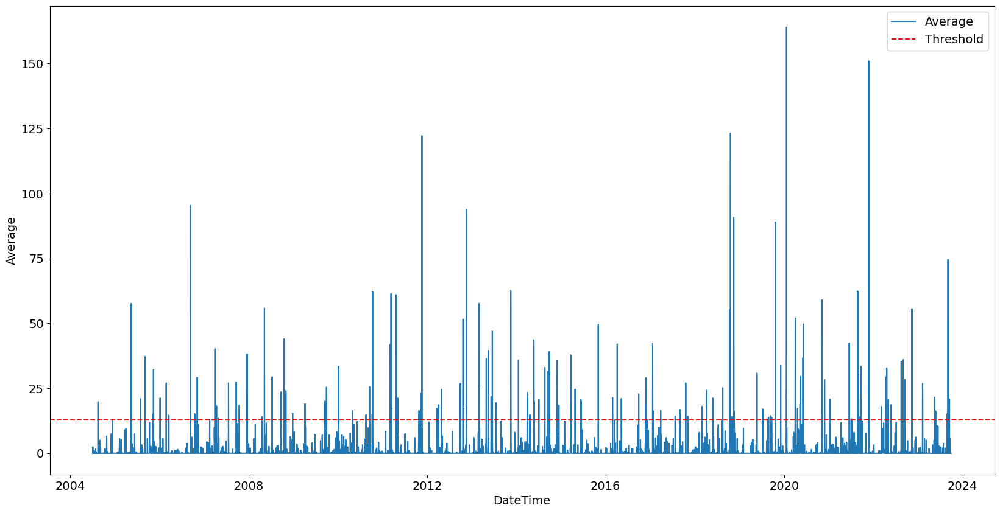

In [38]:
plt.figure(figsize=(20, 10))

sns.lineplot(data=rain_df, x="DateTime", y="Average", label="Average")
plt.axhline(y=threshold, color="r", linestyle="--", label="Threshold")
plt.legend()
plt.show()

In [39]:
rain_df = rain_df[rain_df["Average"] < threshold]

<Axes: xlabel='DateTime', ylabel='Average'>

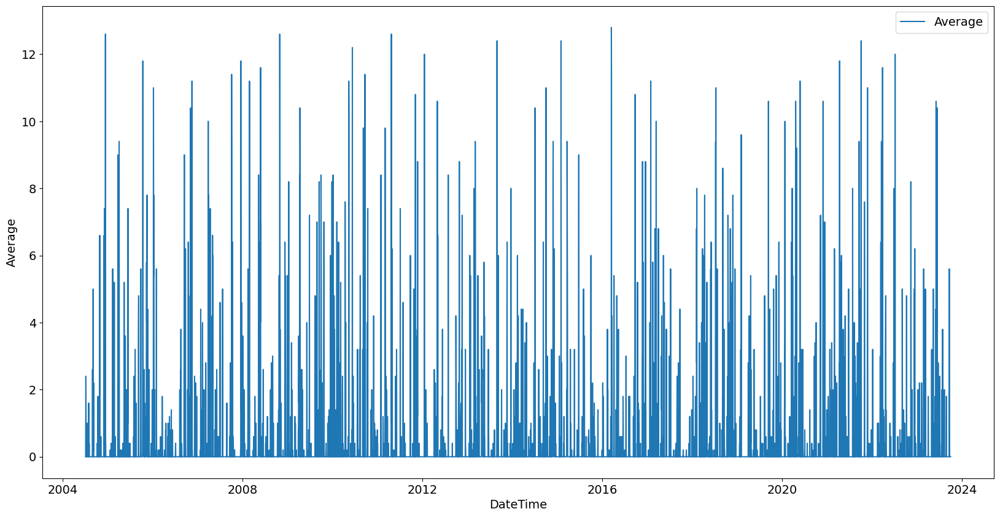

In [40]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=rain_df, x="DateTime", y="Average", label="Average")

In [41]:
tortosa_dfs["cumulated_rainfall_24h"] = rain_df

#### Water Temperature

In [42]:
water_df = tortosa_dfs["watertemperature"].copy()

In [43]:
threshold = 35

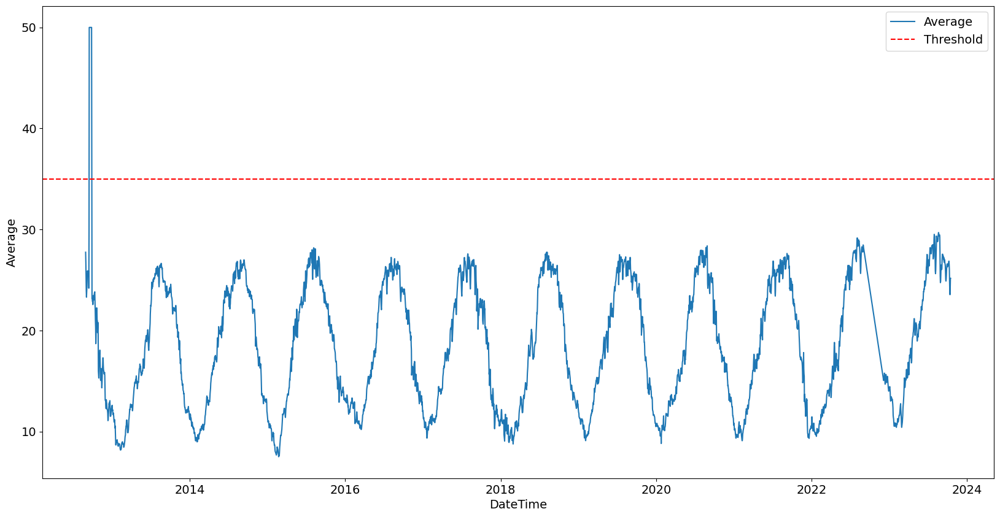

In [44]:
plt.figure(figsize=(20, 10))

sns.lineplot(data=water_df, x="DateTime", y="Average", label="Average")
plt.axhline(y=threshold, color="r", linestyle="--", label="Threshold")
plt.legend()
plt.show()

In [45]:
water_df = water_df[water_df["Average"] < threshold]

<Axes: xlabel='DateTime', ylabel='Average'>

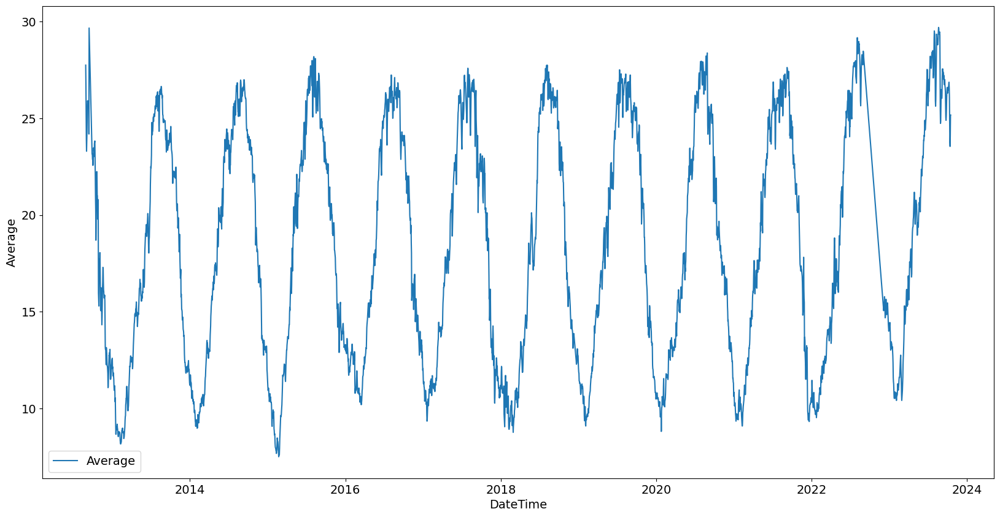

In [46]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=water_df, x="DateTime", y="Average", label="Average")

In [47]:
tortosa_dfs["watertemperature"] = water_df

#### Conductivity

In [48]:
cond_df = tortosa_dfs["conductivity"].copy()

In [49]:
upper_threshold = 2500

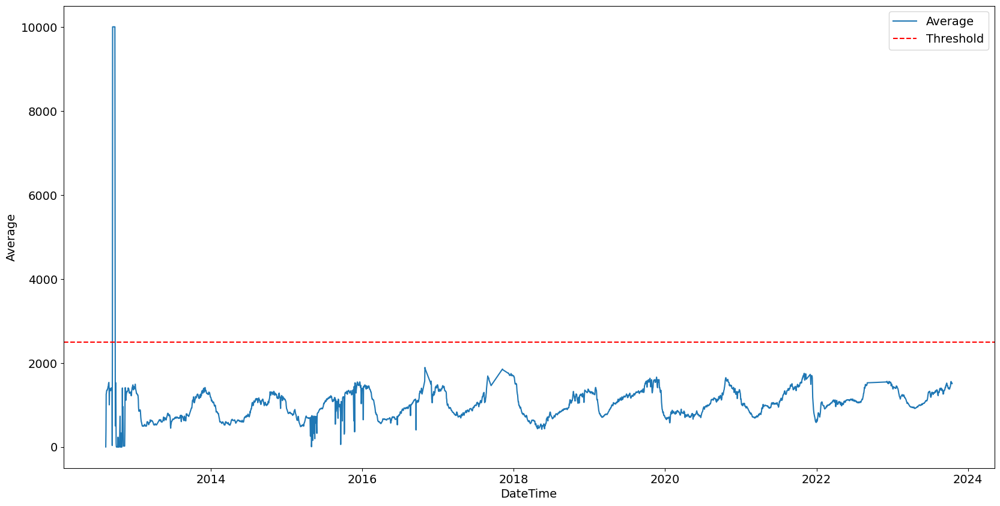

In [50]:
plt.figure(figsize=(20, 10))

sns.lineplot(data=cond_df, x="DateTime", y="Average", label="Average")
plt.axhline(
    y=upper_threshold, color="r", linestyle="--", label="Threshold"
)
plt.legend()
plt.show()

In [51]:
# cond_df = cond_df[cond_df["Average"] < upper_threshold]

<Axes: xlabel='DateTime', ylabel='Average'>

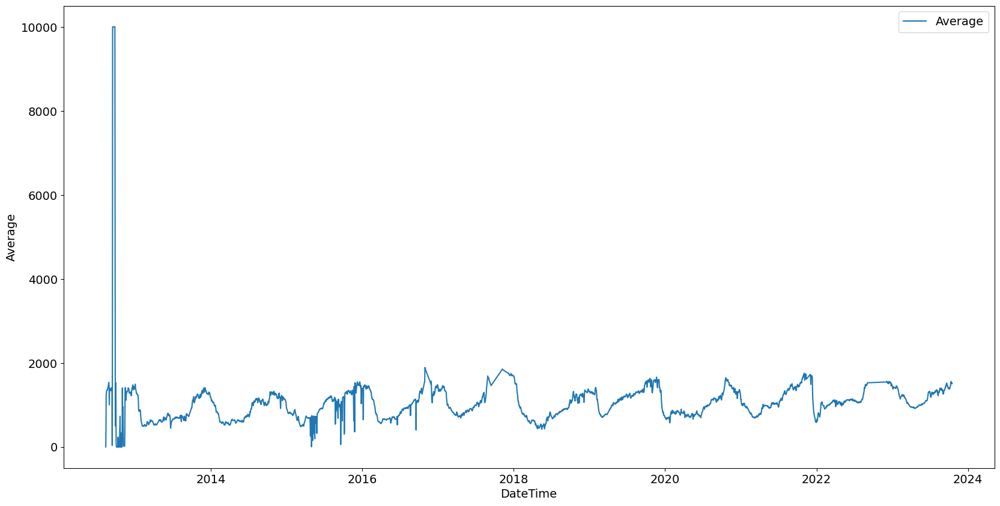

In [52]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=cond_df, x="DateTime", y="Average", label="Average")

In [53]:
lower_threshold = 250

In [54]:
cond_df = cond_df[cond_df["Average"] > lower_threshold]

<Axes: xlabel='DateTime', ylabel='Average'>

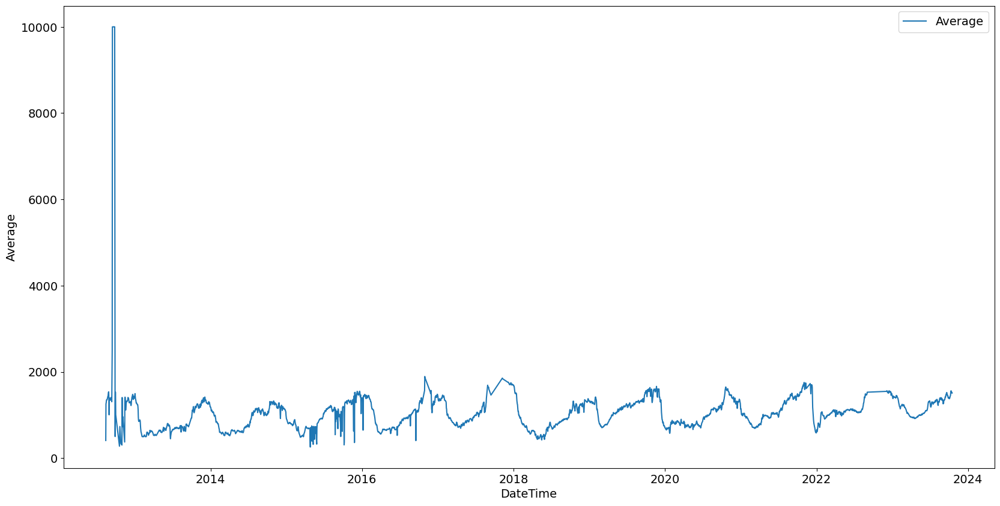

In [55]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=cond_df, x="DateTime", y="Average", label="Average")

In [56]:
tortosa_dfs["conductivity"] = cond_df

### Show uncovered days

In [57]:
for feature, df in tortosa_dfs.items():
    df = df.set_index("DateTime")

    all_dates = pd.date_range(
        start=df.index.min(), end=df.index.max(), freq="D"
    )
    df = df.reindex(all_dates, fill_value=None)

    df.reset_index(inplace=True)
    df.rename(columns={"index": "DateTime"}, inplace=True)
    tortosa_dfs[feature] = df

In [58]:
for feature, df in tortosa_dfs.items():
    print(feature)
    print()
    print(df.isna().sum())
    print()
    print("-" * 50)

turbidity

DateTime       0
Average     1905
Minimum     1905
Maximum     1905
Nºdat       1905
NºOK        1905
dtype: int64

--------------------------------------------------
cumulated_rainfall_24h

DateTime      0
Average     199
dtype: int64

--------------------------------------------------
flowriver

DateTime     0
Average     46
Minimum     46
Maximum     46
Nºdat       46
NºOK        46
dtype: int64

--------------------------------------------------
conductivity

DateTime      0
Average     331
Minimum     331
Maximum     331
Nºdat       331
NºOK        331
dtype: int64

--------------------------------------------------
watertemperature

DateTime      0
Average     121
Minimum     121
Maximum     121
Nºdat       121
NºOK        121
dtype: int64

--------------------------------------------------


turbidity
N samples: 4082
N suspicious: 0
cumulated_rainfall_24h
N samples: 7028
N suspicious: 0
flowriver
N samples: 4135
N suspicious: 0
conductivity
N samples: 4081
N suspicious: 14
watertemperature
N samples: 4066
N suspicious: 0


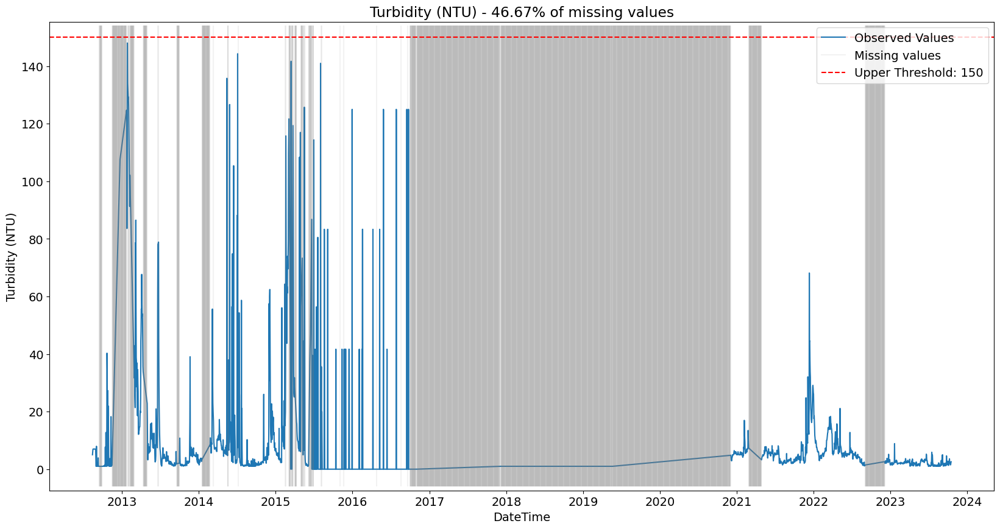

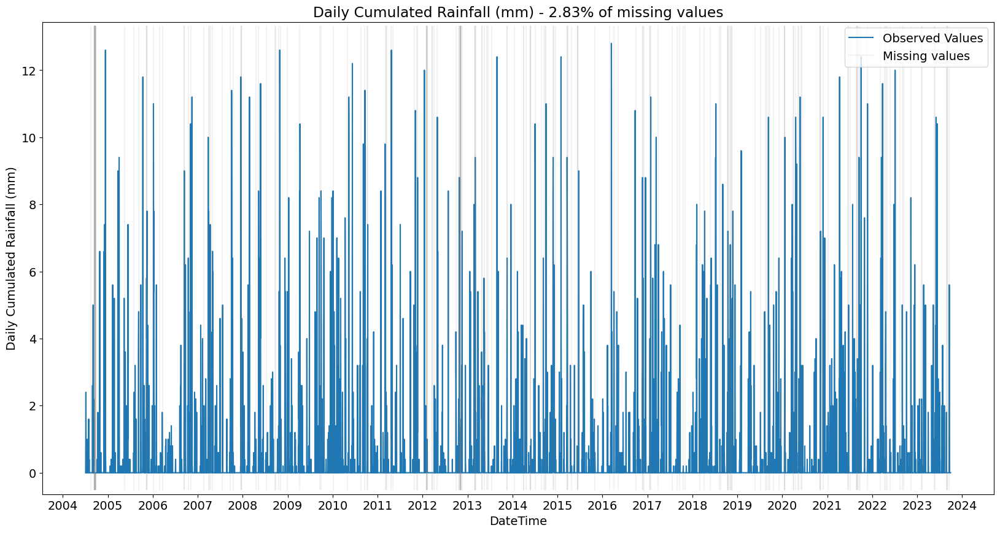

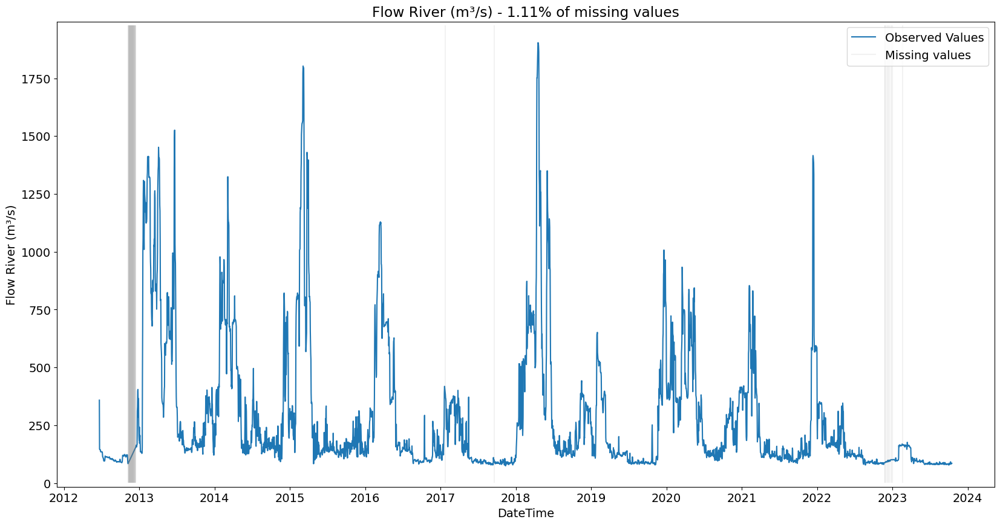

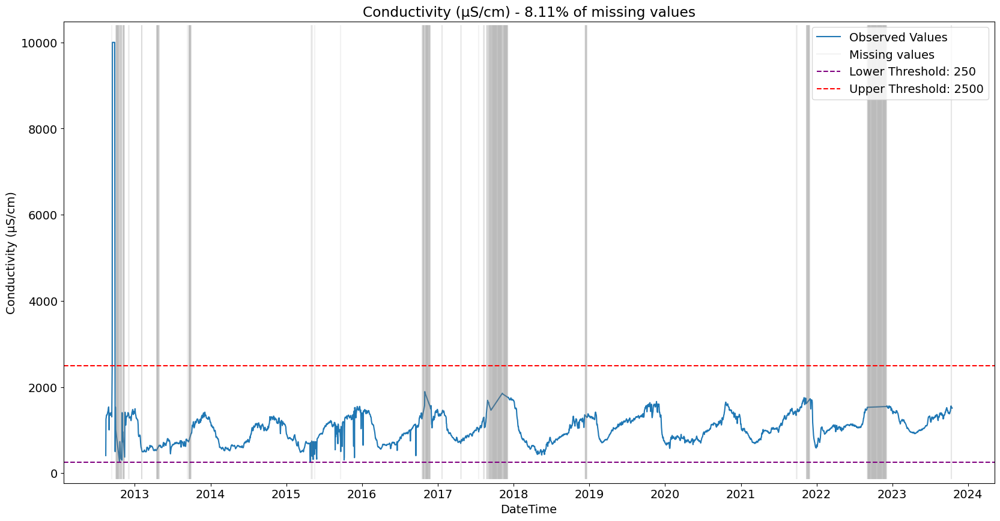

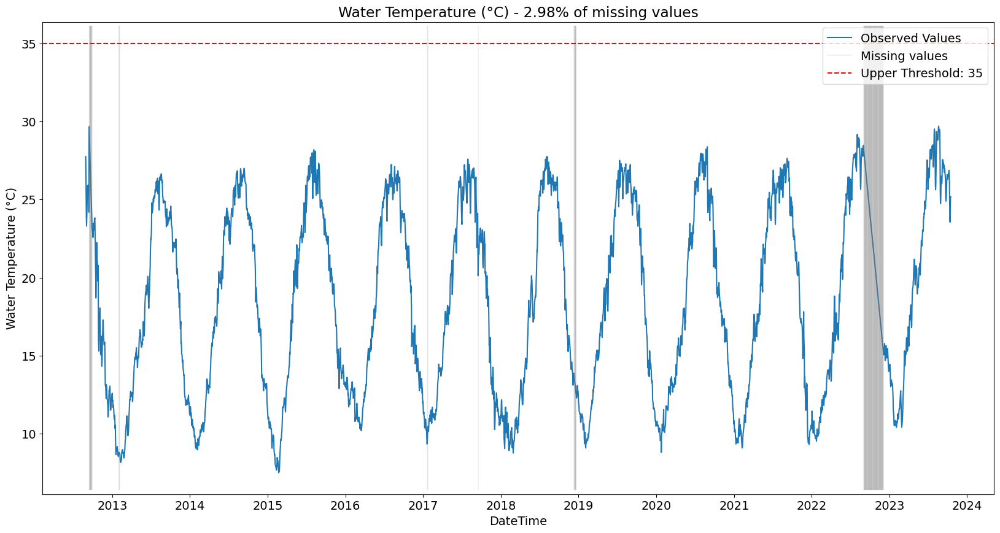

In [59]:
missing_values_df = {}

for feature, df in tortosa_dfs.items():
    df["is_missing"] = df["Average"].isna()

    lower_threshold = None
    upper_threshold = None

    label = ""
    if feature == "cumulated_rainfall_24h":
        label = "Daily Cumulated Rainfall (mm)"

    elif feature == "conductivity":
        label = "Conductivity (µS/cm)"
        upper_threshold = 2500
        lower_threshold = 250

    elif feature == "flowriver":
        label = "Flow River (m³/s)"

    elif feature == "turbidity":
        label = "Turbidity (NTU)"
        upper_threshold = 150

    elif feature == "watertemperature":
        label = "Water Temperature (°C)"
        upper_threshold = 35

    missing_values_perc = (df["is_missing"].sum() / df.shape[0]) * 100
    missing_values_perc = missing_values_perc.round(2)

    missing_values_df[feature] = missing_values_perc

    plt.figure(figsize=(20, 10))
    sns.lineplot(
        data=df, x="DateTime", y="Average", label="Observed Values"
    )

    # Get current axis
    ax = plt.gca()

    # Set major ticks format
    years = mdates.YearLocator()  # every year
    years_fmt = mdates.DateFormatter("%Y")
    ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(years_fmt)

    for date in df[df["is_missing"]]["DateTime"]:
        plt.axvline(
            x=date, ymin=0.01, ymax=0.99, color="grey", alpha=0.1
        )

    # Plot an empty line with a label for the legend
    plt.plot([], [], color="grey", alpha=0.1, label="Missing values")

    if lower_threshold:
        plt.axhline(
            y=lower_threshold,
            color="purple",
            linestyle="--",
            label=f"Lower Threshold: {lower_threshold}",
        )

    if upper_threshold:
        plt.axhline(
            y=upper_threshold,
            color="r",
            linestyle="--",
            label=f"Upper Threshold: {upper_threshold}",
        )

    plt.title(
        label + " - " + str(missing_values_perc) + "% of missing values"
    )

    plt.ylabel(label)

    plt.legend(loc="upper right")
    plt.savefig(
        os.path.join(
            deliverable_folder,
            "missing_values",
            "Tortosa",
            f"{feature}.png",
        )
    )
    # plt.show()

    print(feature)
    print("N samples:", df.shape[0])

    # compute the number of suspicious values
    n_sus = 0
    if lower_threshold:
        n_sus += df[df["Average"] < lower_threshold].shape[0]

    if upper_threshold:
        n_sus += df[df["Average"] > upper_threshold].shape[0]

    print("N suspicious:", n_sus)


missing_values_df = pd.DataFrame(
    missing_values_df.items(), columns=["Feature", "Missing values (%)"]
)

### Combine Datasets

In [60]:
# drop turbidity since it has a lot of missing values
# tortosa_dfs.pop("turbidity")

In [61]:
# Rename the Average column to the feature name for each dataframe
# and keep only the DateTime and the feature column
for feature, df in tortosa_dfs.items():
    df.rename(columns={"Average": feature}, inplace=True)
    df = df[["DateTime", feature, "is_missing"]]
    df.rename(
        columns={"is_missing": feature + "_is_missing"}, inplace=True
    )
    tortosa_dfs[feature] = df

/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_22833/2628198306.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(
/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_22833/2628198306.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(
/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_22833/2628198306.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(
/var/folders/z5/plf0_b

In [62]:
# combine all xerta datasets into a single dataframe

from functools import reduce

# Get a list of all dataframes
dfs = list(tortosa_dfs.values())

# Use reduce to merge all dataframes
tortosa_df = reduce(
    lambda left, right: pd.merge(left, right, on="DateTime"), dfs
)

### Fill NaNs

For non-seasonal data a linear interpolation is performed.
For seasonal data the interpolation is performed by first removing the season component and then perform a linear interpolation on the trend + residuals.

#### MICE month by month

In [63]:
%%script false --no-raise-error
# explicitly require this experimental feature
from sklearn.experimental import enable_iterative_imputer  # noqa

# now you can import normally from sklearn.impute
from sklearn.impute import IterativeImputer
from sklearn import linear_model

# Define MICE Imputer and fill missing values
mice_imputer = IterativeImputer(
    random_state=0,
    keep_empty_features=True,
    max_iter=30,
)

df_fill = tortosa_df.copy()
df_fill = df_fill[
    df_fill.columns[
        df_fill.columns.isin(list(tortosa_dfs.keys()) + ["DateTime"])
    ]
]

# fill missing values with MICE with imputation month by month
df_fill.sort_values(by="DateTime", inplace=True)
min_year = df_fill["DateTime"].iloc[0].year
max_year = df_fill["DateTime"].iloc[-1].year
df_fill_imputed = pd.DataFrame()
for year in range(min_year, max_year + 1):
    if year in df_fill["DateTime"].dt.year.unique():
        for month in range(1, 13):
            if (
                month
                in df_fill[df_fill["DateTime"].dt.year == year][
                    "DateTime"
                ].dt.month.unique()
            ):
                df_fill_data = df_fill[
                    (df_fill["DateTime"].dt.year == year)
                    & (df_fill["DateTime"].dt.month == month)
                ][df_fill.columns.difference(["DateTime"])].copy()

                # Save the indices of the rows with all missing values
                all_missing_indices = df_fill_data[
                    df_fill_data.isna().all(axis=1)
                ].index

                if not all_missing_indices.empty:
                    # Fill rows at only the indices contained all_missing_indices with ewma
                    df_fill_data.loc[all_missing_indices] = (
                        df_fill[
                            df_fill.columns.difference(["DateTime"])
                        ]
                        .loc[all_missing_indices]
                        .ewm(span=5)
                        .mean()
                    )

                imputed_data = pd.DataFrame(
                    mice_imputer.fit_transform(df_fill_data),
                    columns=df_fill_data.columns,
                )
                month_datetime = df_fill[
                    (df_fill["DateTime"].dt.year == year)
                    & (df_fill["DateTime"].dt.month == month)
                ]["DateTime"].copy()
                month_datetime.reset_index(drop=True, inplace=True)
                imputed_data["DateTime"] = month_datetime

                df_fill_imputed = pd.concat(
                    [df_fill_imputed, imputed_data], axis=0
                )
df_fill = df_fill_imputed

#### EWMA Imputer

In [64]:
%%script false --no-raise-error
df_fill = tortosa_df.copy()
df_fill = df_fill[
    df_fill.columns[
        df_fill.columns.isin(list(tortosa_dfs.keys()) + ["DateTime"])
    ]
]

# EWMA Imputer
for feature in tortosa_dfs.keys():
    df_fill[feature] = df_fill[feature].fillna(
        pd.Series.ewm(
            df_fill[feature],
            times=df_fill["DateTime"],
            halflife=pd.Timedelta(days=7),
        ).mean()
    )

#### Interpolation

In [65]:
# fill missing values with interpolation
df_fill = tortosa_df.copy()
df_fill.set_index("DateTime", inplace=True)

In [66]:
df_fill = df_fill.interpolate(method="time", limit_direction="both")
df_fill.reset_index(inplace=True)

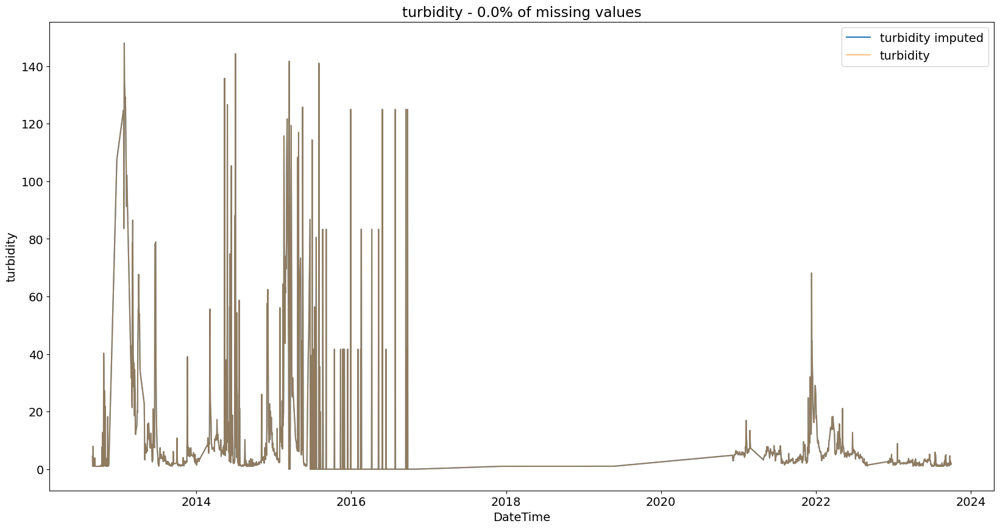

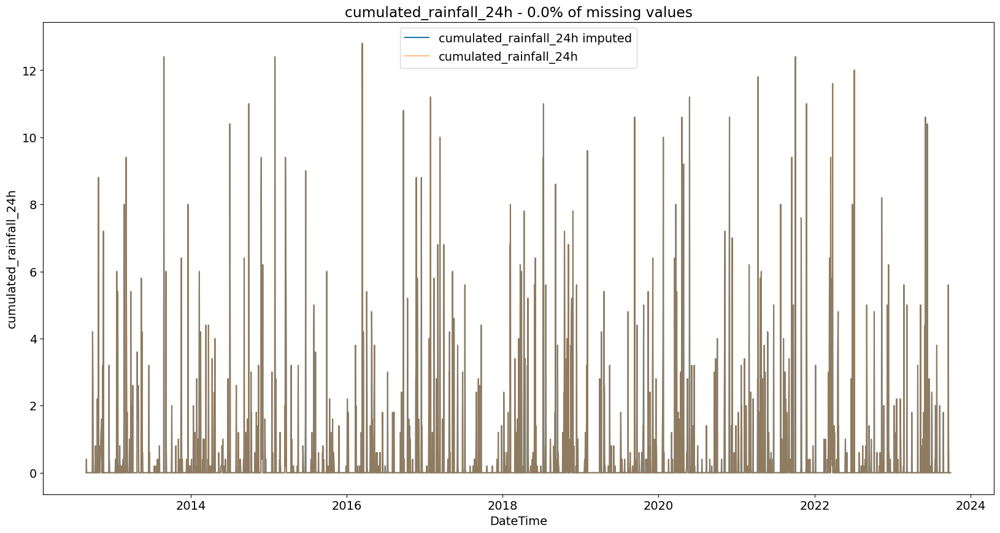

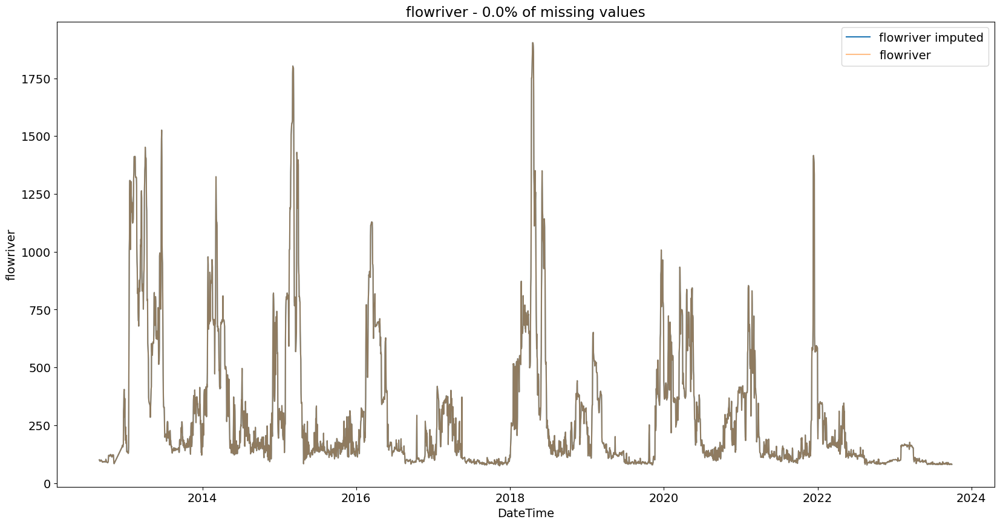

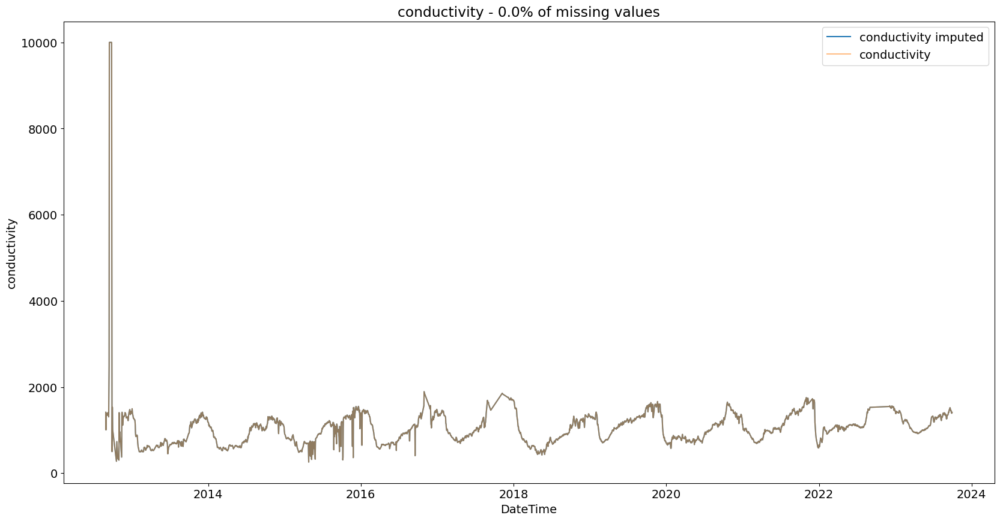

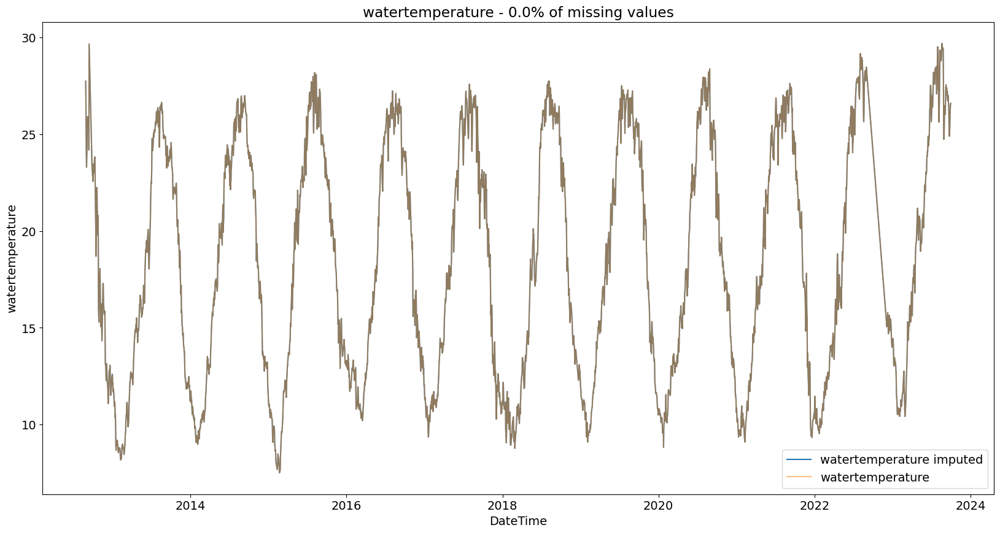

In [67]:
# plot the data for each feature
for feature in tortosa_dfs.keys():
    df_fill[feature + "_is_missing"] = df_fill[feature].isna()

    plt.figure(figsize=(20, 10))
    sns.lineplot(
        data=df_fill,
        x="DateTime",
        y=feature,
        label=feature + " imputed",
    )
    sns.lineplot(
        data=tortosa_df,
        x="DateTime",
        y=feature,
        label=feature,
        alpha=0.5,
    )

    missing_values_perc = (
        df_fill[feature + "_is_missing"].sum() / df_fill.shape[0]
    ) * 100
    missing_values_perc = missing_values_perc.round(2)

    plt.title(
        feature
        + " - "
        + str(missing_values_perc)
        + "% of missing values"
    )
    plt.legend()
    plt.show()

In [68]:
tortosa_df = df_fill

# Guiamets Preprocessing

In [69]:
guiamets_dfs.keys()

dict_keys(['cumulated_rainfall_24h', 'environmental_temperature'])

In [70]:
# Percentage of missing values
guiamets_dfs["cumulated_rainfall_24h"].isna().sum() / guiamets_dfs[
    "cumulated_rainfall_24h"
].shape[0]

Acumulado          0.000184
Fecha acumulado    0.000184
M�ximo             1.000000
Fecha m�ximo       1.000000
fecha              0.000000
dtype: float64

In [71]:
guiamets_dfs["environmental_temperature"].isna().sum() / guiamets_dfs[
    "environmental_temperature"
].shape[0]

M�ximo          0.013823
M�nimo          0.013823
Media           0.014005
Fecha m�ximo    0.013823
Fecha m�nimo    0.013823
fecha           0.000000
dtype: float64

In [72]:
guiamets_dfs["cumulated_rainfall_24h"].columns.to_list()

['Acumulado', 'Fecha acumulado', 'M�ximo', 'Fecha m�ximo', 'fecha']

In [73]:
guiamets_dfs["cumulated_rainfall_24h"].drop(
    columns=["Fecha m�ximo", "M�ximo", "Fecha acumulado"], inplace=True
)
guiamets_dfs["environmental_temperature"].drop(
    columns=["Fecha m�ximo", "Fecha m�nimo"], inplace=True
)

In [74]:
guiamets_dfs["cumulated_rainfall_24h"].rename(
    columns={"fecha": "DateTime", "Acumulado": "Average"}, inplace=True
)

guiamets_dfs["environmental_temperature"].rename(
    columns={
        "fecha": "DateTime",
        "Media": "Average",
        "M�nimo": "Minimum",
        "M�ximo": "Maximum",
    },
    inplace=True,
)

In [75]:
for df in guiamets_dfs.values():
    df["DateTime"] = pd.to_datetime(df["DateTime"])
    df[df.columns.difference(["DateTime"])] = df[
        df.columns.difference(["DateTime"])
    ].apply(pd.to_numeric, errors="coerce")

In [76]:
# Check for missing values in the datasets
for feature, df in guiamets_dfs.items():
    print(f"{feature}: {df.isna().sum().sum()}")

cumulated_rainfall_24h: 1
environmental_temperature: 229


In [77]:
# For the moment, drop the missing values
for feature, df in guiamets_dfs.items():
    guiamets_dfs[feature] = df.dropna()

## Outliers Detection and Missing Values

### Inspect Data

#### Histograms

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


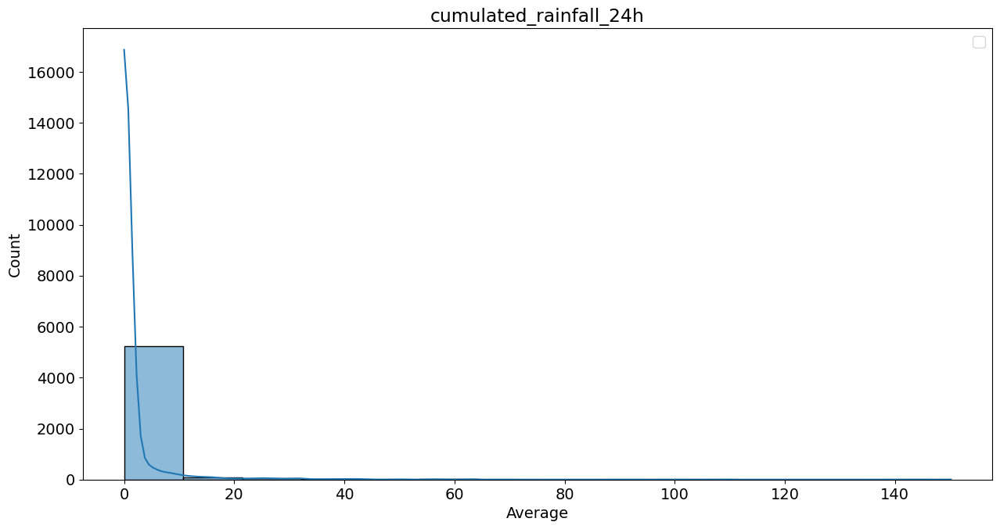

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


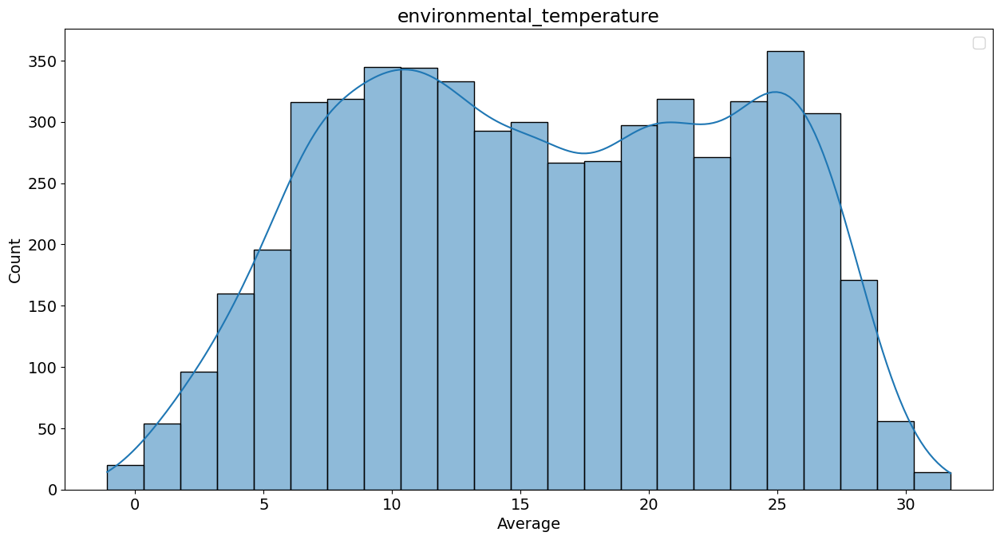

In [78]:
for feature, df in guiamets_dfs.items():
    plt.figure(figsize=(15, 7.5))
    sns.histplot(data=df["Average"], kde=True)
    # if 'Maximum' in df.columns:
    #     sns.lineplot(data=df, x='DateTime', y='Maximum', label='Maximum')
    # if 'Minimum' in df.columns:
    #     sns.lineplot(data=df, x='DateTime', y='Minimum', label='Minimum')
    plt.title(feature)
    plt.legend()
    plt.show()

#### Boxplots

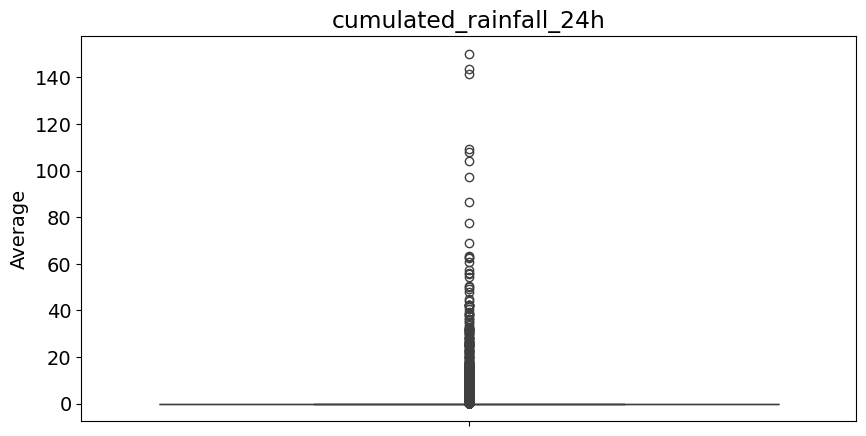

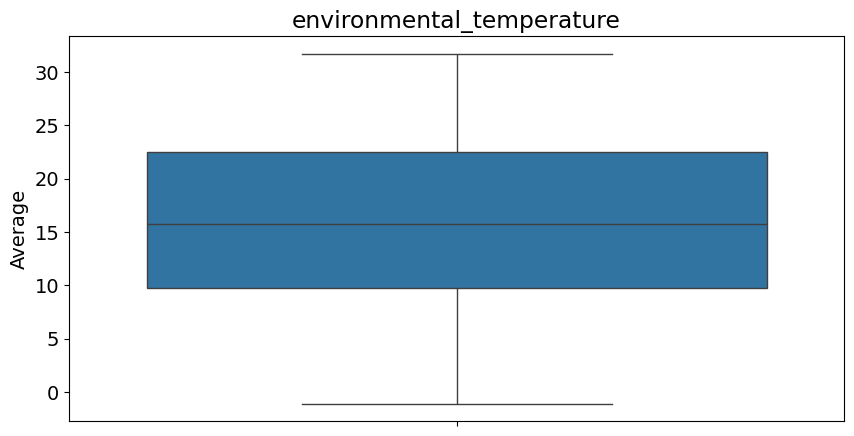

In [79]:
for feature, df in guiamets_dfs.items():
    plt.figure(figsize=(10, 5))
    sns.boxplot(data=df, y="Average")
    plt.title(feature)
    plt.show()

#### Timeseries

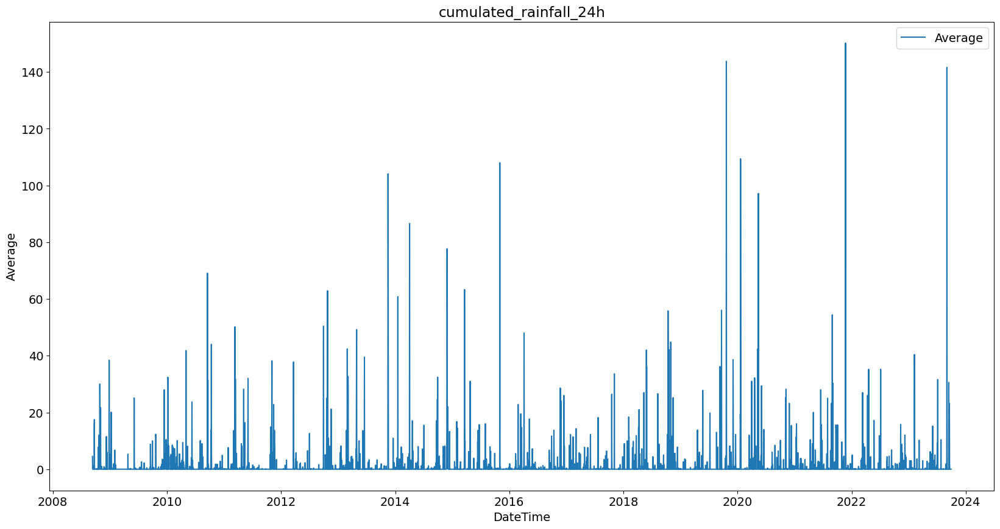

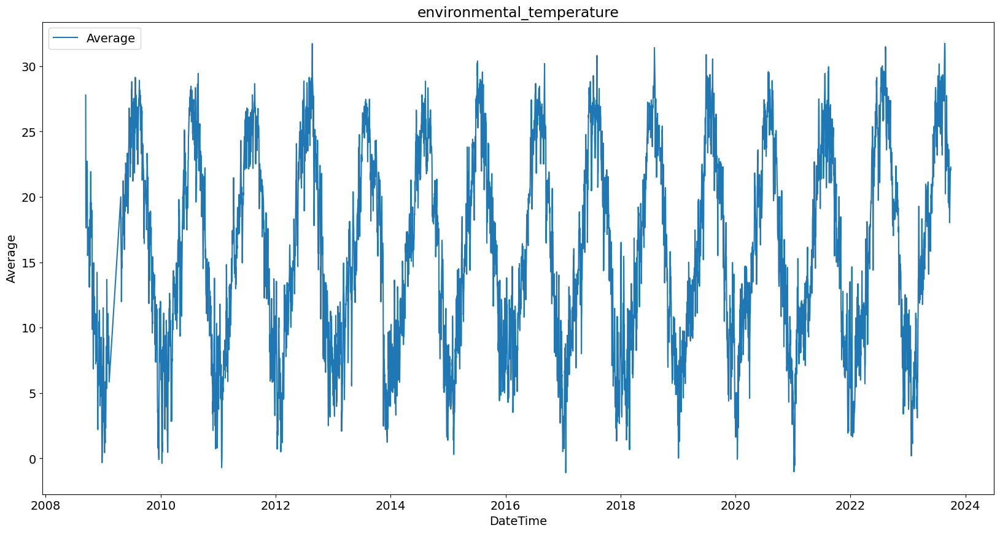

In [80]:
for feature, df in guiamets_dfs.items():
    plt.figure(figsize=(20, 10))
    sns.lineplot(data=df, x="DateTime", y="Average", label="Average")
    # if 'Maximum' in df.columns:
    #     sns.lineplot(data=df, x='DateTime', y='Maximum', label='Maximum')
    # if 'Minimum' in df.columns:
    #     sns.lineplot(data=df, x='DateTime', y='Minimum', label='Minimum')
    plt.title(feature)
    plt.legend()
    plt.show()

### Clean Data - Feature-wise

How I determined acceptable ranges of values for each feature

* Daily Cumulated Rainfall: This [link](https://weather-and-climate.com/average-monthly-precipitation-Rainfall,tarragona-catalonia-es,Spain) says that the average monthly amount of precipitation ranges from 20 mm to 80 mm. On worst case scenario (80 mm in a month, which is october), considering that [here](https://weatherspark.com/y/45958/Average-Weather-in-Tarragona-Spain-Year-Round) it says that on average on october it rains ~ 6 days, we can assume that in a day it can rain up to ~ **13 mm. I decided to take this value as a threshold.**

* Air Temperature: the range of values is valid. Therefore, **no removal is necessary.**

#### Daily Cumulated Rainfall

UPDATE: no removal of data since I found out that those values are in a valid range.

In [81]:
rain_df = guiamets_dfs["cumulated_rainfall_24h"].copy()

In [82]:
threshold = 13

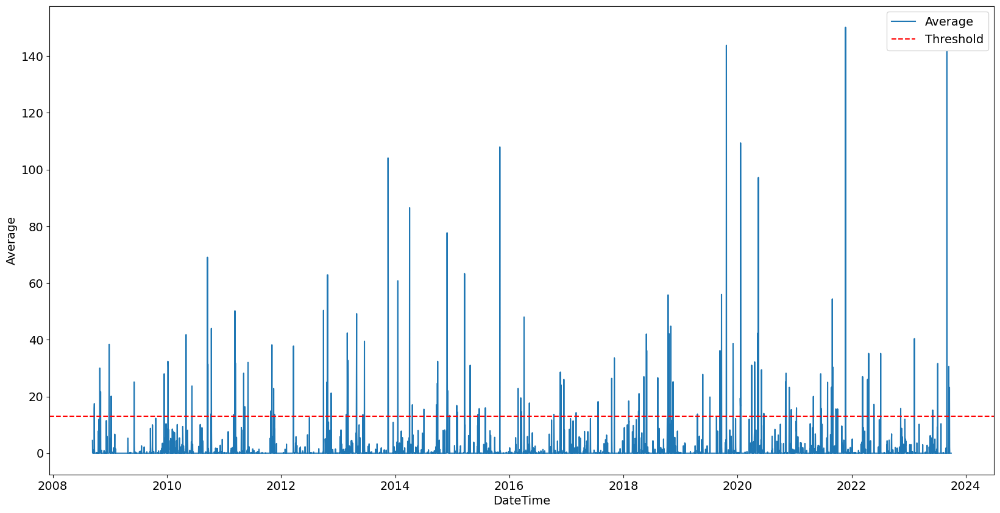

In [83]:
plt.figure(figsize=(20, 10))

sns.lineplot(data=rain_df, x="DateTime", y="Average", label="Average")
plt.axhline(y=threshold, color="r", linestyle="--", label="Threshold")
plt.legend()
plt.show()

In [84]:
rain_df = rain_df[rain_df["Average"] < threshold]

<Axes: xlabel='DateTime', ylabel='Average'>

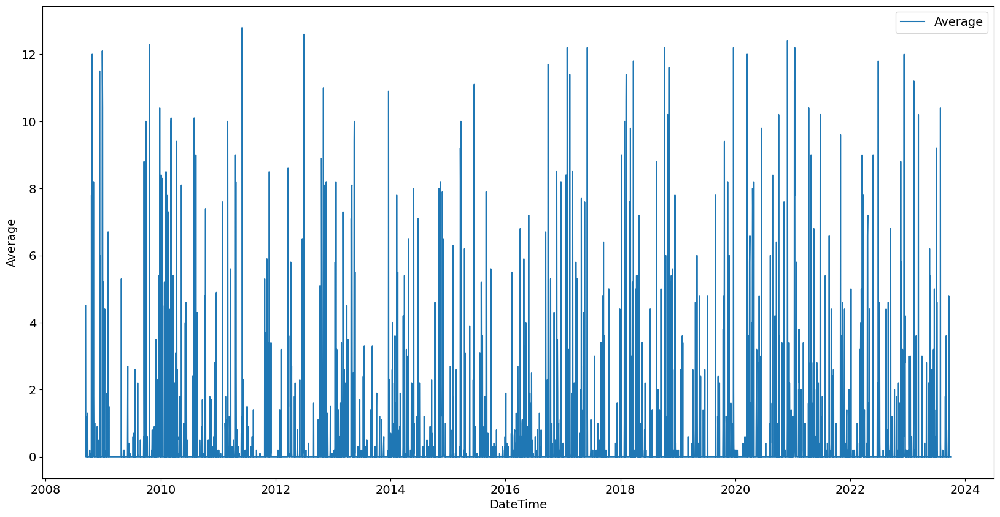

In [85]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=rain_df, x="DateTime", y="Average", label="Average")

In [86]:
guiamets_dfs["cumulated_rainfall_24h"] = rain_df

### Show uncovered days

In [87]:
for feature, df in guiamets_dfs.items():
    df = df.set_index("DateTime")

    all_dates = pd.date_range(
        start=df.index.min(), end=df.index.max(), freq="D"
    )
    df = df.reindex(all_dates, fill_value=None)

    df.reset_index(inplace=True)
    df.rename(columns={"index": "DateTime"}, inplace=True)
    guiamets_dfs[feature] = df

In [88]:
for feature, df in guiamets_dfs.items():
    print(feature)
    print()
    print(df.isna().sum())
    print()
    print("-" * 50)

cumulated_rainfall_24h

DateTime      0
Average     223
dtype: int64

--------------------------------------------------
environmental_temperature

DateTime     0
Maximum     77
Minimum     77
Average     77
dtype: int64

--------------------------------------------------


cumulated_rainfall_24h
N samples: 5498
N suspicious: 0
environmental_temperature
N samples: 5498
N suspicious: 0


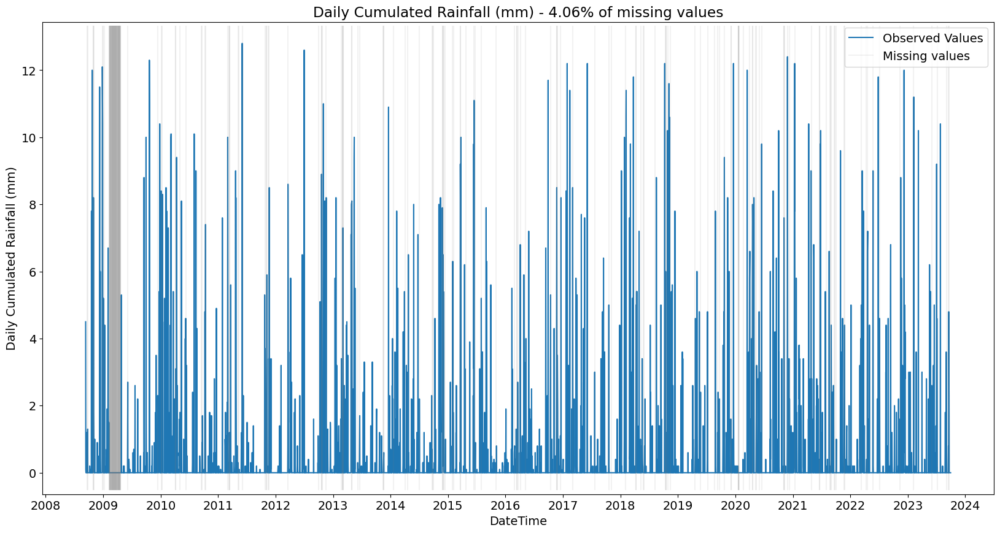

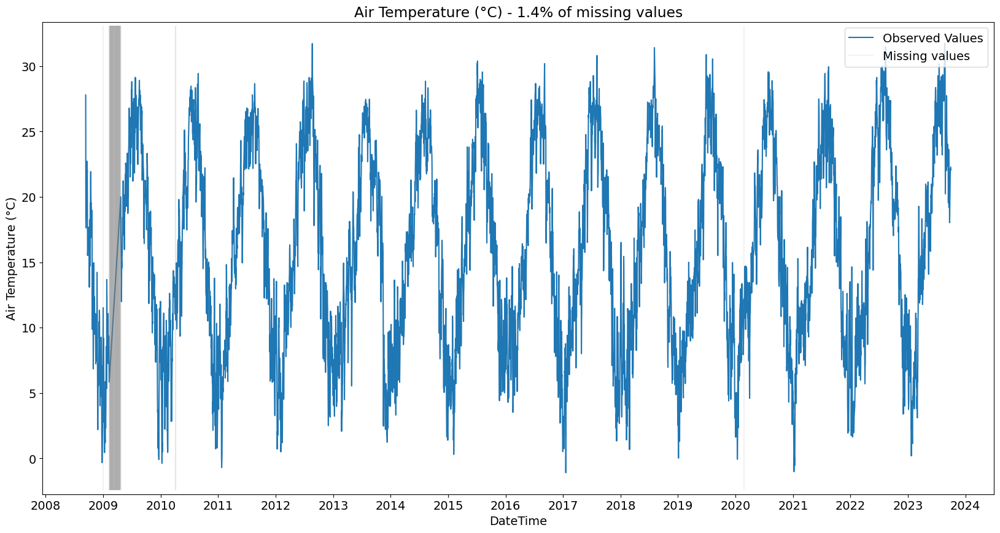

In [89]:
missing_values_df = {}

for feature, df in guiamets_dfs.items():
    df["is_missing"] = df["Average"].isna()

    label = ""
    if feature == "cumulated_rainfall_24h":
        label = "Daily Cumulated Rainfall (mm)"

    elif feature == "environmental_temperature":
        label = "Air Temperature (°C)"

    missing_values_perc = (df["is_missing"].sum() / df.shape[0]) * 100
    missing_values_perc = missing_values_perc.round(2)

    missing_values_df[feature] = missing_values_perc

    plt.figure(figsize=(20, 10))
    sns.lineplot(
        data=df, x="DateTime", y="Average", label="Observed Values"
    )

    # Get current axis
    ax = plt.gca()

    # Set major ticks format
    years = mdates.YearLocator()  # every year
    years_fmt = mdates.DateFormatter("%Y")
    ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(years_fmt)

    for date in df[df["is_missing"]]["DateTime"]:
        plt.axvline(
            x=date, ymin=0.01, ymax=0.99, color="grey", alpha=0.1
        )

    # Plot an empty line with a label for the legend
    plt.plot([], [], color="grey", alpha=0.1, label="Missing values")

    plt.title(
        label + " - " + str(missing_values_perc) + "% of missing values"
    )

    plt.ylabel(label)

    plt.legend(loc="upper right")
    plt.savefig(
        os.path.join(
            deliverable_folder,
            "missing_values",
            "Guiamets",
            f"{feature}.png",
        )
    )

    print(feature)
    print("N samples:", df.shape[0])

    # compute the number of suspicious values
    n_sus = 0
    if lower_threshold:
        n_sus += df[df["Average"] < lower_threshold].shape[0]

    if upper_threshold:
        n_sus += df[df["Average"] > upper_threshold].shape[0]

    print("N suspicious:", n_sus)

missing_values_df = pd.DataFrame(
    missing_values_df.items(), columns=["Feature", "Missing values (%)"]
)

### Combine Datasets

In [90]:
# Rename the Average column to the feature name for each dataframe
# and keep only the DateTime and the feature column
for feature, df in guiamets_dfs.items():
    df.rename(columns={"Average": feature}, inplace=True)
    df = df[["DateTime", feature, "is_missing"]]
    df.rename(
        columns={"is_missing": feature + "_is_missing"}, inplace=True
    )
    guiamets_dfs[feature] = df

/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_22833/2569150774.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(


In [91]:
# combine all xerta datasets into a single dataframe

from functools import reduce

# Get a list of all dataframes
dfs = list(guiamets_dfs.values())

# Use reduce to merge all dataframes
guiamets_df = reduce(
    lambda left, right: pd.merge(left, right, on="DateTime"), dfs
)

### Fill NaNs

#### MICE month by month

In [92]:
%%script false --no-raise-error
# explicitly require this experimental feature
from sklearn.experimental import enable_iterative_imputer  # noqa

# now you can import normally from sklearn.impute
from sklearn.impute import IterativeImputer
from sklearn import linear_model

# Define MICE Imputer and fill missing values
mice_imputer = IterativeImputer(
    random_state=0,
    keep_empty_features=True,
    max_iter=30,
)

df_fill = guiamets_df.copy()
df_fill = df_fill[
    df_fill.columns[
        df_fill.columns.isin(list(guiamets_dfs.keys()) + ["DateTime"])
    ]
]

# fill missing values with MICE with imputation month by month
df_fill.sort_values(by="DateTime", inplace=True)
min_year = df_fill["DateTime"].iloc[0].year
max_year = df_fill["DateTime"].iloc[-1].year
df_fill_imputed = pd.DataFrame()
for year in range(min_year, max_year + 1):
    if year in df_fill["DateTime"].dt.year.unique():
        for month in range(1, 13):
            if (
                month
                in df_fill[df_fill["DateTime"].dt.year == year][
                    "DateTime"
                ].dt.month.unique()
            ):
                df_fill_data = df_fill[
                    (df_fill["DateTime"].dt.year == year)
                    & (df_fill["DateTime"].dt.month == month)
                ][df_fill.columns.difference(["DateTime"])].copy()

                # Save the indices of the rows with all missing values
                all_missing_indices = df_fill_data[
                    df_fill_data.isna().all(axis=1)
                ].index

                if not all_missing_indices.empty:
                    # Fill rows at only the indices contained all_missing_indices with ewma
                    df_fill_data.loc[all_missing_indices] = (
                        df_fill[
                            df_fill.columns.difference(["DateTime"])
                        ]
                        .loc[all_missing_indices]
                        .ewm(span=5)
                        .mean()
                    )

                imputed_data = pd.DataFrame(
                    mice_imputer.fit_transform(df_fill_data),
                    columns=df_fill_data.columns,
                )
                month_datetime = df_fill[
                    (df_fill["DateTime"].dt.year == year)
                    & (df_fill["DateTime"].dt.month == month)
                ]["DateTime"].copy()
                month_datetime.reset_index(drop=True, inplace=True)
                imputed_data["DateTime"] = month_datetime

                df_fill_imputed = pd.concat(
                    [df_fill_imputed, imputed_data], axis=0
                )
df_fill = df_fill_imputed

#### EWMA Imputer

In [93]:
%%script false --no-raise-error
df_fill = guiamets_df.copy()
df_fill = df_fill[
    df_fill.columns[
        df_fill.columns.isin(list(guiamets_dfs.keys()) + ["DateTime"])
    ]
]

# EWMA Imputer
for feature in guiamets_dfs.keys():
    df_fill[feature] = df_fill[feature].fillna(
        pd.Series.ewm(
            df_fill[feature],
            times=df_fill["DateTime"],
            halflife=pd.Timedelta(days=7),
        ).mean()
    )

#### Interpolation

In [94]:
# fill missing values with interpolation
df_fill = guiamets_df.copy()
df_fill.set_index("DateTime", inplace=True)
df_fill = df_fill.interpolate(method="time", limit_direction="both")
df_fill.reset_index(inplace=True)

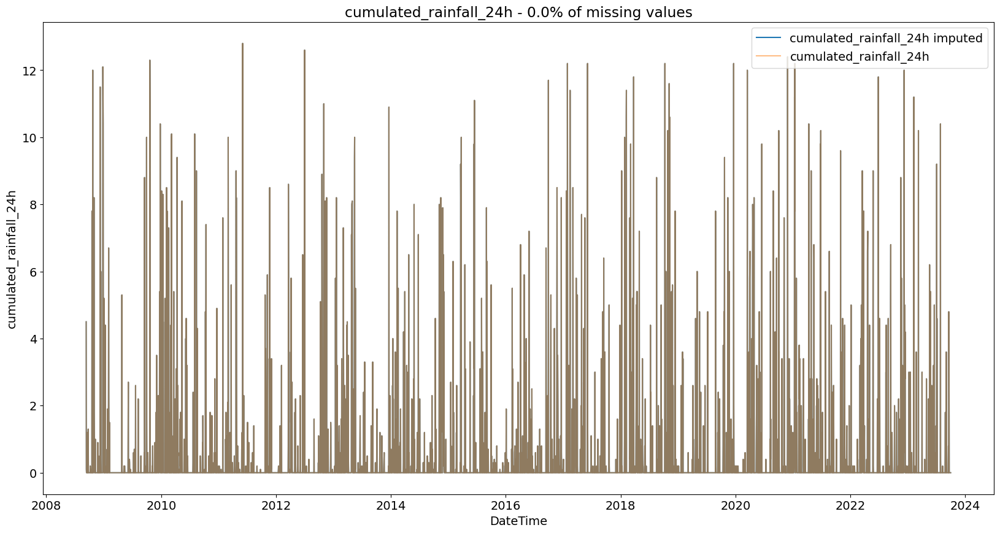

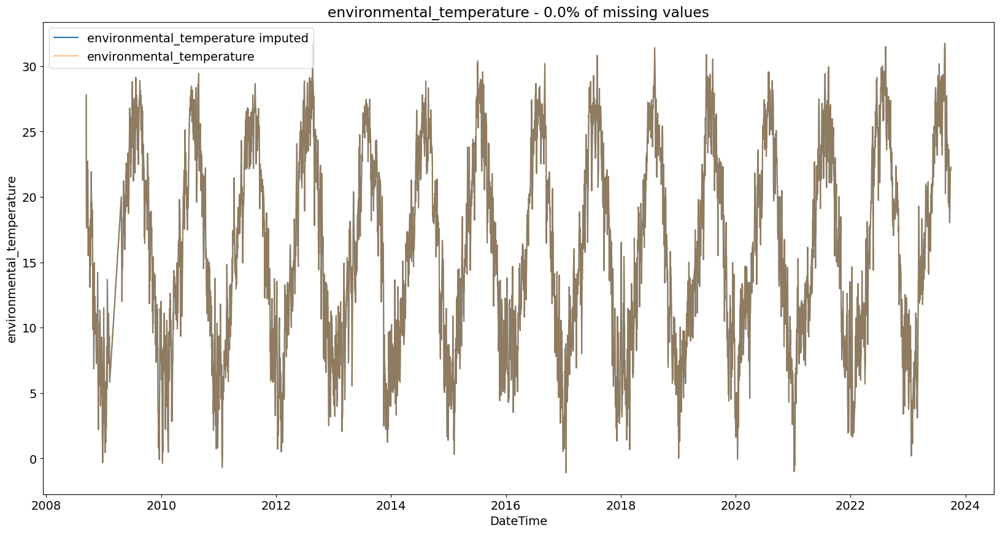

In [95]:
# plot the data for each feature
for feature in guiamets_dfs.keys():
    df_fill[feature + "_is_missing"] = df_fill[feature].isna()

    plt.figure(figsize=(20, 10))
    sns.lineplot(
        data=df_fill,
        x="DateTime",
        y=feature,
        label=feature + " imputed",
    )
    sns.lineplot(
        data=guiamets_df,
        x="DateTime",
        y=feature,
        label=feature,
        alpha=0.5,
    )

    missing_values_perc = (
        df_fill[feature + "_is_missing"].sum() / df_fill.shape[0]
    ) * 100
    missing_values_perc = missing_values_perc.round(2)

    plt.title(
        feature
        + " - "
        + str(missing_values_perc)
        + "% of missing values"
    )
    plt.legend()
    plt.show()

In [96]:
guiamets_df = df_fill

# Mequinenza Preprocessing

In [97]:
mequinenza_dfs.keys()

dict_keys(['cumulated_rainfall_24h'])

In [98]:
mequinenza_dfs["cumulated_rainfall_24h"].isna().sum() / mequinenza_dfs[
    "cumulated_rainfall_24h"
].shape[0]

Acumulado          0.001175
Fecha acumulado    0.001175
M�ximo             1.000000
Fecha m�ximo       1.000000
fecha              0.000000
dtype: float64

In [99]:
mequinenza_dfs["cumulated_rainfall_24h"].drop(
    columns=["Fecha m�ximo", "M�ximo", "Fecha acumulado"], inplace=True
)

In [100]:
mequinenza_dfs["cumulated_rainfall_24h"].rename(
    columns={"fecha": "DateTime", "Acumulado": "Average"}, inplace=True
)

In [101]:
mequinenza_dfs["cumulated_rainfall_24h"]["DateTime"] = pd.to_datetime(
    mequinenza_dfs["cumulated_rainfall_24h"]["DateTime"]
)
mequinenza_dfs["cumulated_rainfall_24h"][
    mequinenza_dfs["cumulated_rainfall_24h"].columns.difference(
        ["DateTime"]
    )
] = mequinenza_dfs["cumulated_rainfall_24h"][
    mequinenza_dfs["cumulated_rainfall_24h"].columns.difference(
        ["DateTime"]
    )
].apply(
    pd.to_numeric, errors="coerce"
)

In [102]:
# Check for missing values in the datasets
for feature, df in mequinenza_dfs.items():
    print(f"{feature}: {df.isna().sum().sum()}")

cumulated_rainfall_24h: 11


In [103]:
# For the moment, drop the missing values
for feature, df in mequinenza_dfs.items():
    mequinenza_dfs[feature] = df.dropna()

## Outliers Detection and Missing Values

### Inspect Data

#### Histograms

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


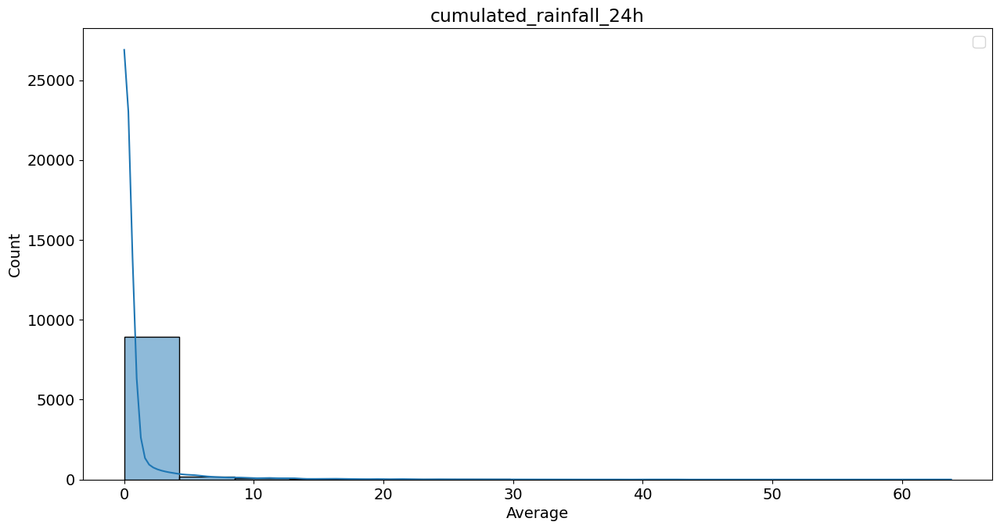

In [104]:
for feature, df in mequinenza_dfs.items():
    plt.figure(figsize=(15, 7.5))
    sns.histplot(data=df["Average"], kde=True)
    # if 'Maximum' in df.columns:
    #     sns.lineplot(data=df, x='DateTime', y='Maximum', label='Maximum')
    # if 'Minimum' in df.columns:
    #     sns.lineplot(data=df, x='DateTime', y='Minimum', label='Minimum')
    plt.title(feature)
    plt.legend()
    plt.show()

#### Boxplots

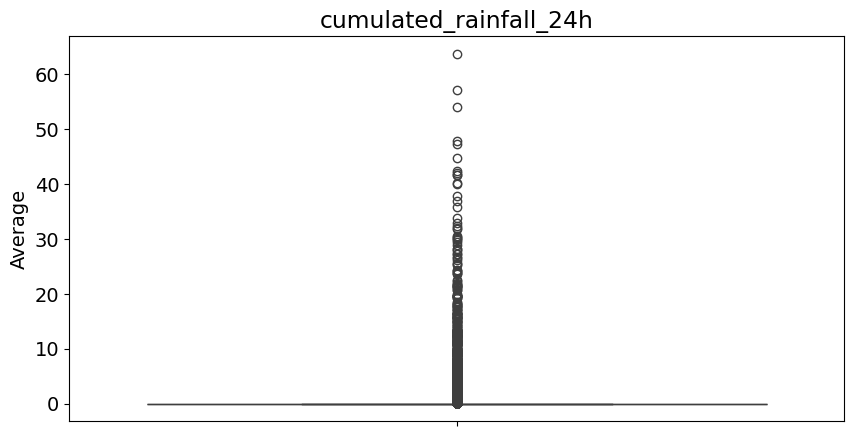

In [105]:
for feature, df in mequinenza_dfs.items():
    plt.figure(figsize=(10, 5))
    sns.boxplot(data=df, y="Average")
    plt.title(feature)
    plt.show()

#### Timeseries

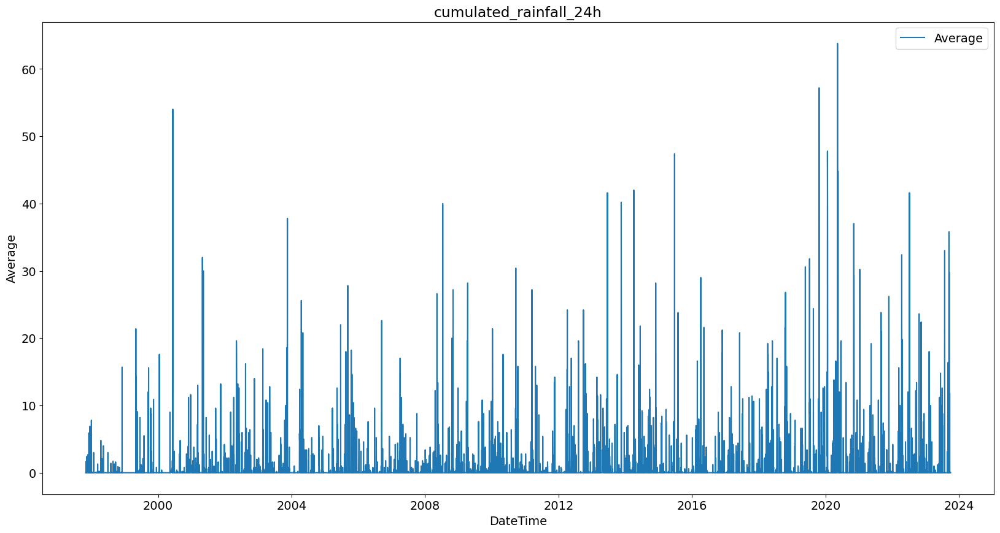

In [106]:
for feature, df in mequinenza_dfs.items():
    plt.figure(figsize=(20, 10))
    sns.lineplot(data=df, x="DateTime", y="Average", label="Average")
    # if 'Maximum' in df.columns:
    #     sns.lineplot(data=df, x='DateTime', y='Maximum', label='Maximum')
    # if 'Minimum' in df.columns:
    #     sns.lineplot(data=df, x='DateTime', y='Minimum', label='Minimum')
    plt.title(feature)
    plt.legend()
    plt.show()

### Clean Data - Feature-wise

How I determined acceptable ranges of values for each feature

* Daily Cumulated Rainfall: This [link](https://weather-and-climate.com/average-monthly-precipitation-Rainfall,tarragona-catalonia-es,Spain) says that the average monthly amount of precipitation ranges from 20 mm to 80 mm. On worst case scenario (80 mm in a month, which is october), considering that [here](https://weatherspark.com/y/45958/Average-Weather-in-Tarragona-Spain-Year-Round) it says that on average on october it rains ~ 6 days, we can assume that in a day it can rain up to ~ **13 mm. I decided to take this value as a threshold.**

#### Daily Cumulated Rainfall

UPDATE: no removal of data since I found out that those values are in a valid range.

In [107]:
rain_df = mequinenza_dfs["cumulated_rainfall_24h"].copy()

In [108]:
threshold = 13

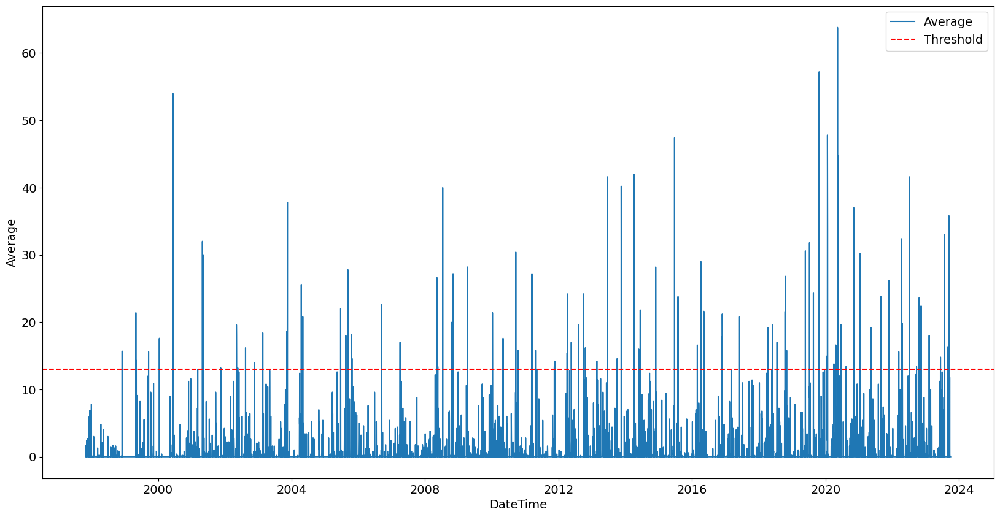

In [109]:
plt.figure(figsize=(20, 10))

sns.lineplot(data=rain_df, x="DateTime", y="Average", label="Average")
plt.axhline(y=threshold, color="r", linestyle="--", label="Threshold")
plt.legend()
plt.show()

In [110]:
rain_df = rain_df[rain_df["Average"] < threshold]

<Axes: xlabel='DateTime', ylabel='Average'>

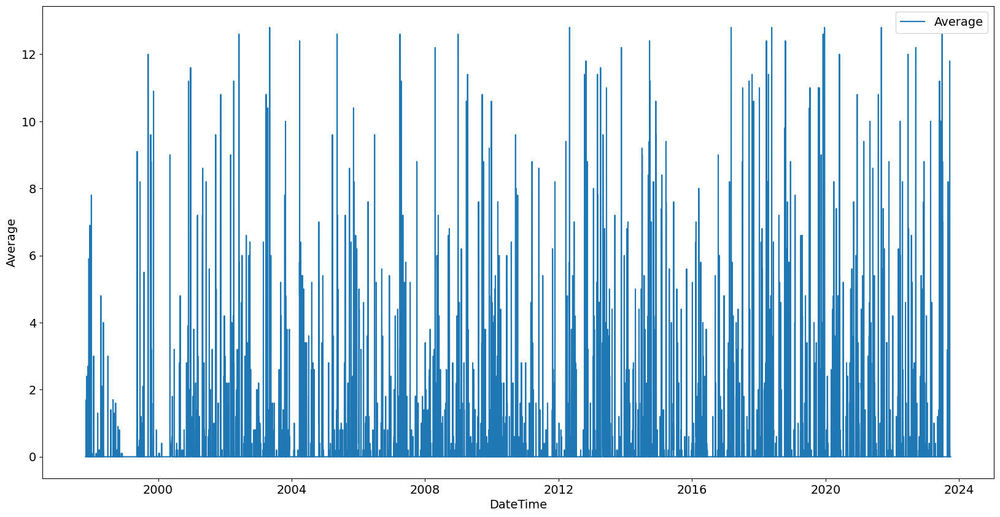

In [111]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=rain_df, x="DateTime", y="Average", label="Average")

In [112]:
mequinenza_dfs["cumulated_rainfall_24h"] = rain_df

### Show uncovered days

In [113]:
for feature, df in mequinenza_dfs.items():
    df = df.set_index("DateTime")

    all_dates = pd.date_range(
        start=df.index.min(), end=df.index.max(), freq="D"
    )
    df = df.reindex(all_dates, fill_value=None)

    df.reset_index(inplace=True)
    df.rename(columns={"index": "DateTime"}, inplace=True)
    mequinenza_dfs[feature] = df

In [114]:
for feature, df in mequinenza_dfs.items():
    print(feature)
    print()
    print(df.isna().sum())
    print()
    print("-" * 50)

cumulated_rainfall_24h

DateTime      0
Average     244
dtype: int64

--------------------------------------------------


cumulated_rainfall_24h
N samples: 9467
N suspicious: 0


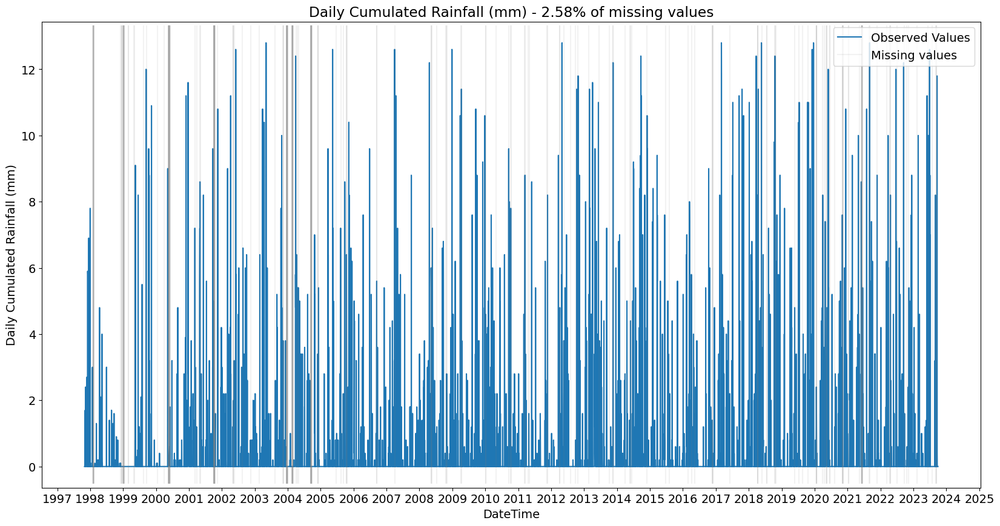

In [115]:
missing_values_df = {}

for feature, df in mequinenza_dfs.items():
    df["is_missing"] = df["Average"].isna()

    label = ""
    if feature == "cumulated_rainfall_24h":
        label = "Daily Cumulated Rainfall (mm)"

    missing_values_perc = (df["is_missing"].sum() / df.shape[0]) * 100
    missing_values_perc = missing_values_perc.round(2)

    missing_values_df[feature] = missing_values_perc

    plt.figure(figsize=(20, 10))
    sns.lineplot(
        data=df, x="DateTime", y="Average", label="Observed Values"
    )

    # Get current axis
    ax = plt.gca()

    # Set major ticks format
    years = mdates.YearLocator()  # every year
    years_fmt = mdates.DateFormatter("%Y")
    ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(years_fmt)

    for date in df[df["is_missing"]]["DateTime"]:
        plt.axvline(
            x=date, ymin=0.01, ymax=0.99, color="grey", alpha=0.1
        )

    # Plot an empty line with a label for the legend
    plt.plot([], [], color="grey", alpha=0.1, label="Missing values")

    plt.title(
        label + " - " + str(missing_values_perc) + "% of missing values"
    )

    plt.ylabel(label)

    plt.legend(loc="upper right")
    plt.savefig(
        os.path.join(
            deliverable_folder,
            "missing_values",
            "Mequinenza",
            f"{feature}.png",
        )
    )

    print(feature)
    print("N samples:", df.shape[0])

    # compute the number of suspicious values
    n_sus = 0
    if lower_threshold:
        n_sus += df[df["Average"] < lower_threshold].shape[0]

    if upper_threshold:
        n_sus += df[df["Average"] > upper_threshold].shape[0]

    print("N suspicious:", n_sus)

missing_values_df = pd.DataFrame(
    missing_values_df.items(), columns=["Feature", "Missing values (%)"]
)

### Combine Datasets

In [116]:
# Rename the Average column to the feature name for each dataframe
# and keep only the DateTime and the feature column
for feature, df in mequinenza_dfs.items():
    df.rename(columns={"Average": feature}, inplace=True)
    df = df[["DateTime", feature, "is_missing"]]
    df.rename(
        columns={"is_missing": feature + "_is_missing"}, inplace=True
    )
    mequinenza_dfs[feature] = df

In [117]:
# combine all xerta datasets into a single dataframe

from functools import reduce

# Get a list of all dataframes
dfs = list(mequinenza_dfs.values())

# Use reduce to merge all dataframes
mequinenza_df = reduce(
    lambda left, right: pd.merge(left, right, on="DateTime"), dfs
)

### Fill NaNs

#### MICE month by month

In [118]:
%%script false --no-raise-error
# explicitly require this experimental feature
from sklearn.experimental import enable_iterative_imputer  # noqa

# now you can import normally from sklearn.impute
from sklearn.impute import IterativeImputer
from sklearn import linear_model

# Define MICE Imputer and fill missing values
mice_imputer = IterativeImputer(
    random_state=0,
    keep_empty_features=True,
    max_iter=30,
)

df_fill = mequinenza_df.copy()
df_fill = df_fill[
    df_fill.columns[
        df_fill.columns.isin(list(mequinenza_dfs.keys()) + ["DateTime"])
    ]
]

# fill missing values with MICE with imputation month by month
df_fill.sort_values(by="DateTime", inplace=True)
min_year = df_fill["DateTime"].iloc[0].year
max_year = df_fill["DateTime"].iloc[-1].year
df_fill_imputed = pd.DataFrame()
for year in range(min_year, max_year + 1):
    if year in df_fill["DateTime"].dt.year.unique():
        for month in range(1, 13):
            if (
                month
                in df_fill[df_fill["DateTime"].dt.year == year][
                    "DateTime"
                ].dt.month.unique()
            ):
                df_fill_data = df_fill[
                    (df_fill["DateTime"].dt.year == year)
                    & (df_fill["DateTime"].dt.month == month)
                ][df_fill.columns.difference(["DateTime"])].copy()

                # Save the indices of the rows with all missing values
                all_missing_indices = df_fill_data[
                    df_fill_data.isna().all(axis=1)
                ].index

                if not all_missing_indices.empty:
                    # Fill rows at only the indices contained all_missing_indices with ewma
                    df_fill_data.loc[all_missing_indices] = (
                        df_fill[
                            df_fill.columns.difference(["DateTime"])
                        ]
                        .loc[all_missing_indices]
                        .ewm(span=5)
                        .mean()
                    )

                imputed_data = pd.DataFrame(
                    mice_imputer.fit_transform(df_fill_data),
                    columns=df_fill_data.columns,
                )
                month_datetime = df_fill[
                    (df_fill["DateTime"].dt.year == year)
                    & (df_fill["DateTime"].dt.month == month)
                ]["DateTime"].copy()
                month_datetime.reset_index(drop=True, inplace=True)
                imputed_data["DateTime"] = month_datetime

                df_fill_imputed = pd.concat(
                    [df_fill_imputed, imputed_data], axis=0
                )
df_fill = df_fill_imputed

#### EWMA Imputer

In [119]:
%%script false --no-raise-error
df_fill = mequinenza_df.copy()
df_fill = df_fill[
    df_fill.columns[
        df_fill.columns.isin(list(mequinenza_dfs.keys()) + ["DateTime"])
    ]
]

# EWMA Imputer
for feature in mequinenza_dfs.keys():
    df_fill[feature] = df_fill[feature].fillna(
        pd.Series.ewm(
            df_fill[feature],
            times=df_fill["DateTime"],
            halflife=pd.Timedelta(days=7),
        ).mean()
    )

#### Interpolation

In [120]:
# fill missing values with interpolation
df_fill = mequinenza_df.copy()
df_fill.set_index("DateTime", inplace=True)
df_fill = df_fill.interpolate(method="time", limit_direction="both")
df_fill.reset_index(inplace=True)

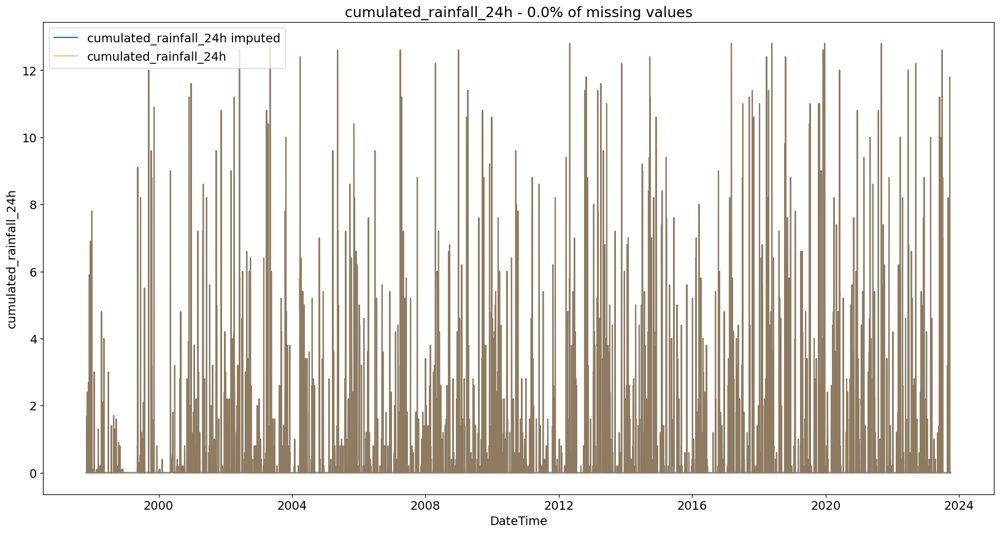

In [121]:
# plot the data for each feature
for feature in mequinenza_dfs.keys():
    df_fill[feature + "_is_missing"] = df_fill[feature].isna()

    plt.figure(figsize=(20, 10))
    sns.lineplot(
        data=df_fill,
        x="DateTime",
        y=feature,
        label=feature + " imputed",
    )
    sns.lineplot(
        data=mequinenza_df,
        x="DateTime",
        y=feature,
        label=feature,
        alpha=0.5,
    )

    missing_values_perc = (
        df_fill[feature + "_is_missing"].sum() / df_fill.shape[0]
    ) * 100
    missing_values_perc = missing_values_perc.round(2)

    plt.title(
        feature
        + " - "
        + str(missing_values_perc)
        + "% of missing values"
    )
    plt.legend()
    plt.show()

In [122]:
mequinenza_df = df_fill

# Xerta Preprocessing

In [123]:
xerta_dfs.keys()
xerta_dfs["conductivity"] = xerta_dfs.pop("Conductivity")

In [124]:
for feature, df in xerta_dfs.items():
    print("Feature:", feature)
    print()
    print("% missing values:")
    print()
    print(df.isna().sum() / df.shape[0])
    print()
    print("Column names:", df.columns.to_list())
    print()
    print("-" * 100)
    print()

Feature: nitrate

% missing values:

Fecha       0.0
Promedio    0.0
Mínimo      0.0
Máximo      0.0
Nºdat       0.0
NºOK        0.0
dtype: float64

Column names: ['Fecha', 'Promedio', 'Mínimo', 'Máximo', 'Nºdat', 'NºOK']

----------------------------------------------------------------------------------------------------

Feature: ABS254

% missing values:

Fecha       0.0
Promedio    0.0
Mínimo      0.0
Máximo      0.0
Nºdat       0.0
NºOK        0.0
dtype: float64

Column names: ['Fecha', 'Promedio', 'Mínimo', 'Máximo', 'Nºdat', 'NºOK']

----------------------------------------------------------------------------------------------------

Feature: pH

% missing values:

Fecha       0.0
Promedio    0.0
Mínimo      0.0
Máximo      0.0
Nºdat       0.0
NºOK        0.0
dtype: float64

Column names: ['Fecha', 'Promedio', 'Mínimo', 'Máximo', 'Nºdat', 'NºOK']

----------------------------------------------------------------------------------------------------

Feature: Ammonium

% missing va

In [125]:
for df in xerta_dfs.values():
    df.rename(
        columns={
            "Fecha": "DateTime",
            "Promedio": "Average",
            "Máximo": "Maximum",
            "Mínimo": "Minimum",
        },
        inplace=True,
    )

    df["DateTime"] = pd.to_datetime(df["DateTime"])
    df[df.columns.difference(["DateTime"])] = df[
        df.columns.difference(["DateTime"])
    ].apply(pd.to_numeric, errors="coerce")

In [126]:
# Check for missing values in the datasets
for feature, df in xerta_dfs.items():
    print(f"{feature}: {df.isna().sum().sum()}")

nitrate: 528
ABS254: 1689
pH: 2682
Ammonium: 3945
dissolvedoxygen: 3495
redoxpotential: 978
turbidity: 3255
watertemperature: 2517
conductivity: 2709


In [127]:
# For the moment, drop the missing values
for feature, df in xerta_dfs.items():
    xerta_dfs[feature] = df.dropna()

## Outliers Detection and Missing Values

### Inspect Data

#### Histograms

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


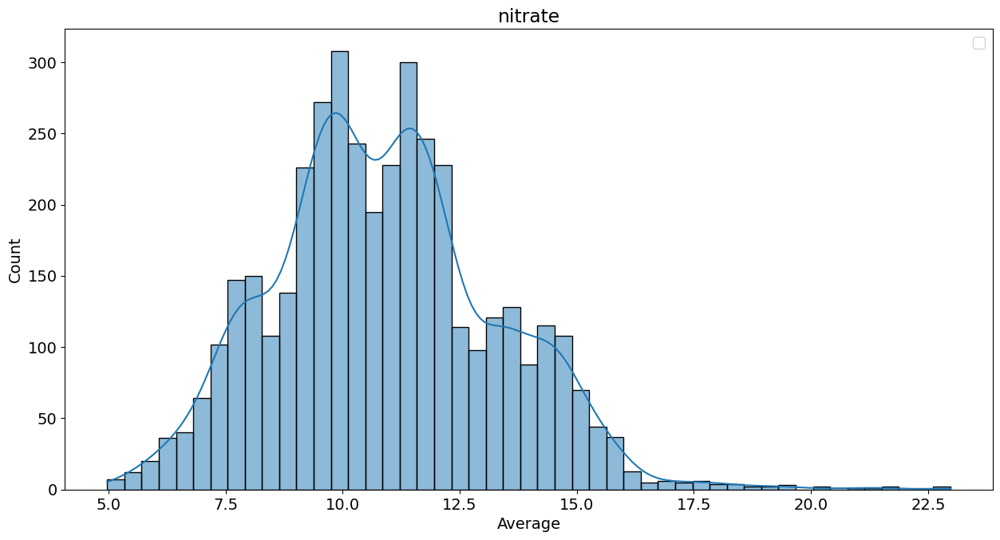

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


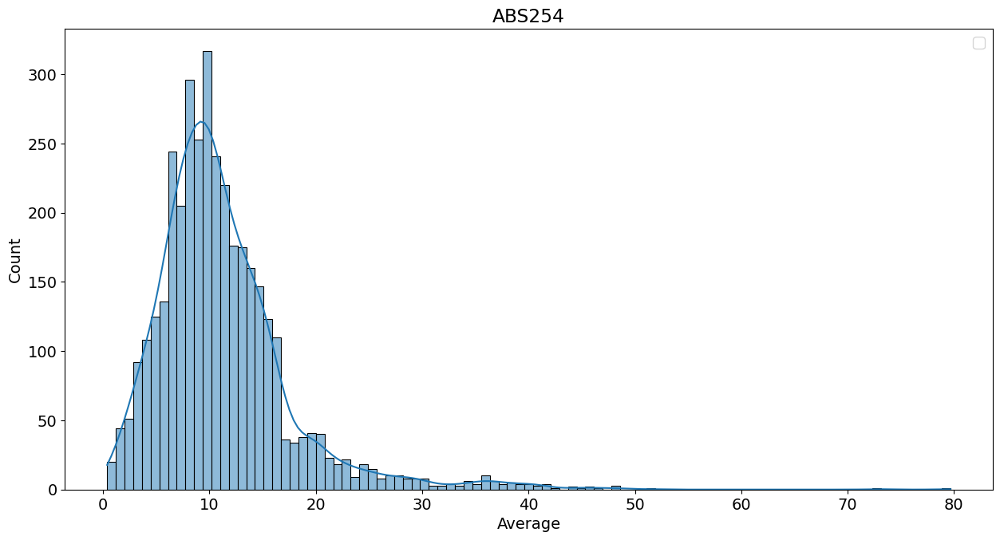

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


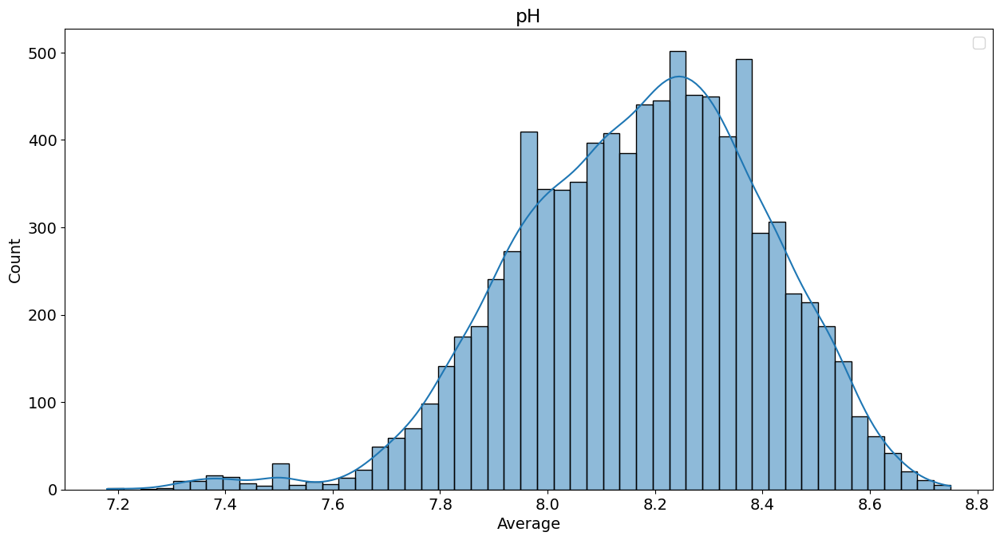

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


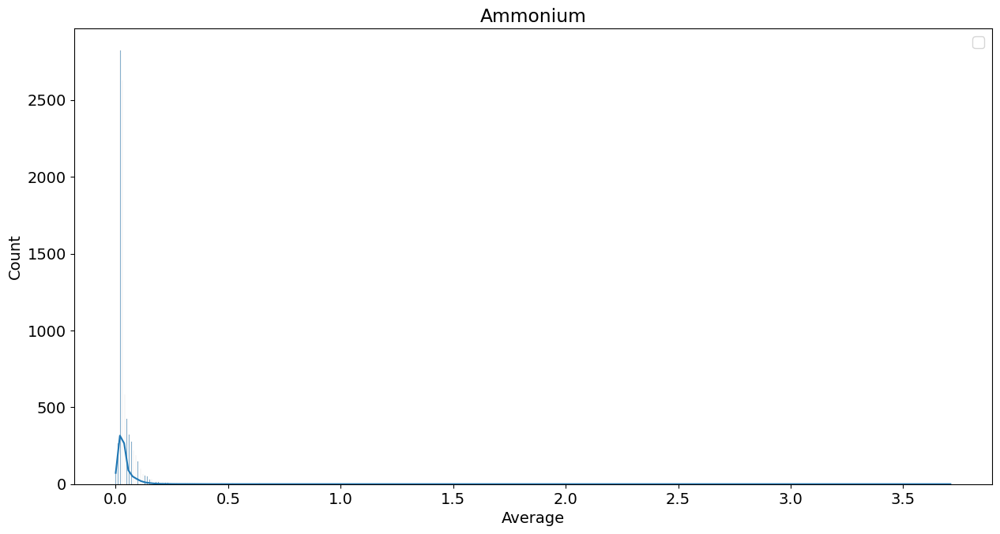

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


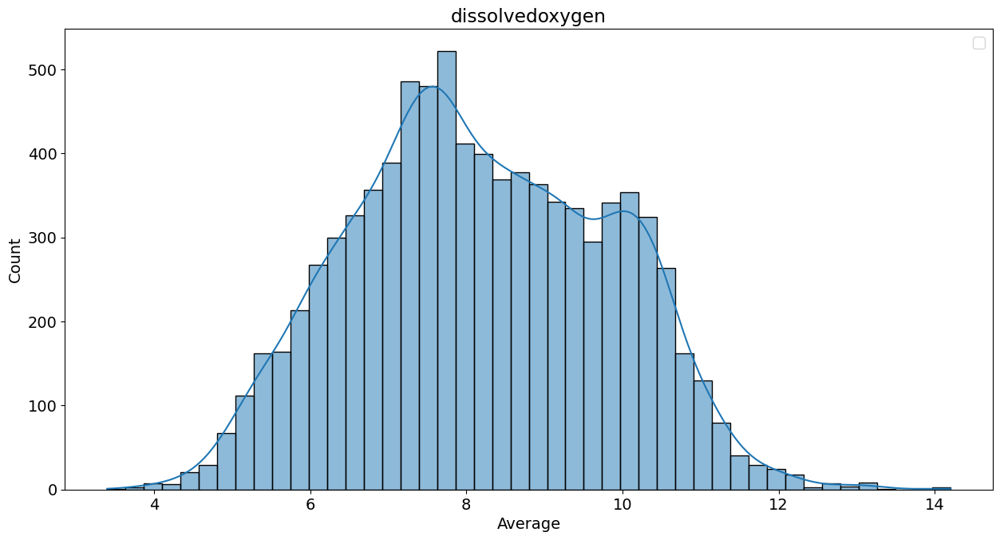

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


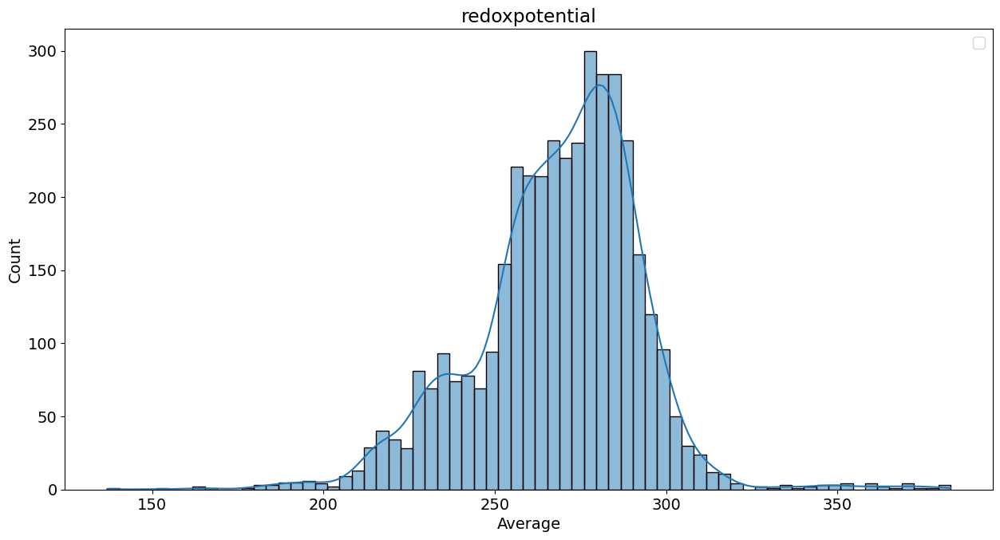

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


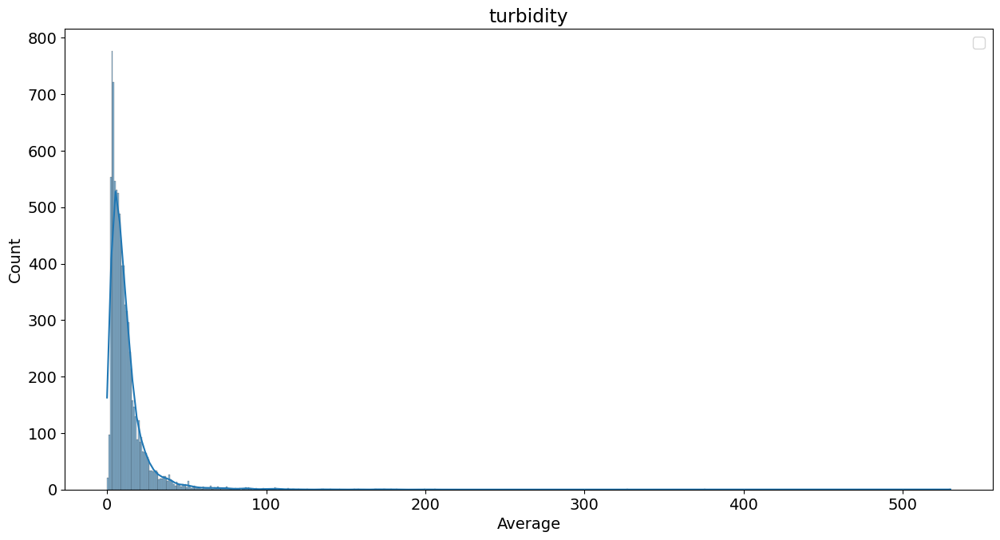

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


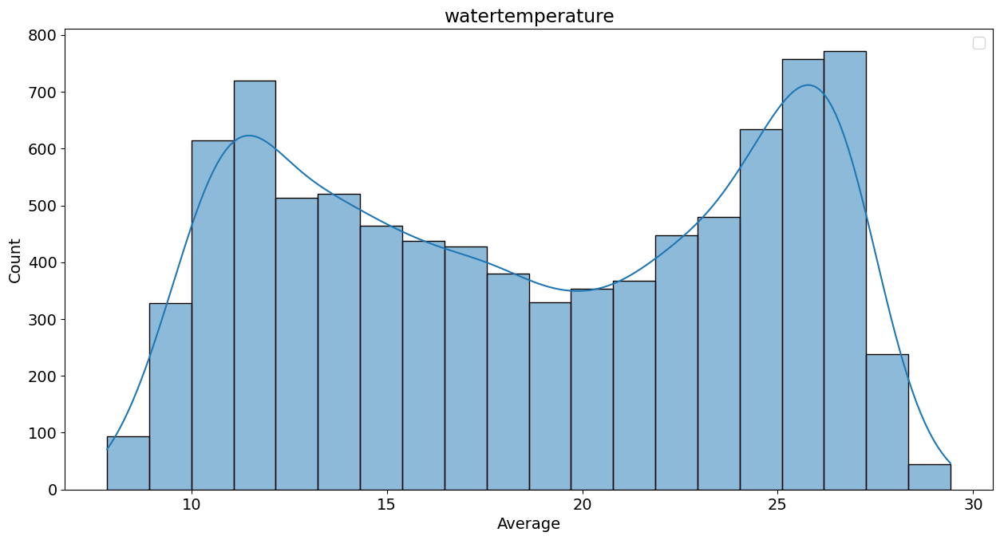

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


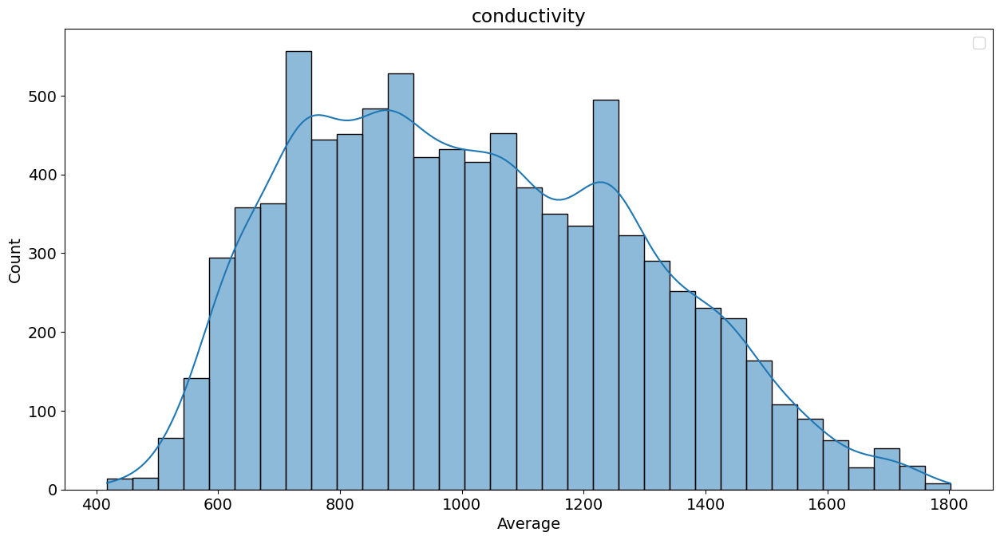

In [128]:
for feature, df in xerta_dfs.items():
    plt.figure(figsize=(15, 7.5))
    sns.histplot(data=df["Average"], kde=True)
    # if 'Maximum' in df.columns:
    #     sns.lineplot(data=df, x='DateTime', y='Maximum', label='Maximum')
    # if 'Minimum' in df.columns:
    #     sns.lineplot(data=df, x='DateTime', y='Minimum', label='Minimum')
    plt.title(feature)
    plt.legend()
    plt.show()

#### Boxplots

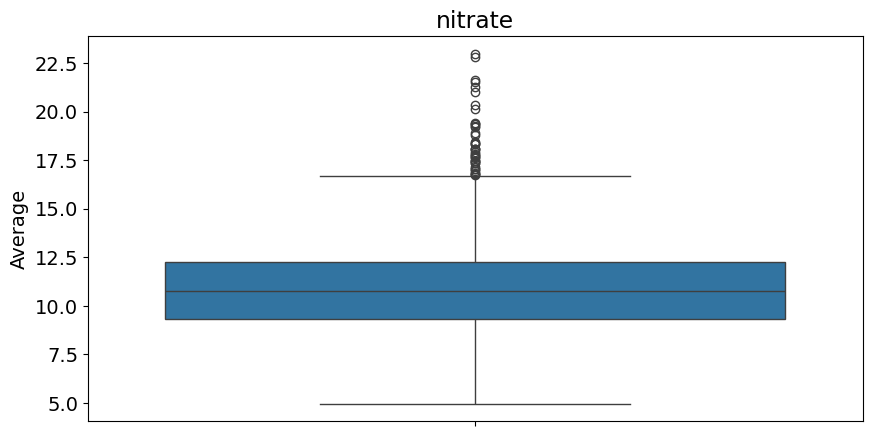

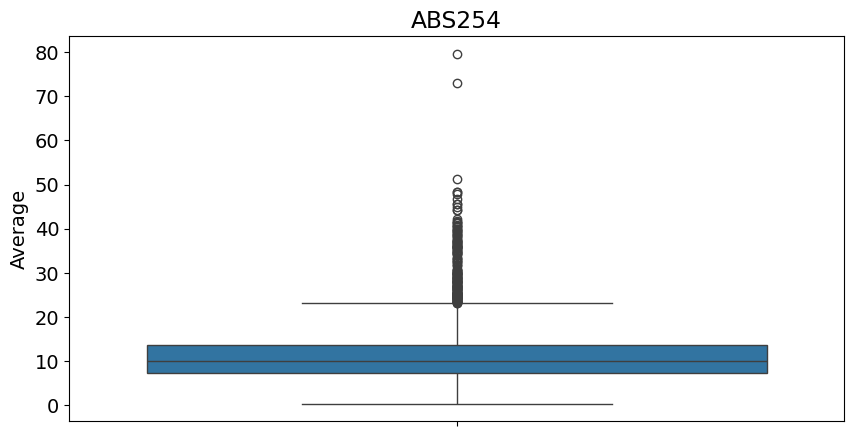

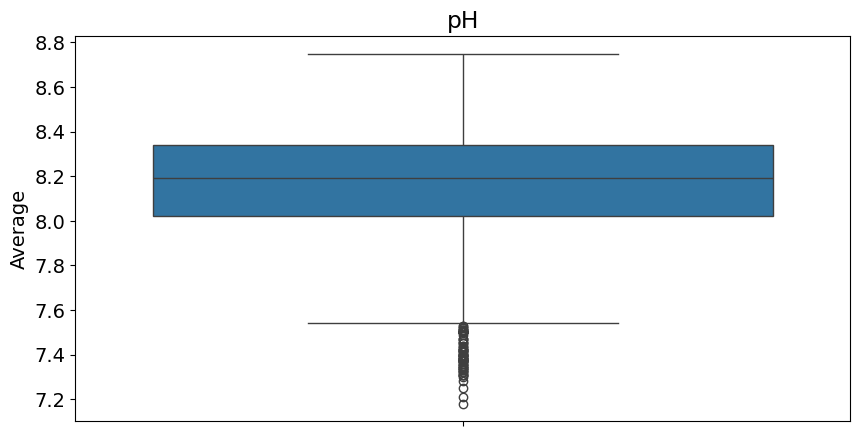

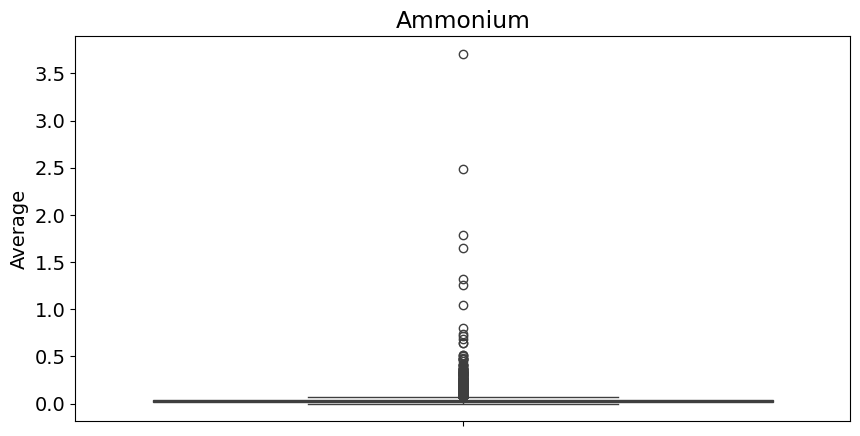

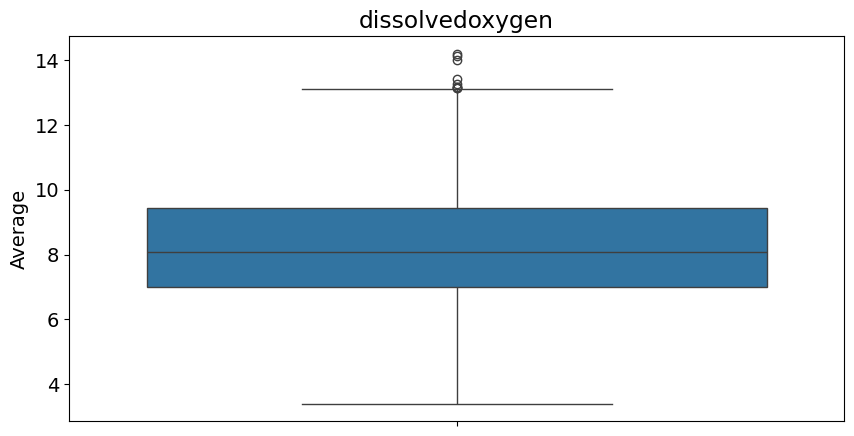

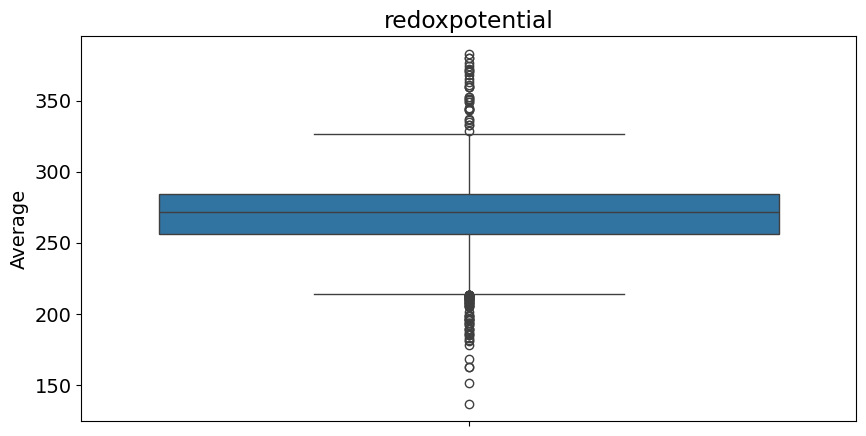

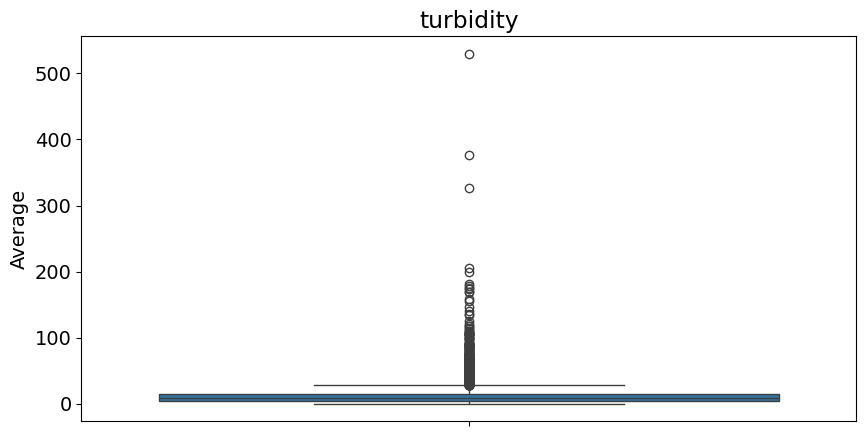

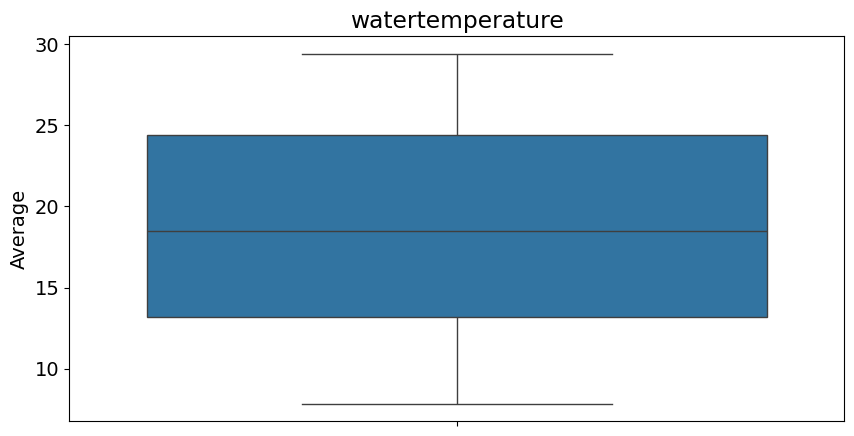

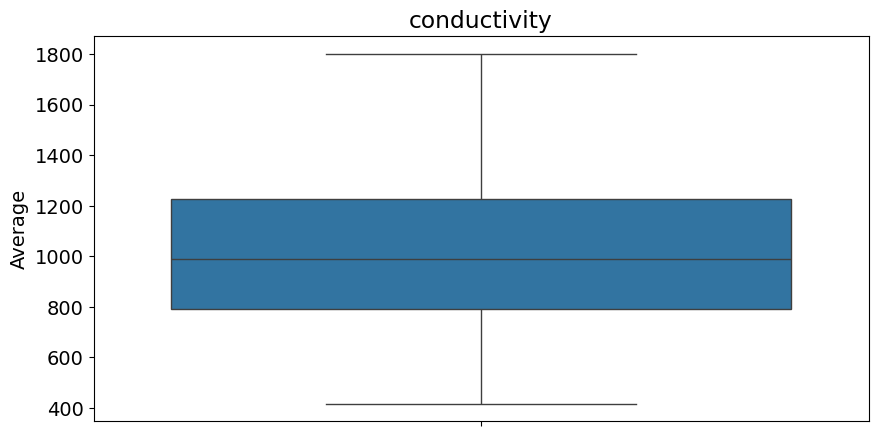

In [129]:
for feature, df in xerta_dfs.items():
    plt.figure(figsize=(10, 5))
    sns.boxplot(data=df, y="Average")
    plt.title(feature)
    plt.show()

#### Timeseries

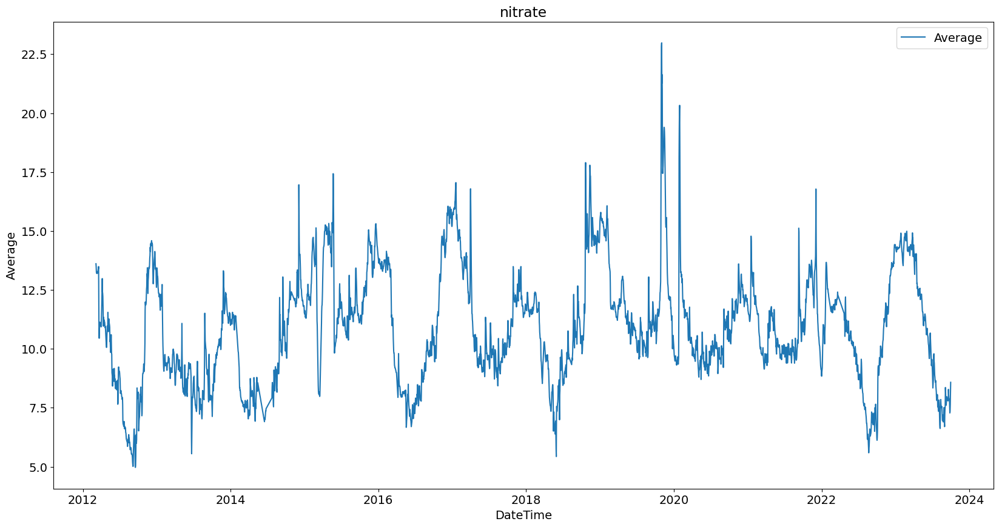

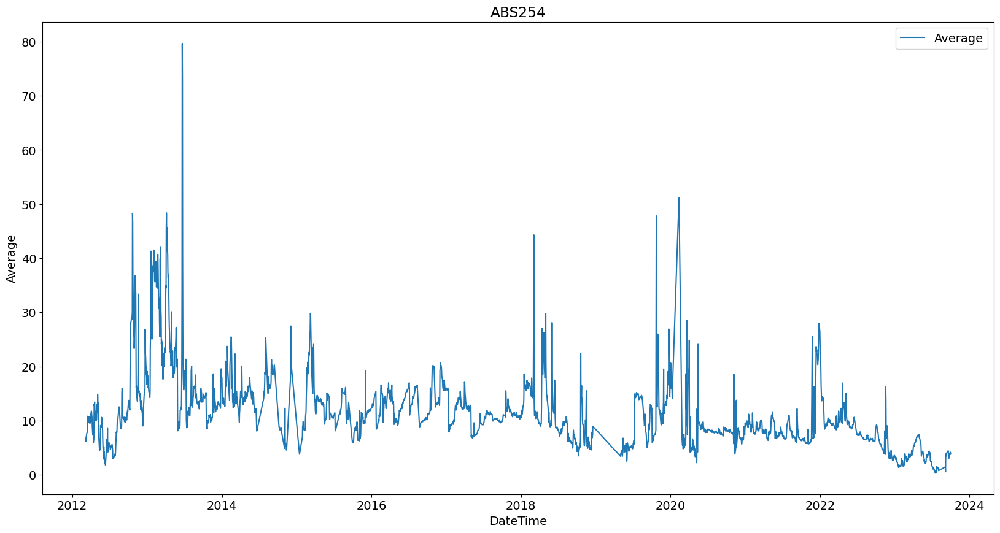

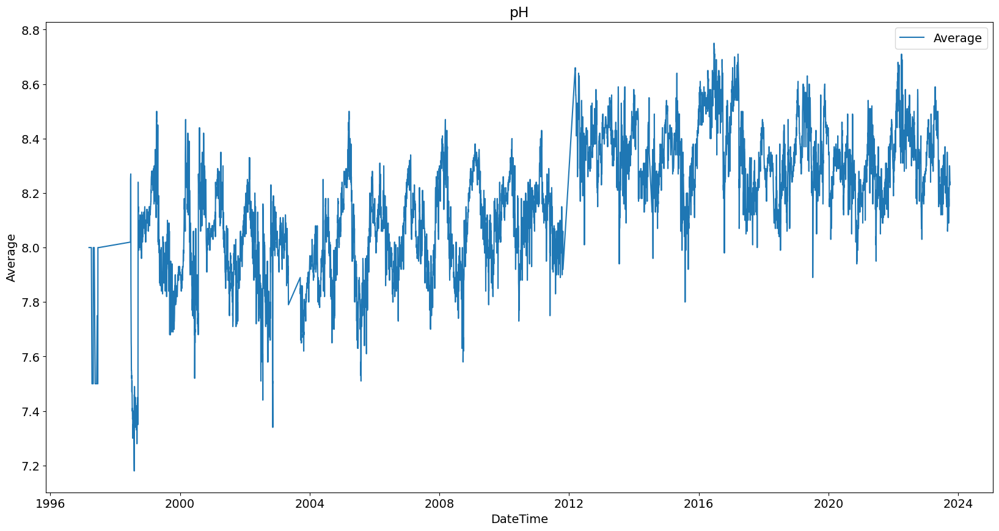

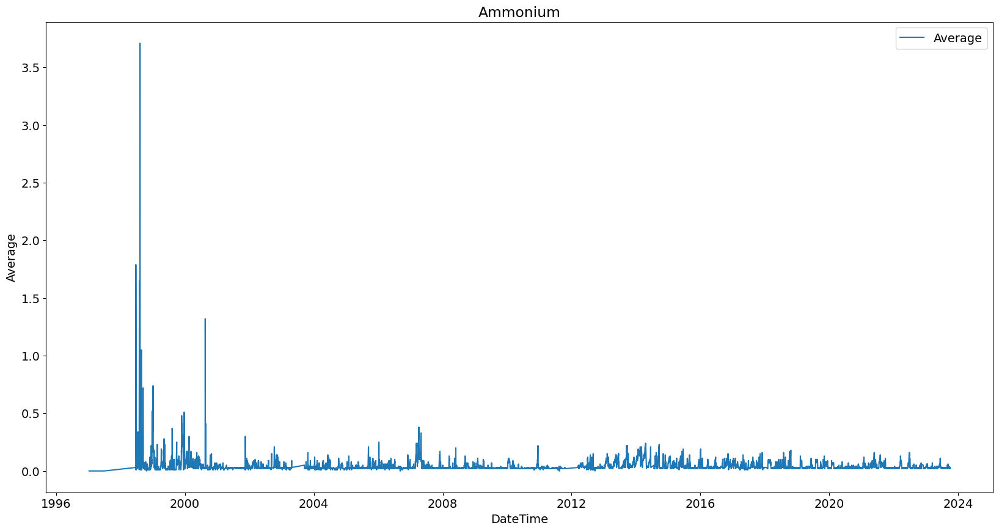

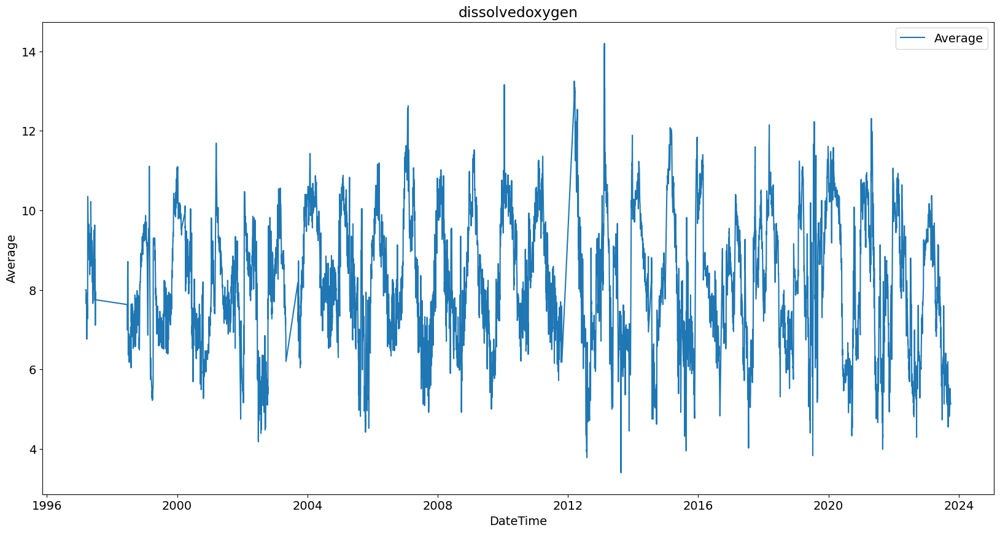

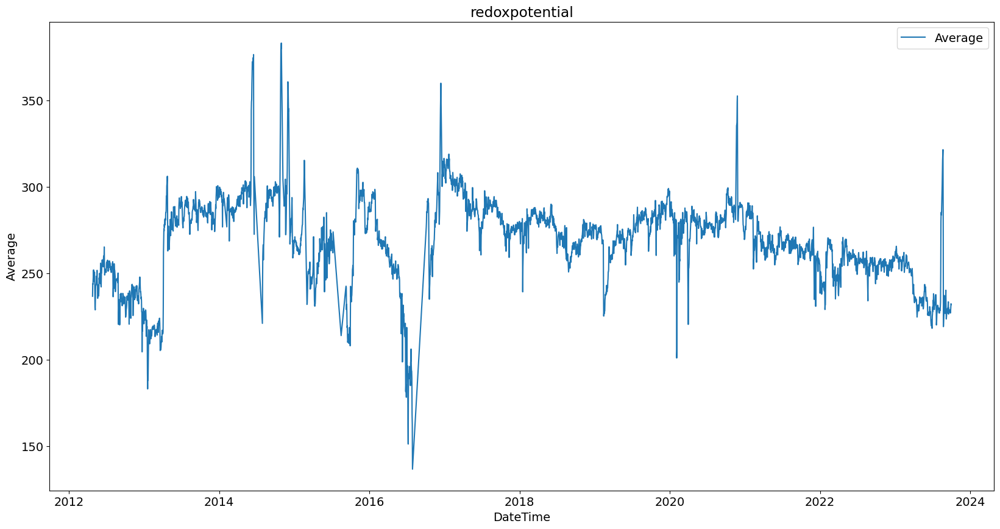

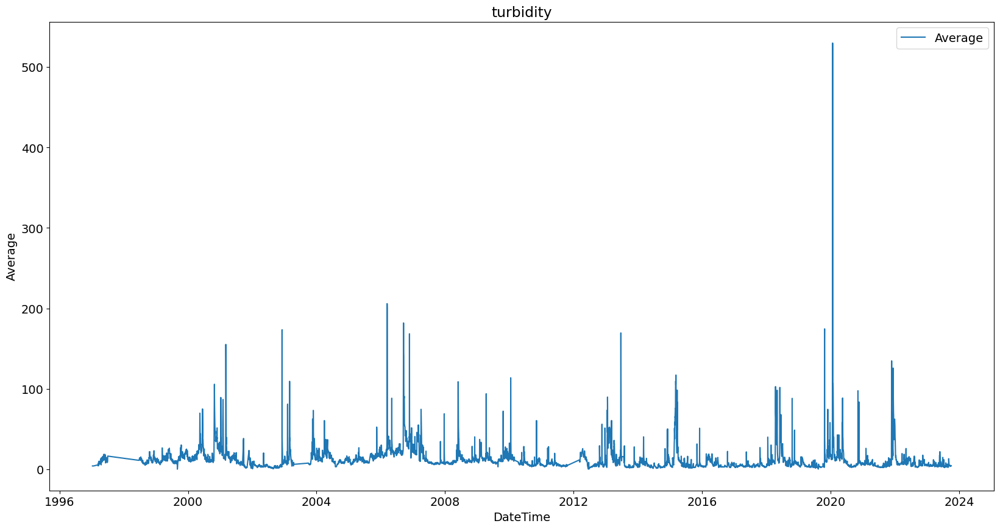

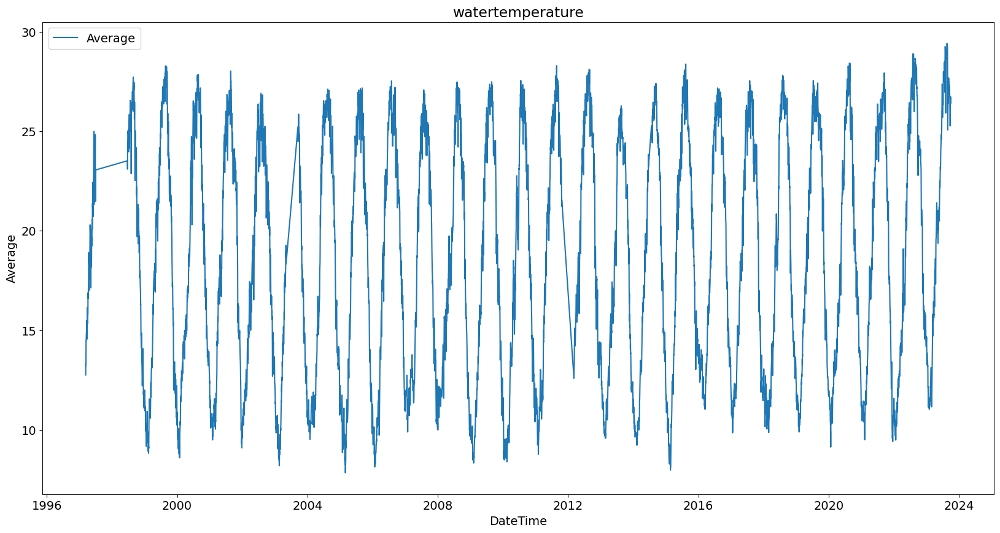

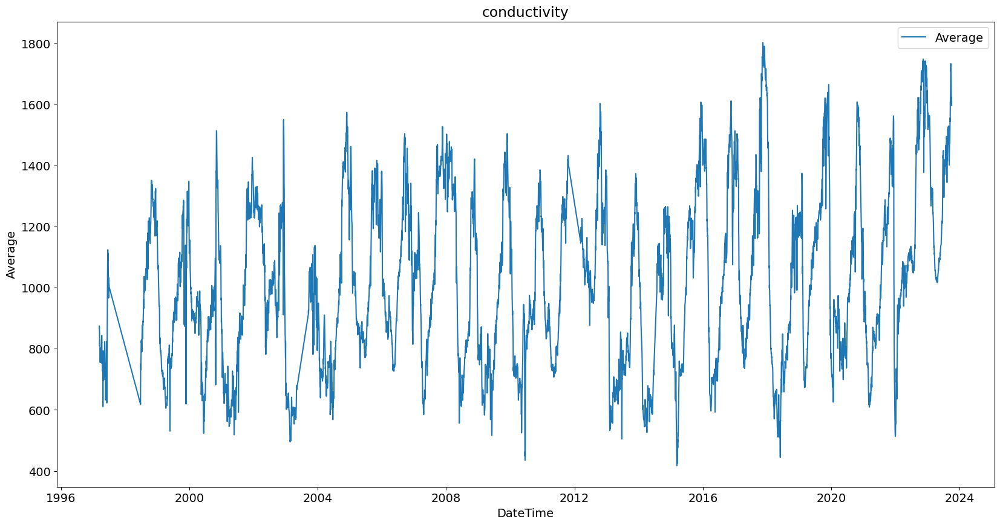

In [130]:
for feature, df in xerta_dfs.items():
    plt.figure(figsize=(20, 10))
    sns.lineplot(data=df, x="DateTime", y="Average", label="Average")
    # if 'Maximum' in df.columns:
    #     sns.lineplot(data=df, x='DateTime', y='Maximum', label='Maximum')
    # if 'Minimum' in df.columns:
    #     sns.lineplot(data=df, x='DateTime', y='Minimum', label='Minimum')
    plt.title(feature)
    plt.legend()
    plt.show()

### Clean Data - Feature-wise

How I determined acceptable ranges of values for each feature

* Nitrate: the EU [analyzed](https://water.jrc.ec.europa.eu/pdf/ebro-fs.pdf) the nitrate concentration in the Ebro river showing evidence that the range of values measured is valid, with minimum measures around 5 mg/L and maximum of 39 mg/L. Therefore, **no removal is necessary**.

* ABS254: unit of measure needed in order to understand if the range of values is valid. If it is measured in m^-1 then it the values are in a valid domain. **The only value which seems to be an outlier is visible from the plot, so I decided to remove only that value. Further analysis is required.**

* pH: no outliers are visible from the plot, the range of values is in a valid domain.

* Ammonium: the EU [analyzed](https://www.eea.europa.eu/publications/topic_report_1996_4/) the average ammonium concentration for the biggest rivers in Europe, **with an average value for the Ebro river of 1 mg/L. So I decided to take 1 as the threshold for this measure.** It is also visible from the plot that there are some outliers. 

* Dissolved Oxygen: compared to other European rivers ([[1]](https://www.eea.europa.eu/help/glossary/semide-emwis-thesaurus/dissolved-oxygen) [[2]](https://www.nature.com/articles/s41558-023-01793-3.epdf?sharing_token=9FHw4vs9ayQDshsDGgw2YdRgN0jAjWel9jnR3ZoTv0N_UAFixjh8yBKAAv5SFFi5TZqeEarq8OCLvF2MOwUvnjpgszm-R5dkD1f1gBUn4ekry_rdvkaYaFttq-a3c_LSIIKRC1QfCVCpMu_ayGcOH4TMz8rleqgElh88xKQM0dBT-DGm7KbFzOvy-bkWM6Jk9T5xJFx05CGT-dZ63W2867oF1IE9pLwJuzpmyfBZaJg%3D&tracking_referrer=www.newscientist.com)), the range of values is considered valid.

* Conductivity: the range of values is valid. Therefore, **no removal is necessary.**

* Redox Potential: in [this](https://link.springer.com/chapter/10.1007/978-3-662-04080-5_1) ORP book, it is said that the range of ORP can vary from -400 to 800 mV, so the domain is considered valid.

* Turbidity: [DataStream](https://datastream.org/en-ca/guidebook/turbidity#:~:text=Turbidity%20values%20less%20than%2010,be%20more%20than%20100%20NTU.) says that high levels of turbidity are > 100 NTU. [In-Situ](https://in-situ.com/us/faq/water-quality-information/what-are-typical-turbidity-values-in-natural-environments#:~:text=Turbidity%20values%20in%20natural%20environments%20can%20range%20from%20as%20low,a%20major%20storm%20runoff%20event.) says that levels of turbidity > 100 NTU are unsafe for most aquatic life. [Wikipedia](https://in-situ.com/us/faq/water-quality-information/what-are-typical-turbidity-values-in-natural-environments#:~:text=Turbidity%20values%20in%20natural%20environments%20can%20range%20from%20as%20low,a%20major%20storm%20runoff%20event.) says that the Ebro river has a wide ecosystem. Given these considerations, **I decided to consider valid the range of values between 0 and 150 NTU**.

* Water Temperature: same as conductivity.

#### ABS254

In [131]:
abs_df = xerta_dfs["ABS254"].copy()

In [132]:
threshold = 43

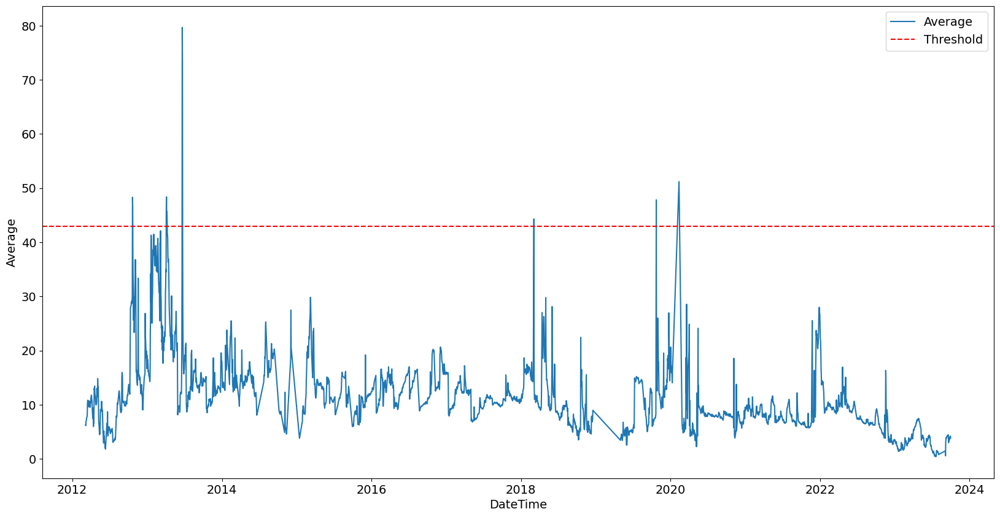

In [133]:
plt.figure(figsize=(20, 10))

sns.lineplot(data=abs_df, x="DateTime", y="Average", label="Average")
plt.axhline(y=threshold, color="r", linestyle="--", label="Threshold")
plt.legend()
plt.show()

In [134]:
# abs_df = abs_df[abs_df["Average"] < threshold]

<Axes: xlabel='DateTime', ylabel='Average'>

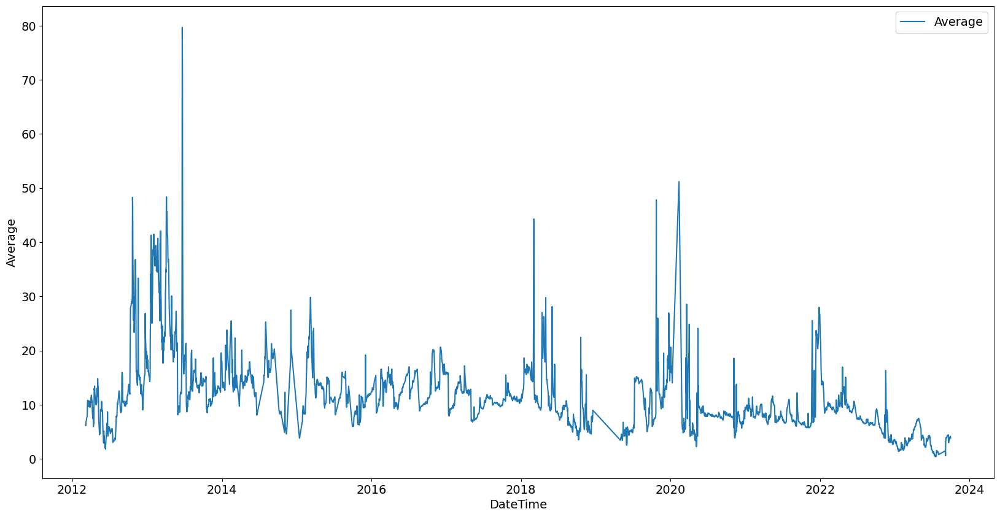

In [135]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=abs_df, x="DateTime", y="Average", label="Average")

In [136]:
xerta_dfs["ABS254"] = abs_df

#### Ammonium

In [137]:
ammon_df = xerta_dfs["Ammonium"].copy()

In [138]:
threshold = 1

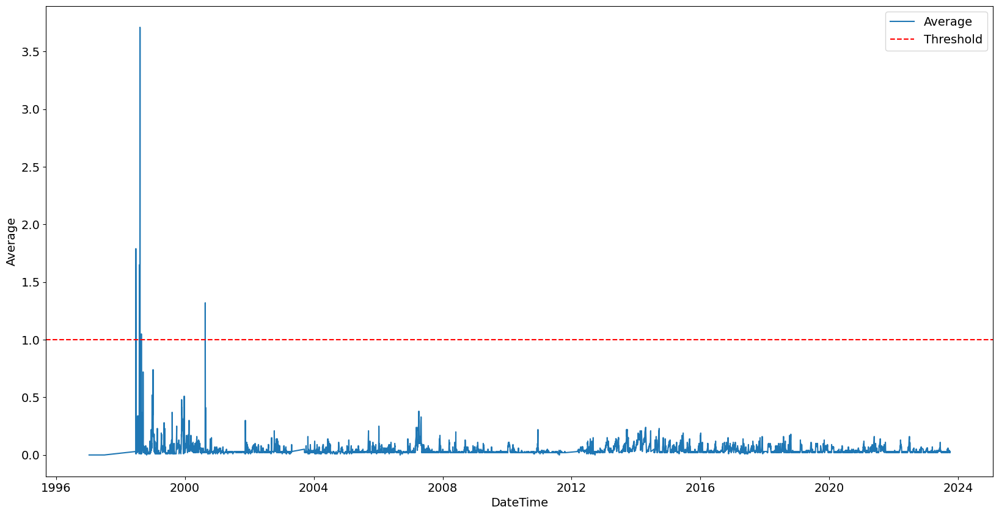

In [139]:
plt.figure(figsize=(20, 10))

sns.lineplot(data=ammon_df, x="DateTime", y="Average", label="Average")
plt.axhline(y=threshold, color="r", linestyle="--", label="Threshold")
plt.legend()
plt.show()

In [140]:
ammon_df = ammon_df[ammon_df["Average"] < threshold]

<Axes: xlabel='DateTime', ylabel='Average'>

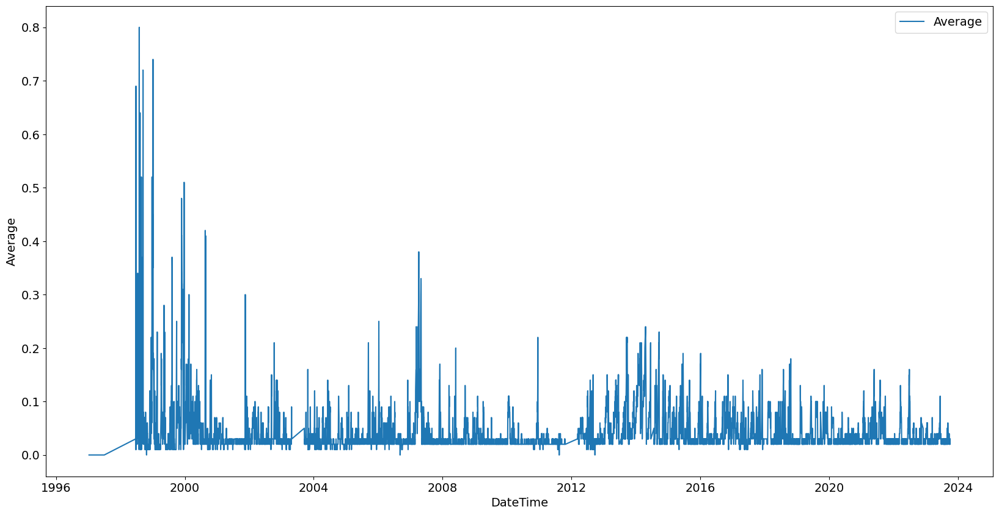

In [141]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=ammon_df, x="DateTime", y="Average", label="Average")

In [142]:
xerta_dfs["Ammonium"] = ammon_df

#### Turbidity

In [143]:
turb_df = xerta_dfs["turbidity"].copy()

In [144]:
threshold = 150

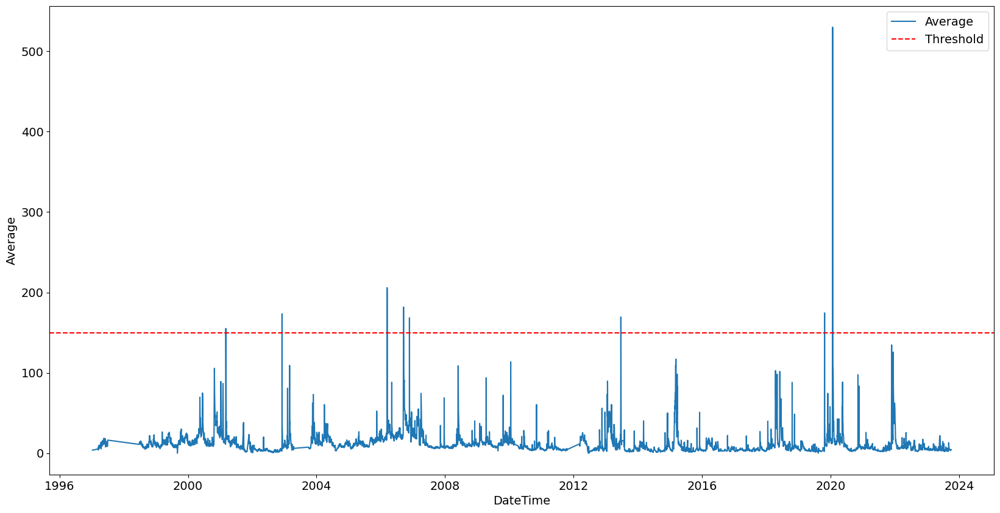

In [145]:
plt.figure(figsize=(20, 10))

sns.lineplot(data=turb_df, x="DateTime", y="Average", label="Average")
plt.axhline(y=threshold, color="r", linestyle="--", label="Threshold")
plt.legend()
plt.show()

In [146]:
turb_df = turb_df[turb_df["Average"] < threshold]

<Axes: xlabel='DateTime', ylabel='Average'>

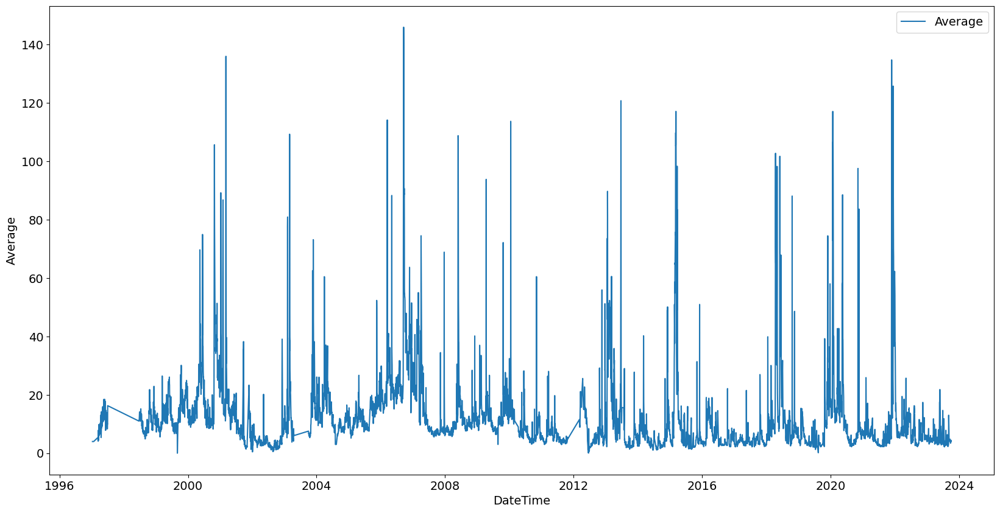

In [147]:
plt.figure(figsize=(20, 10))
sns.lineplot(data=turb_df, x="DateTime", y="Average", label="Average")

In [148]:
xerta_dfs["turbidity"] = turb_df

### Show uncovered days

In [149]:
for feature, df in xerta_dfs.items():
    df = df.set_index("DateTime")

    all_dates = pd.date_range(
        start=df.index.min(), end=df.index.max(), freq="D"
    )
    df = df.reindex(all_dates, fill_value=None)

    df.reset_index(inplace=True)
    df.rename(columns={"index": "DateTime"}, inplace=True)
    xerta_dfs[feature] = df

In [150]:
for feature, df in xerta_dfs.items():
    print(feature)
    print()
    print(df.isna().sum())
    print()
    print("-" * 50)

nitrate

DateTime      0
Average     176
Minimum     176
Maximum     176
Nºdat       176
NºOK        176
dtype: int64

--------------------------------------------------
ABS254

DateTime      0
Average     562
Minimum     562
Maximum     562
Nºdat       562
NºOK        562
dtype: int64

--------------------------------------------------
pH

DateTime      0
Average     833
Minimum     833
Maximum     833
Nºdat       833
NºOK        833
dtype: int64

--------------------------------------------------
Ammonium

DateTime       0
Average     1322
Minimum     1322
Maximum     1322
Nºdat       1322
NºOK        1322
dtype: int64

--------------------------------------------------
dissolvedoxygen

DateTime       0
Average     1105
Minimum     1105
Maximum     1105
Nºdat       1105
NºOK        1105
dtype: int64

--------------------------------------------------
redoxpotential

DateTime      0
Average     275
Minimum     275
Maximum     275
Nºdat       275
NºOK        275
dtype: int64

---------

nitrate
N samples: 4227
N suspicious: 0
ABS254
N samples: 4227
N suspicious: 2
pH
N samples: 9700
N suspicious: 0
Ammonium
N samples: 9761
N suspicious: 0
dissolvedoxygen
N samples: 9701
N suspicious: 0
redoxpotential
N samples: 4177
N suspicious: 0
turbidity
N samples: 9761
N suspicious: 0
watertemperature
N samples: 9701
N suspicious: 0
conductivity
N samples: 9701
N suspicious: 0


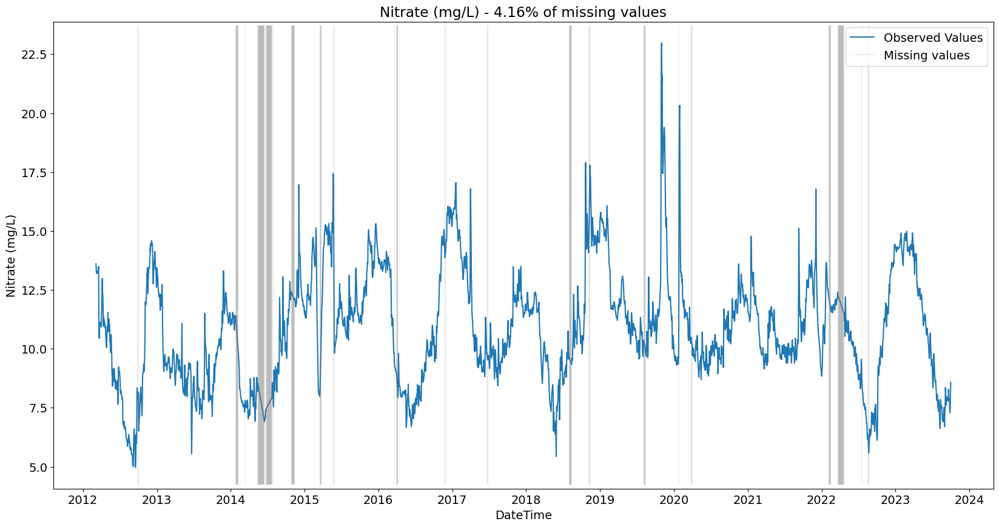

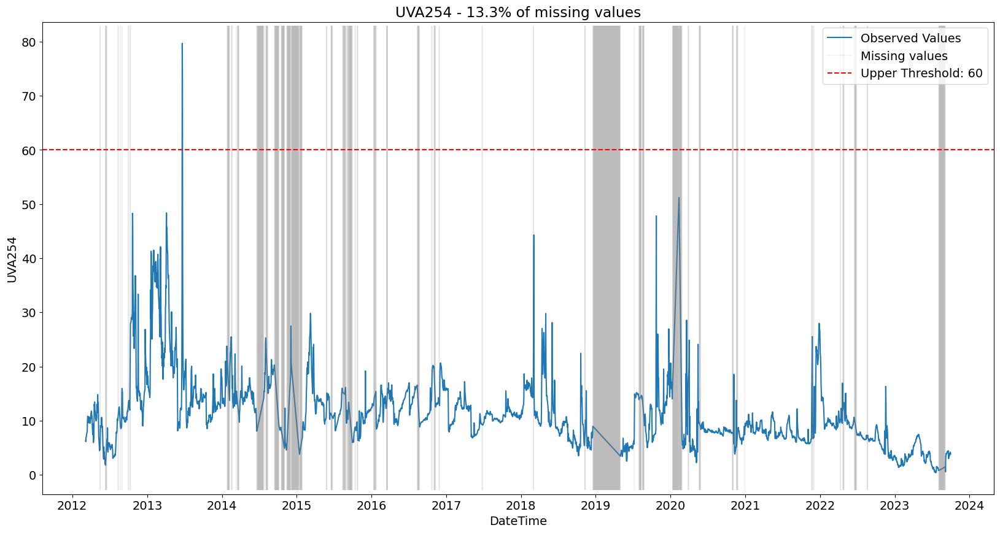

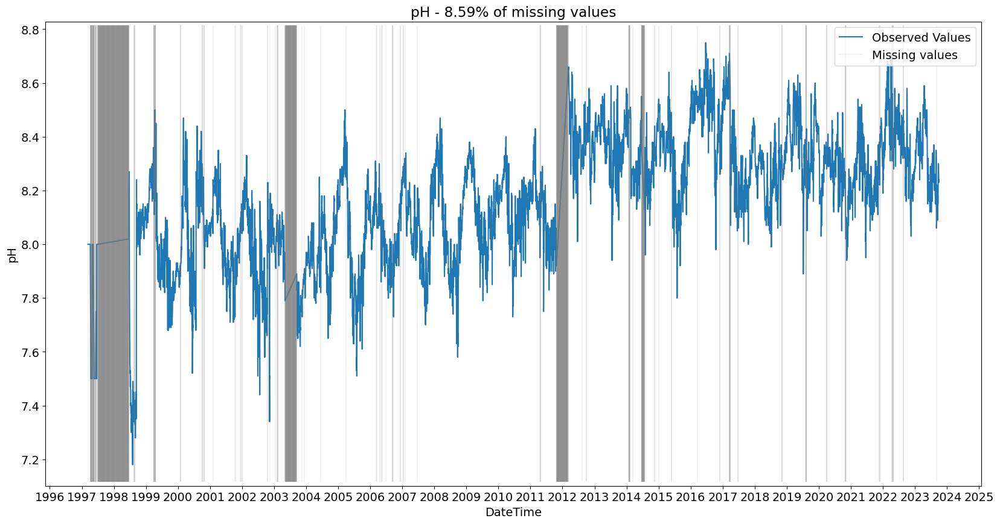

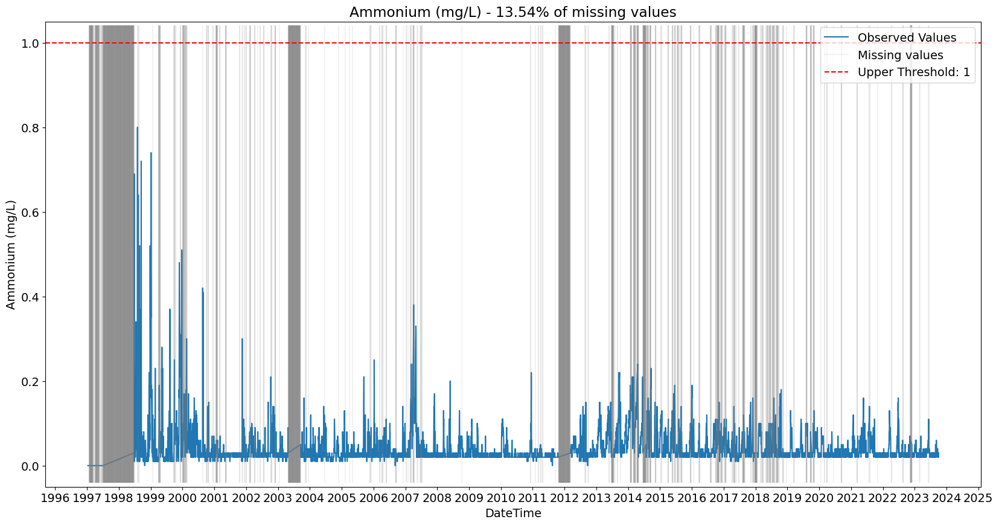

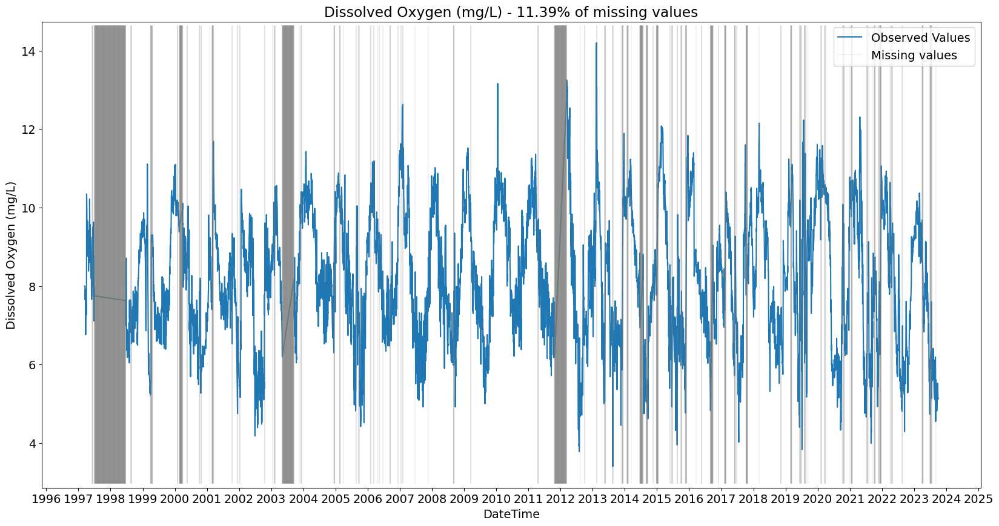

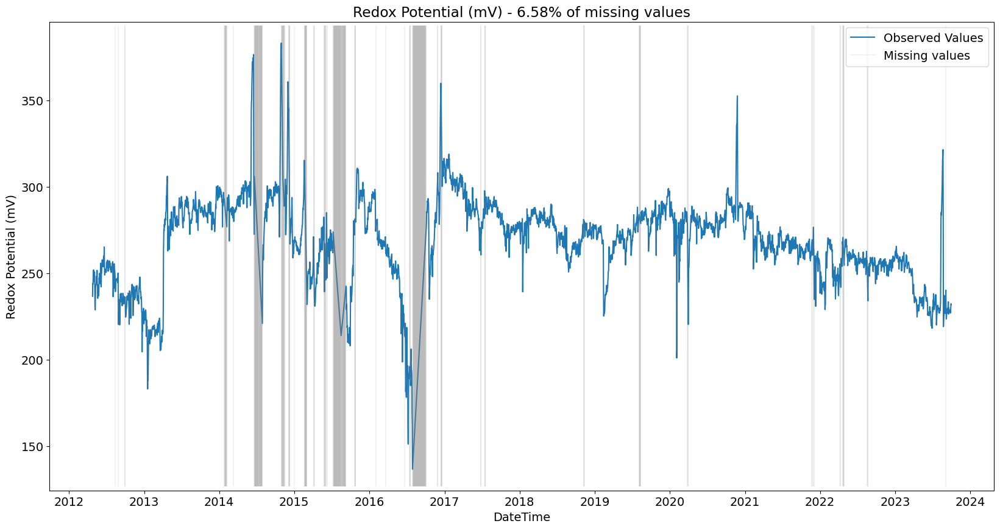

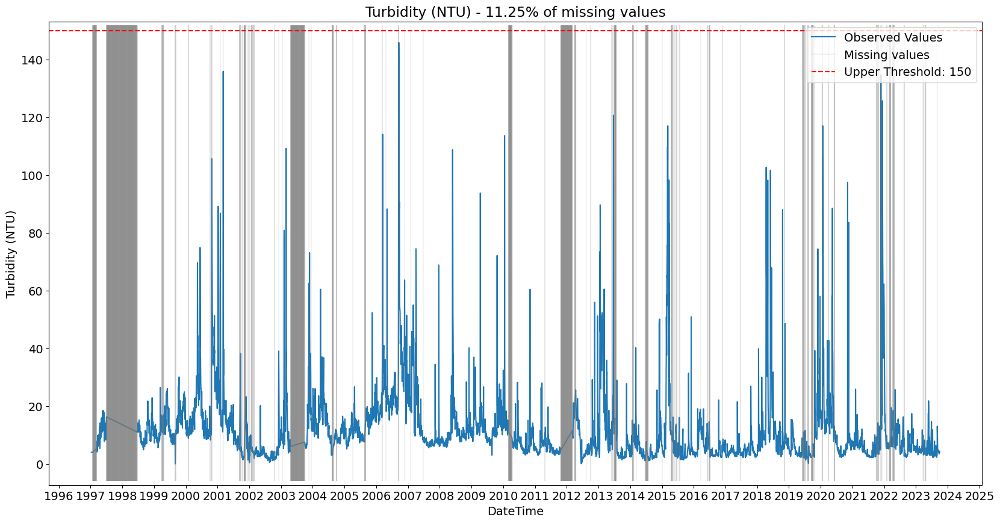

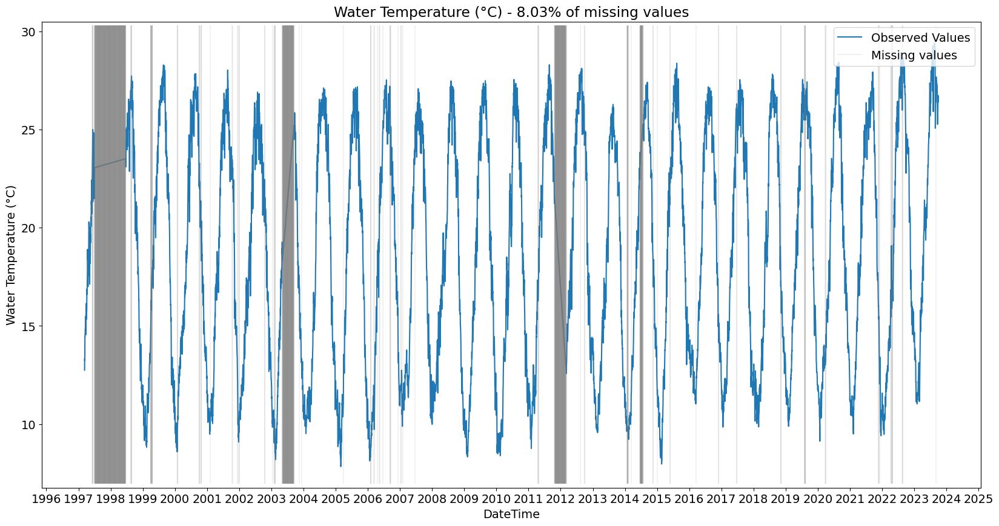

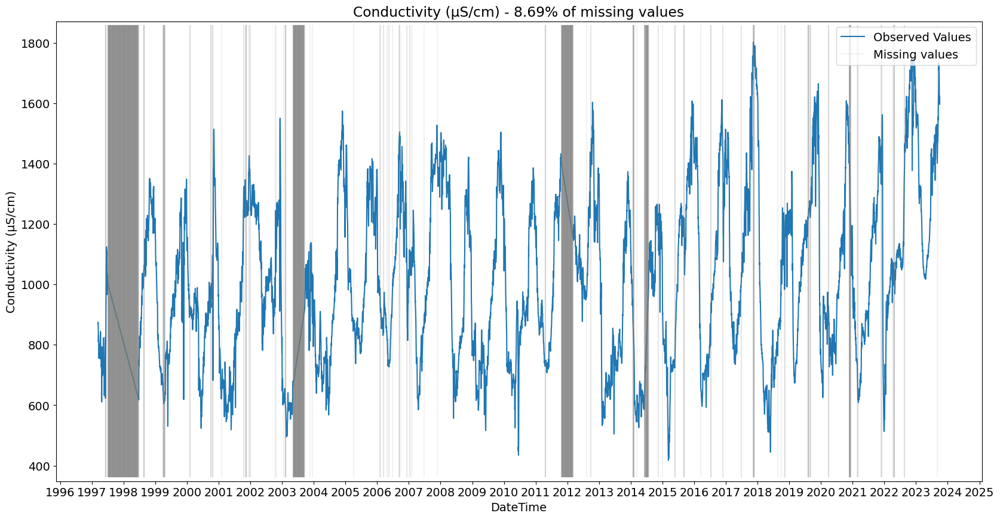

In [152]:
missing_values_df = {}

for feature, df in xerta_dfs.items():
    df["is_missing"] = df["Average"].isna()

    lower_threshold = None
    upper_threshold = None

    label = feature
    if feature == "nitrate":
        label = "Nitrate (mg/L)"

    elif feature == "ABS254":
        label = "UVA254"
        upper_threshold = 60

    elif feature == "Ammonium":
        label = "Ammonium (mg/L)"
        upper_threshold = 1

    elif feature == "conductivity":
        label = "Conductivity (µS/cm)"

    elif feature == "turbidity":
        label = "Turbidity (NTU)"
        upper_threshold = 150

    elif feature == "dissolvedoxygen":
        label = "Dissolved Oxygen (mg/L)"

    elif feature == "redoxpotential":
        label = "Redox Potential (mV)"

    elif feature == "watertemperature":
        label = "Water Temperature (°C)"

    missing_values_perc = (df["is_missing"].sum() / df.shape[0]) * 100
    missing_values_perc = missing_values_perc.round(2)

    missing_values_df[feature] = missing_values_perc

    plt.figure(figsize=(20, 10))
    sns.lineplot(
        data=df, x="DateTime", y="Average", label="Observed Values"
    )

    # Get current axis
    ax = plt.gca()

    # Set major ticks format
    years = mdates.YearLocator()  # every year
    years_fmt = mdates.DateFormatter("%Y")
    ax.xaxis.set_major_locator(years)
    ax.xaxis.set_major_formatter(years_fmt)

    for date in df[df["is_missing"]]["DateTime"]:
        plt.axvline(
            x=date, ymin=0.01, ymax=0.99, color="grey", alpha=0.1
        )

    # Plot an empty line with a label for the legend
    plt.plot([], [], color="grey", alpha=0.1, label="Missing values")

    if lower_threshold:
        plt.axhline(
            y=lower_threshold,
            color="purple",
            linestyle="--",
            label=f"Lower Threshold: {lower_threshold}",
        )

    if upper_threshold:
        plt.axhline(
            y=upper_threshold,
            color="r",
            linestyle="--",
            label=f"Upper Threshold: {upper_threshold}",
        )

    plt.title(
        label + " - " + str(missing_values_perc) + "% of missing values"
    )

    plt.ylabel(label)

    plt.legend(loc="upper right")
    plt.savefig(
        os.path.join(
            deliverable_folder,
            "missing_values",
            "Xerta",
            f"{feature}.png",
        )
    )

    print(feature)
    print("N samples:", df.shape[0])

    # compute the number of suspicious values
    n_sus = 0
    if lower_threshold:
        n_sus += df[df["Average"] < lower_threshold].shape[0]

    if upper_threshold:
        n_sus += df[df["Average"] > upper_threshold].shape[0]

    print("N suspicious:", n_sus)

missing_values_df = pd.DataFrame(
    missing_values_df.items(), columns=["Feature", "Missing values (%)"]
)

### Combine Datasets

In [445]:
# Rename the Average column to the feature name for each dataframe
# and keep only the DateTime and the feature column
for feature, df in xerta_dfs.items():
    df.rename(columns={"Average": feature}, inplace=True)
    df = df[["DateTime", feature, "is_missing"]]
    df.rename(
        columns={"is_missing": feature + "_is_missing"}, inplace=True
    )
    xerta_dfs[feature] = df

/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_54277/3925020041.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(
/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_54277/3925020041.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(
/var/folders/z5/plf0_b5s39nb0_gctbxmpndc0000gn/T/ipykernel_54277/3925020041.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(
/var/folders/z5/plf0_b

In [446]:
# combine all xerta datasets into a single dataframe

from functools import reduce

# Get a list of all dataframes
dfs = list(xerta_dfs.values())

# Use reduce to merge all dataframes
xerta_df = reduce(
    lambda left, right: pd.merge(left, right, on="DateTime"), dfs
)

### Fill NaNs

#### MICE month by month

In [447]:
%%script false --no-raise-error
# explicitly require this experimental feature
from sklearn.experimental import enable_iterative_imputer  # noqa

# now you can import normally from sklearn.impute
from sklearn.impute import IterativeImputer
from sklearn import linear_model

# Define MICE Imputer and fill missing values
mice_imputer = IterativeImputer(
    random_state=0,
    keep_empty_features=True,
    max_iter=30,
)

df_fill = xerta_df.copy()
df_fill = df_fill[
    df_fill.columns[
        df_fill.columns.isin(list(xerta_dfs.keys()) + ["DateTime"])
    ]
]

# fill missing values with MICE with imputation month by month
df_fill.sort_values(by="DateTime", inplace=True)
min_year = df_fill["DateTime"].iloc[0].year
max_year = df_fill["DateTime"].iloc[-1].year
df_fill_imputed = pd.DataFrame()
for year in range(min_year, max_year + 1):
    if year in df_fill["DateTime"].dt.year.unique():
        for month in range(1, 13):
            if (
                month
                in df_fill[df_fill["DateTime"].dt.year == year][
                    "DateTime"
                ].dt.month.unique()
            ):
                df_fill_data = df_fill[
                    (df_fill["DateTime"].dt.year == year)
                    & (df_fill["DateTime"].dt.month == month)
                ][df_fill.columns.difference(["DateTime"])].copy()

                # Save the indices of the rows with all missing values
                all_missing_indices = df_fill_data[
                    df_fill_data.isna().all(axis=1)
                ].index

                if not all_missing_indices.empty:
                    # Fill rows at only the indices contained all_missing_indices with ewma
                    df_fill_data.loc[all_missing_indices] = (
                        df_fill[
                            df_fill.columns.difference(["DateTime"])
                        ]
                        .loc[all_missing_indices]
                        .ewm(span=5)
                        .mean()
                    )

                imputed_data = pd.DataFrame(
                    mice_imputer.fit_transform(df_fill_data),
                    columns=df_fill_data.columns,
                )
                month_datetime = df_fill[
                    (df_fill["DateTime"].dt.year == year)
                    & (df_fill["DateTime"].dt.month == month)
                ]["DateTime"].copy()
                month_datetime.reset_index(drop=True, inplace=True)
                imputed_data["DateTime"] = month_datetime

                df_fill_imputed = pd.concat(
                    [df_fill_imputed, imputed_data], axis=0
                )
df_fill = df_fill_imputed

#### EWMA Imputer

In [448]:
%%script false --no-raise-error
df_fill = xerta_df.copy()
df_fill = df_fill[
    df_fill.columns[
        df_fill.columns.isin(list(xerta_dfs.keys()) + ["DateTime"])
    ]
]

# EWMA Imputer
for feature in xerta_dfs.keys():
    df_fill[feature] = df_fill[feature].fillna(
        pd.Series.ewm(
            df_fill[feature],
            times=df_fill["DateTime"],
            halflife=pd.Timedelta(days=7),
        ).mean()
    )

#### Interpolation

In [449]:
# fill missing values with interpolation
df_fill = xerta_df.copy()
df_fill.set_index("DateTime", inplace=True)
df_fill = df_fill.interpolate(method="time", limit_direction="both")
df_fill.reset_index(inplace=True)

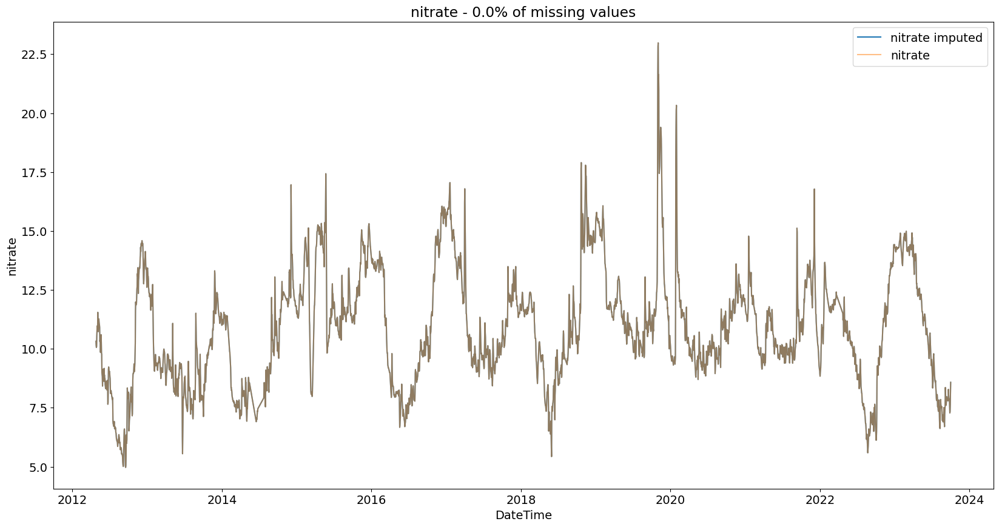

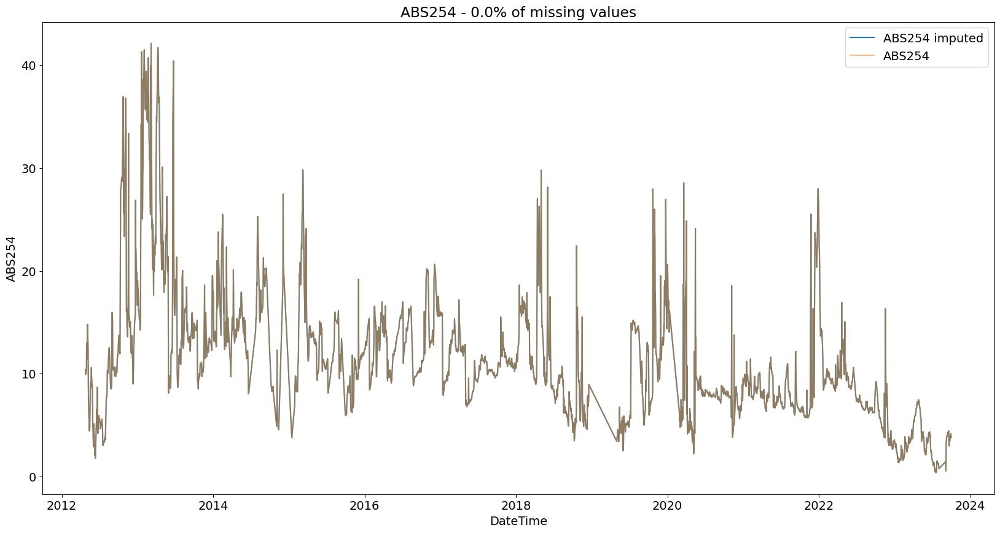

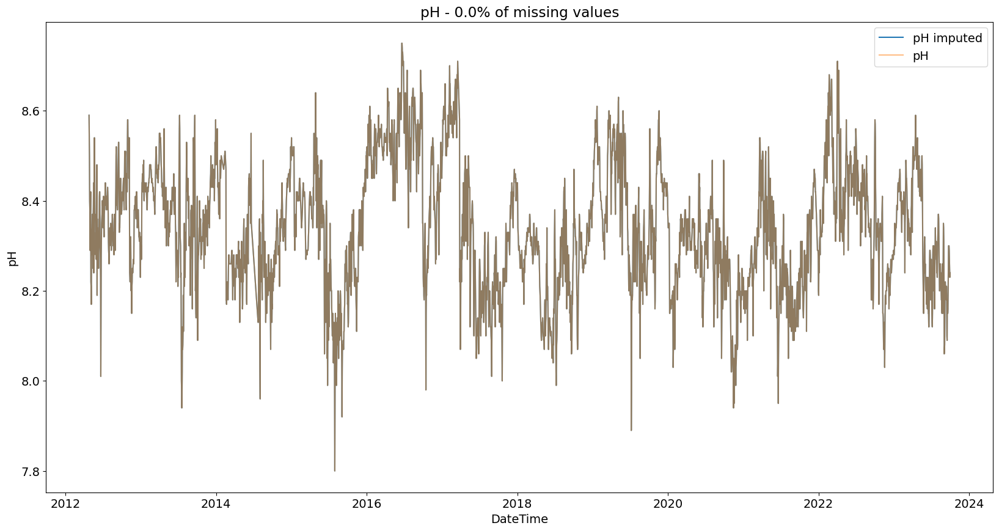

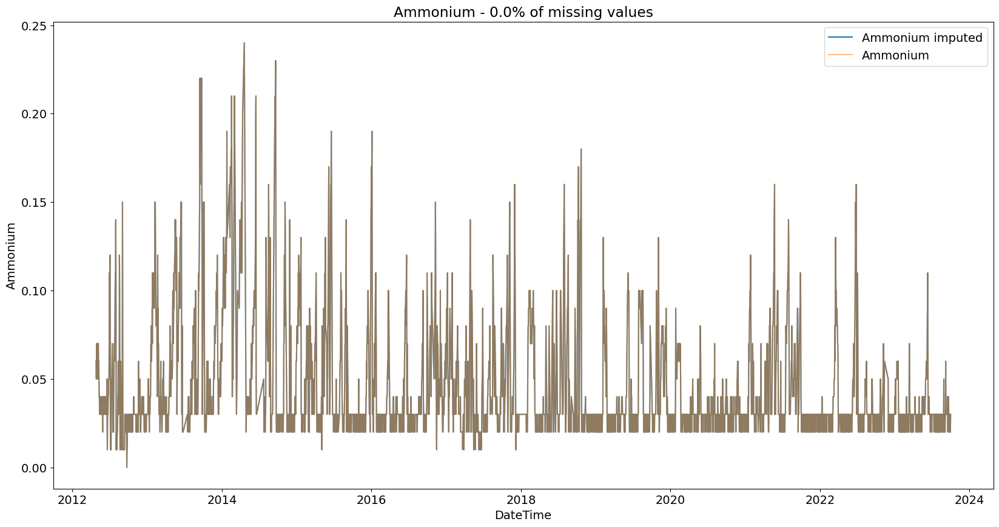

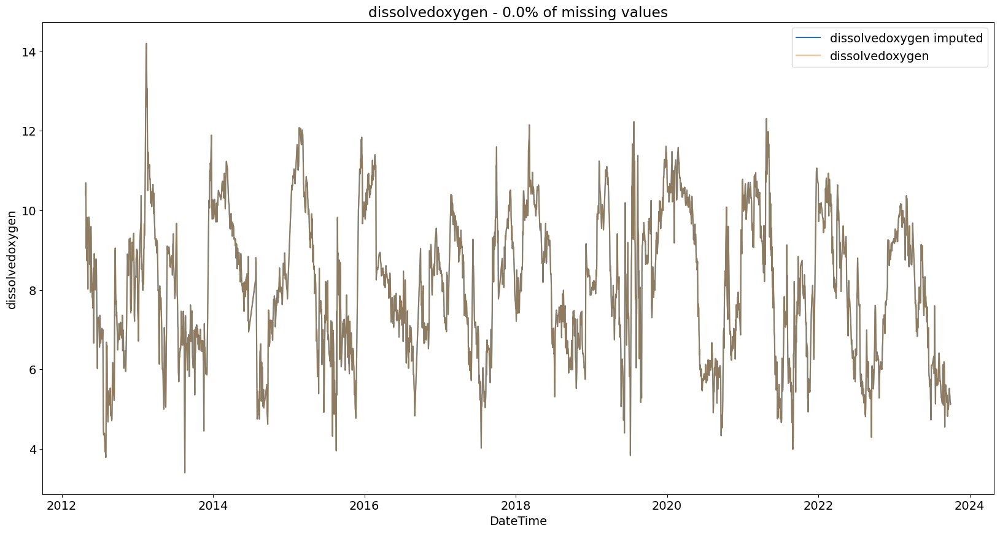

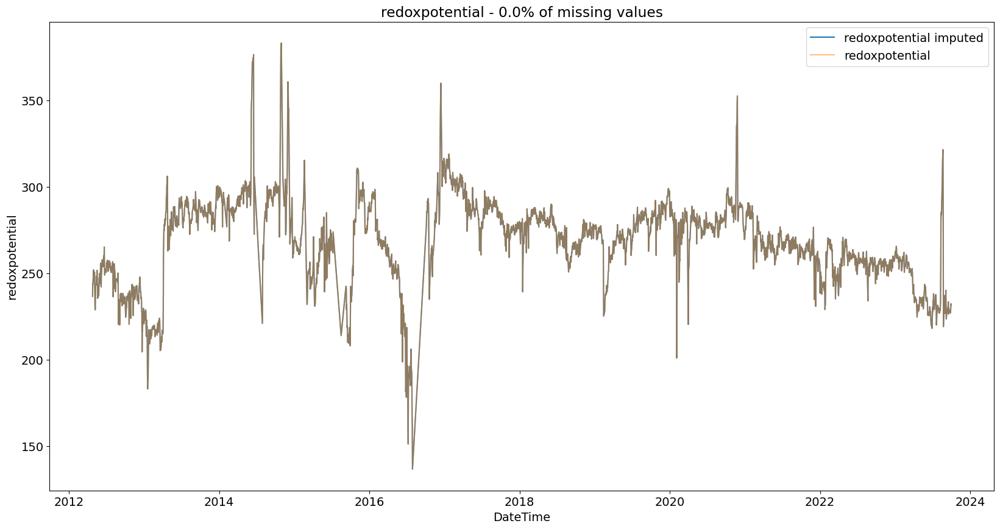

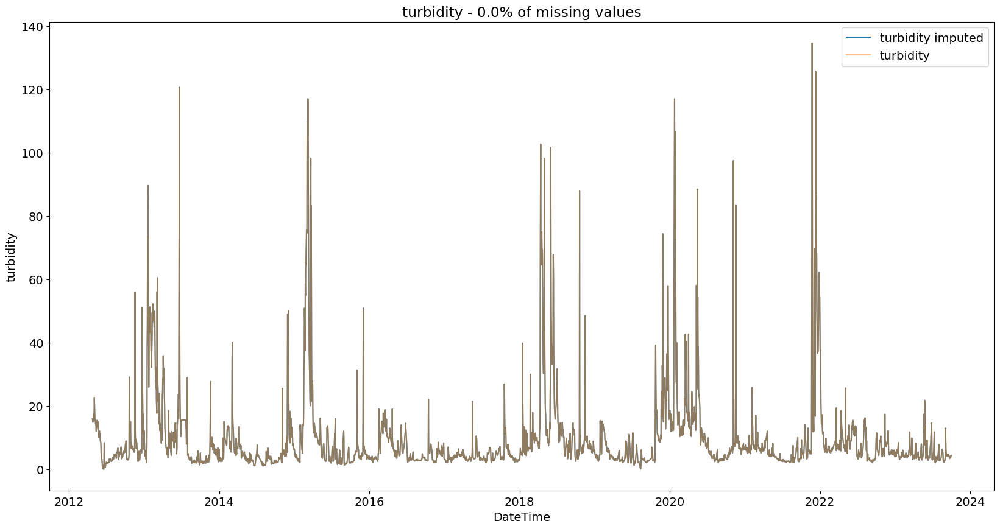

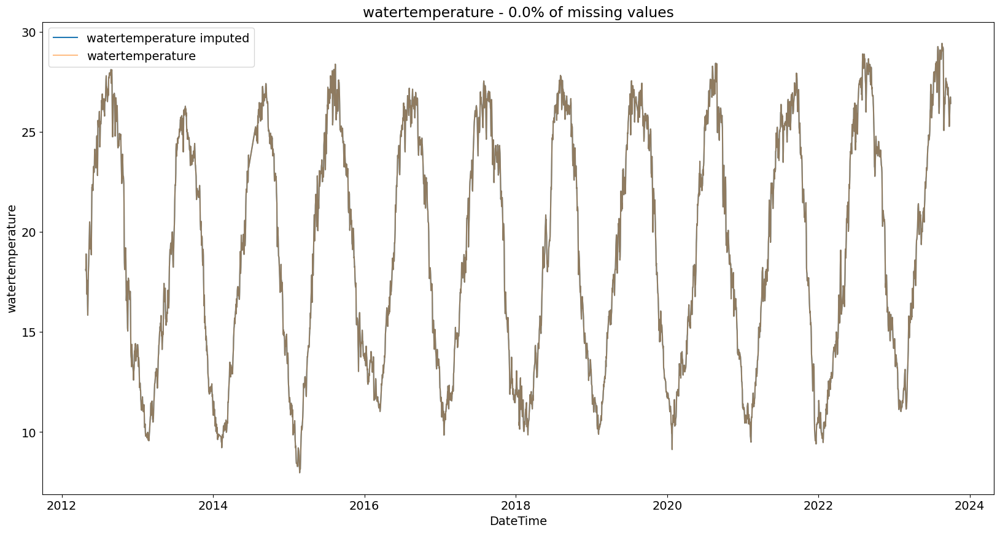

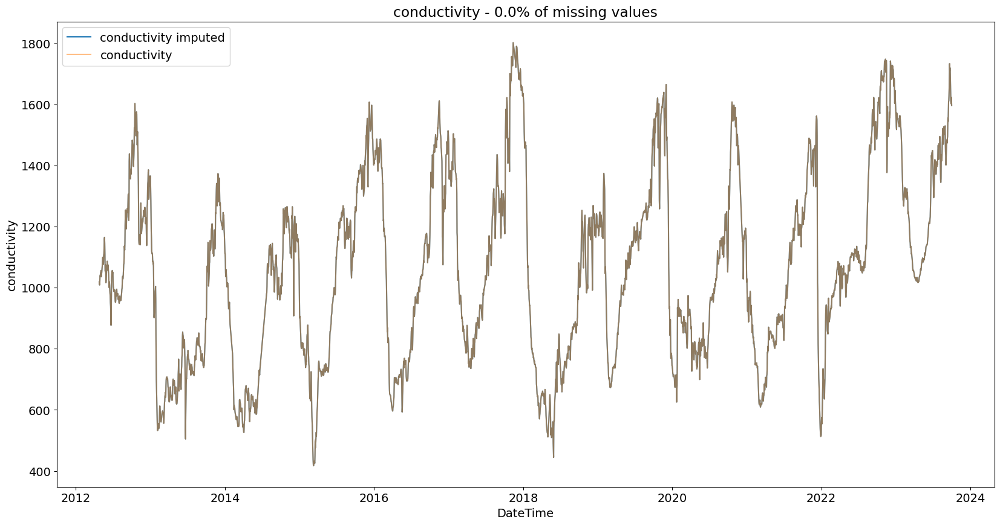

In [450]:
# plot the data for each feature
for feature in xerta_dfs.keys():
    df_fill[feature + "_is_missing"] = df_fill[feature].isna()

    plt.figure(figsize=(20, 10))
    sns.lineplot(
        data=df_fill,
        x="DateTime",
        y=feature,
        label=feature + " imputed",
    )
    sns.lineplot(
        data=xerta_df, x="DateTime", y=feature, label=feature, alpha=0.5
    )

    missing_values_perc = (
        df_fill[feature + "_is_missing"].sum() / df_fill.shape[0]
    ) * 100
    missing_values_perc = missing_values_perc.round(2)

    plt.title(
        feature
        + " - "
        + str(missing_values_perc)
        + "% of missing values"
    )
    plt.legend()
    plt.show()

In [451]:
xerta_df = df_fill

# Save Data

In [452]:
# drop boolean columns
tortosa_df = tortosa_df[
    tortosa_df.columns[~tortosa_df.columns.str.contains("_is_missing")]
]

guiamets_df = guiamets_df[
    guiamets_df.columns[
        ~guiamets_df.columns.str.contains("_is_missing")
    ]
]

mequinenza_df = mequinenza_df[
    mequinenza_df.columns[
        ~mequinenza_df.columns.str.contains("_is_missing")
    ]
]

xerta_df = xerta_df[
    xerta_df.columns[~xerta_df.columns.str.contains("_is_missing")]
]

In [298]:
tortosa_df.to_excel(
    os.path.join(clean_data_folder, "tortosa.xlsx"), index=False
)
guiamets_df.to_excel(
    os.path.join(clean_data_folder, "guiamets.xlsx"), index=False
)
mequinenza_df.to_excel(
    os.path.join(clean_data_folder, "mequinenza.xlsx"), index=False
)
xerta_df.to_excel(
    os.path.join(clean_data_folder, "xerta.xlsx"), index=False
)